In [577]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymannkendall as mann_kendall
import seaborn as sns
from scipy.stats import pearsonr
from scipy.stats import linregress


def translate_col_name(col_name: str):
    # Define a dictionary mapping column names to their plain English translations
    col_name_dict = {
        'AI': 'Aridity Index',
        'EI': 'Evaporative Index',
        'Ep': 'Potential Evaporation',
        'Pa': 'Precipitation',
        'ST': 'Seasonality Timing',
        'SI': 'Seasonality Index',
        'Sr': 'Root-zone Storage Capacity $S_{r,20y}$',
        'T': 'Temperature',
        'is_dur': 'Interstorm duration',
        'omega': 'Budyko curve (Fu) parameter',
        'change': 'Change',
        'normalized': 'Normalized',
        'p10': '10th percentile',
        'p90': '90th percentile',
        'catchment': 'Catchment',
        'mean': '\nDecadal Mean',
        'diff':'Change',
        'ups': 'Upstream',
        'area': 'Area\n',
        'r': 'Classified',
        'c': 'CORINE',
        '1': '(Artificial)\n',
        '2': '(Agricultural)\n',
        '3': '(Forest)\n',
        '4': '(Wetlands)\n',
        '5': '(Waterbodies)\n',
        '6': '(Masked (cloud)\n)',
        'h': 'HILDA +',
        'pct':'Percent',
        'ds':'Datasets Grouping',
        'ai': 'Aridity Grouping',
        'all':'All Datasets',
        'adj':'adjusted'
    }

    # Split the column name into words
    words = col_name.split('_')

    if words[0] == 'r':
        # Combine the translation of the first word with the translation of the second word in parentheses
        translated_words = [col_name_dict.get(words[0]), col_name_dict.get(words[1])]
        # Join the translated words and return the result
        return ' '.join(translated_words)
    
    elif words[0] == 'h' or words[1] == 'h':
        # Use the specific translation dictionary for 'h' columns
        specific_dict = {
            'h': 'HILDA +',
            'change': 'Change',
            'normalized': 'Normalized',
            'p10': '10th percentile',
            'p90': '90th percentile',
            'catchment': 'Catchment',
            'mean': 'Decadal Mean',
            'ups': 'Upstream\n',
            'area': 'Area\n',
            '1': '(Artificial)\n',
            '2': '(Cropland)\n',
            '3': '(Pasture/Rangeland)\n',
            '4': '(Forest)\n',
            '5': '(Grass/Shrubland)\n',
            '6': '(Sparse/No vegetation)\n',
            '7': '(Water)\n',
            '9': 'No data',}
        # Combine the translation of the first word with the translation of the second word in parentheses
        translated_words = [specific_dict.get(word) for word in words]
        # Join the translated words and return the result
        return ' '.join(translated_words)
    else:
        # Translate each word in the column name
        
        translated_words = [col_name_dict.get(word, word) for word in words]
        # print(translated_words)
        # Join the translated words and return the result
        return ' '.join(translated_words)


In [540]:
annual_lc = pd.read_excel('../Outputs/all/SR_Class_Areatable_annual.xlsx', index_col=None)
annual_lc.drop_duplicates(subset=['catchment', 'image_date'], keep='first', inplace=True)

In [541]:
annual_lc.loc[annual_lc.catchment=='Membre Pont', ['image_date', 'catchment', 'h_1']]

,image_date,catchment,h_1
0,1899-08-31 22:00:00,Membre Pont,1.607188
1,1930-08-31 22:00:00,Membre Pont,1.607188
2,1950-08-31 22:00:00,Membre Pont,1.002170
3,1960-08-31 22:00:00,Membre Pont,1.002170
4,1970-08-31 22:00:00,Membre Pont,1.002170
5,1980-08-31 22:00:00,Membre Pont,2.605173
6,1984-08-31 22:00:00,Membre Pont,2.605173
7,1985-08-31 22:00:00,Membre Pont,2.605173
8,1986-08-31 22:00:00,Membre Pont,3.257347
9,1987-08-31 22:00:00,Membre Pont,3.257347


In [527]:
merged = pd.read_excel('../Outputs/all/merge_HC_SR.xlsx', index_col=None)


In [528]:
merged.loc[merged.catchment=='La Meuse Stenay', ['image_date', 'catchment', 'h_1', 'h_1_change', 'AI_mean', 'AI_mean_diff', 'AI_change']]

,image_date,catchment,h_1,h_1_change,AI_mean,AI_mean_diff,AI_change
2297,1899-08-31 22:00:00,La Meuse Stenay,NaN,NaN,NaN,NaN,NaN
2298,1930-08-31 22:00:00,La Meuse Stenay,35.495948,NaN,NaN,NaN,NaN
2299,1950-08-31 22:00:00,La Meuse Stenay,35.555333,0.059385,NaN,NaN,NaN
2300,1960-08-31 22:00:00,La Meuse Stenay,36.486508,0.931174,NaN,NaN,NaN
2301,1970-08-31 22:00:00,La Meuse Stenay,37.171551,0.685044,NaN,NaN,NaN
2302,1998-08-31 22:00:00,La Meuse Stenay,41.715936,4.544385,0.779729,NaN,NaN
2303,2008-08-31 22:00:00,La Meuse Stenay,42.896023,1.180087,0.734029,-0.045700,-0.045700
2304,2018-08-31 22:00:00,La Meuse Stenay,45.161292,2.265269,0.844258,0.110229,0.110229
2305,1899-08-31 22:00:00,La Meuse Stenay,NaN,NaN,NaN,NaN,NaN
2306,1930-08-31 22:00:00,La Meuse Stenay,35.495948,NaN,NaN,NaN,NaN


In [529]:
merged.drop_duplicates(subset=['catchment', 'image_date'], keep='first', inplace=True)

In [595]:
merged.loc[merged.catchment==8009, ['image_date', 'catchment', 'h_1', 'h_1_change', 'AI_mean', 'AI_mean_diff', 'AI_change']]

,image_date,catchment,h_1,h_1_change,AI_mean,AI_mean_diff,AI_change
0,1899-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
1,1930-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
2,1950-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
3,1960-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
4,1970-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
5,1979-08-31 22:00:00,8009,NaN,NaN,0.446784,NaN,NaN
6,1989-08-31 22:00:00,8009,NaN,NaN,0.402179,-0.044605,-0.044605
7,1999-08-31 22:00:00,8009,NaN,NaN,0.393159,-0.009020,-0.009020
8,2009-08-31 22:00:00,8009,NaN,NaN,0.388700,-0.004459,-0.004459


In [596]:
merged_df = merged.copy()
merged.loc[merged.catchment==8009, ['image_date', 'catchment', 'h_1', 'h_1_change', 'AI_mean', 'AI_mean_diff', 'AI_change']]

,image_date,catchment,h_1,h_1_change,AI_mean,AI_mean_diff,AI_change
0,1899-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
1,1930-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
2,1950-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
3,1960-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
4,1970-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
5,1979-08-31 22:00:00,8009,NaN,NaN,0.446784,NaN,NaN
6,1989-08-31 22:00:00,8009,NaN,NaN,0.402179,-0.044605,-0.044605
7,1999-08-31 22:00:00,8009,NaN,NaN,0.393159,-0.009020,-0.009020
8,2009-08-31 22:00:00,8009,NaN,NaN,0.388700,-0.004459,-0.004459


In [ ]:
list(merged_df.keys())

In [549]:
keys = ['EVI_area', 'GNDVI_area', 'NBR_area', 'NDFI_area', 'NDMI_area', 'NDSI_area', 'NDVI_area', 'TCA_area', 'TCB_area', 'TCG_area', 'TCW_area', 
        'r_1', 'r_2', 'r_3', 'r_4', 'r_5', 'r_6', 'c_1', 'c_2', 'c_3', 'c_4', 'c_5',  'h_1', 'h_2', 'h_3', 'h_4', 'h_5', 'h_6',
        'B1_mean', 'B1_stdDev', 'B2_mean', 'B2_stdDev', 'B3_mean', 'B3_stdDev', 'B4_mean', 'B4_stdDev', 'B5_mean', 'B5_stdDev', 'B7_mean', 'B7_stdDev', 
        'EVI_mean', 'EVI_stdDev', 'GNDVI_mean', 'GNDVI_stdDev', 'NBR_mean', 'NBR_stdDev', 'NDFI_mean', 'NDFI_stdDev', 'NDMI_mean', 'NDMI_stdDev', 'NDSI_mean', 
        'NDSI_stdDev', 'NDVI_mean', 'NDVI_stdDev', 'TCA_mean', 'TCA_stdDev', 'TCB_mean', 'TCB_stdDev', 'TCG_mean', 'TCG_stdDev', 'TCW_mean', 'TCW_stdDev']

SR_keys = [
        'B1_mean', 'B1_stdDev', 'B2_mean', 'B2_stdDev', 'B3_mean', 'B3_stdDev', 'B4_mean', 'B4_stdDev', 'B5_mean', 'B5_stdDev', 'B7_mean', 'B7_stdDev', 
        'EVI_mean', 'EVI_stdDev', 'GNDVI_mean', 'GNDVI_stdDev', 'NBR_mean', 'NBR_stdDev', 'NDFI_mean', 'NDFI_stdDev', 'NDMI_mean', 'NDMI_stdDev', 'NDSI_mean', 
        'NDSI_stdDev', 'NDVI_mean', 'NDVI_stdDev', 'TCA_mean', 'TCA_stdDev', 'TCB_mean', 'TCB_stdDev', 'TCG_mean', 'TCG_stdDev', 'TCW_mean', 'TCW_stdDev']

area_keys = ['EVI_area', 'GNDVI_area', 'NBR_area', 'NDFI_area', 'NDMI_area', 'NDSI_area', 'NDVI_area', 'TCA_area', 'TCB_area', 'TCG_area', 'TCW_area', # each area key relates to a km2 
             'r_1', 'r_2', 'r_3', 'r_4', 'r_5', 'r_6', 
             'h_1', 'h_2', 'h_3', 'h_4', 'h_5', 'h_6',
             'c_1', 'c_2', 'c_3', 'c_4', 'c_5',
            'catchment_area']
HC_keys = ['AI_mean','EI_mean','Ep_mean','Pa_mean','SI_mean','ST_mean','Sr_mean','T_mean','is_dur_mean','omega_mean',]

ups_area_keys = ['ups_'+key for key in area_keys]

ups_area_norm_keys = ['ups_'+key+'_normalized' for key in area_keys]


504   1899-08-31 22:00:00
505   1930-08-31 22:00:00
506   1950-08-31 22:00:00
507   1960-08-31 22:00:00
508   1970-08-31 22:00:00
509   1980-08-31 22:00:00
510   1984-08-31 22:00:00
511   1985-08-31 22:00:00
512   1986-08-31 22:00:00
513   1987-08-31 22:00:00
514   1988-08-31 22:00:00
515   1989-08-31 22:00:00
516   1990-08-31 22:00:00
517   1991-08-31 22:00:00
518   1992-08-31 22:00:00
519   1993-08-31 22:00:00
520   1994-08-31 22:00:00
521   1995-08-31 22:00:00
522   1996-08-31 22:00:00
523   1997-08-31 22:00:00
524   1998-08-31 22:00:00
525   1999-08-31 22:00:00
526   2000-08-31 22:00:00
527   2001-08-31 22:00:00
528   2002-08-31 22:00:00
529   2003-08-31 22:00:00
530   2004-08-31 22:00:00
531   2005-08-31 22:00:00
532   2006-08-31 22:00:00
533   2007-08-31 22:00:00
534   2008-08-31 22:00:00
535   2009-08-31 22:00:00
536   2010-08-31 22:00:00
537   2011-08-31 22:00:00
538   2012-08-31 22:00:00
539   2013-08-31 22:00:00
540   2014-08-31 22:00:00
541   2015-08-31 22:00:00
542   2016-0

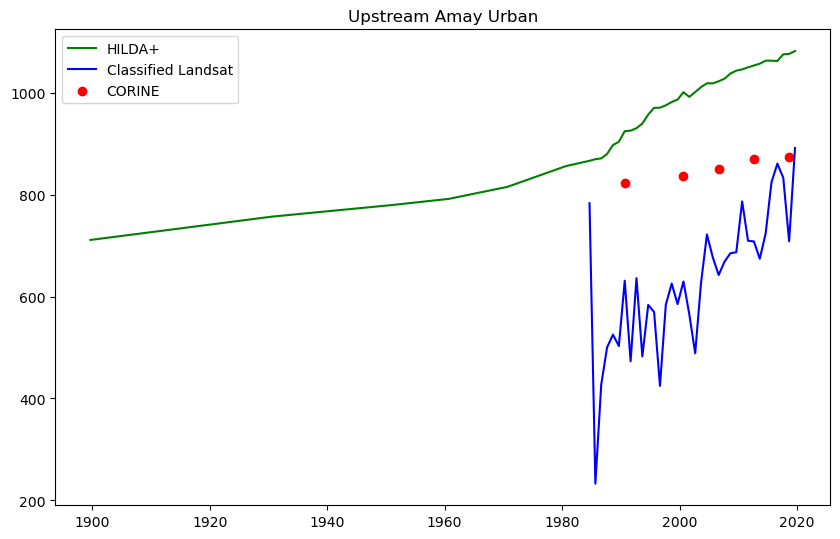

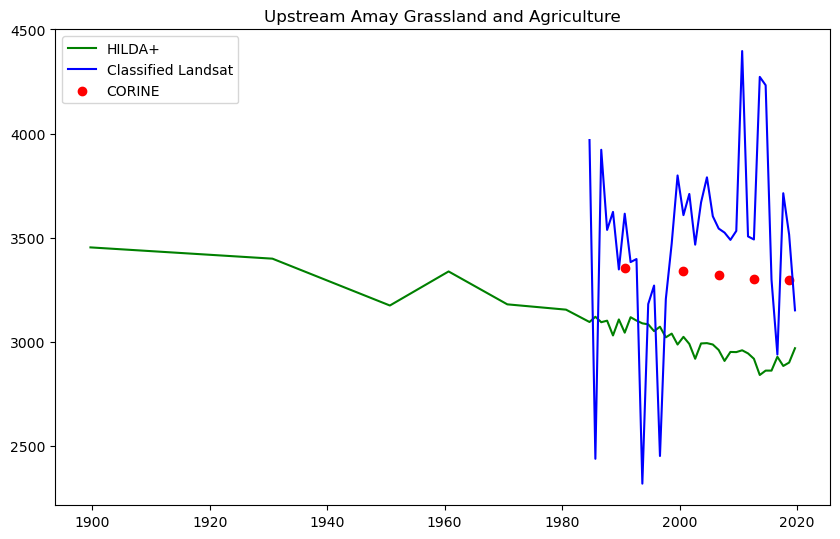

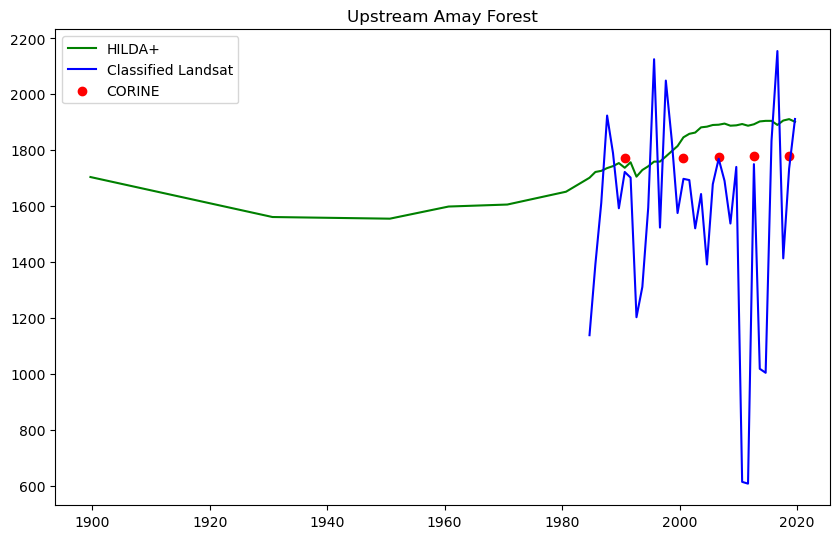

In [536]:
df = annual_lc[annual_lc.dataset=='Meuse']
display(df[df.catchment=='Amay'].image_date)
# print(list(df[df.catchment=='Amay'].keys()))


catchment = 'Amay'
fig, ax = plt.subplots(figsize=(10, 6.18))
ax.set_title('Upstream '+catchment+' Urban')
ax.plot(df[df.catchment == catchment].image_date, df[df.catchment == catchment].ups_h_1, c='g', label='HILDA+')
ax.plot(df[df.catchment == catchment].image_date, df[df.catchment == catchment].ups_r_1, c='b', label='Classified Landsat')
ax.scatter(df[df.catchment == catchment].image_date, df[df.catchment == catchment].ups_c_1, c='r', label='CORINE')
ax.legend()


fig, ax = plt.subplots(figsize=(10, 6.18))
ax.set_title('Upstream '+catchment+' Grassland and Agriculture')
ax.plot(df[df.catchment == catchment].image_date, df[df.catchment == catchment].ups_h_2 + df[df.catchment == catchment].ups_h_3, c='g',label='HILDA+')
ax.plot(df[df.catchment == catchment].image_date, df[df.catchment == catchment].ups_r_2, c='b',label='Classified Landsat')
ax.scatter(df[df.catchment == catchment].image_date, df[df.catchment == catchment].ups_c_2, c='r',label='CORINE')
ax.legend()

fig, ax = plt.subplots(figsize=(10, 6.18))
ax.set_title('Upstream '+catchment+' Forest')
ax.plot(df[df.catchment == catchment].image_date, df[df.catchment == catchment].ups_h_4, c='g',label='HILDA+')
ax.plot(df[df.catchment == catchment].image_date, df[df.catchment == catchment].ups_r_3, c='b',label='Classified Landsat')
ax.scatter(df[df.catchment == catchment].image_date, df[df.catchment == catchment].ups_c_3, c='r', label='CORINE')
ax.legend()

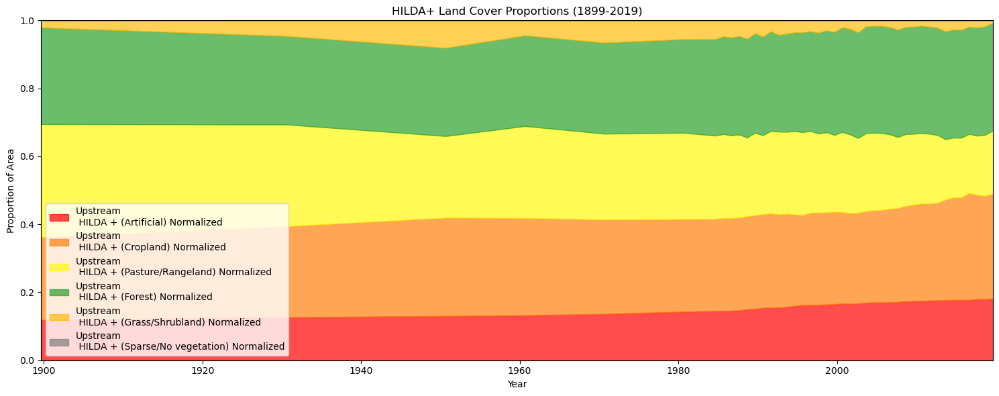

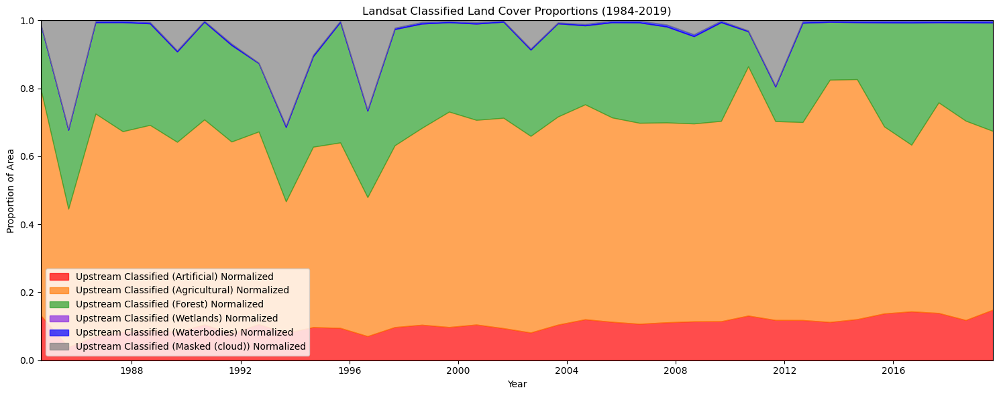

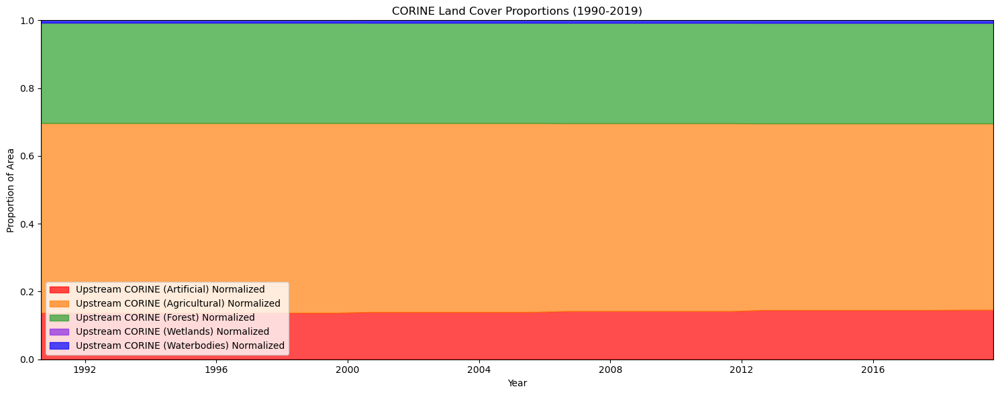

In [542]:
HILDA_keys = ups_area_norm_keys[-12:-6]
Classified_LS_keys = ups_area_norm_keys[-18:-12]
classified_C_keys = ups_area_norm_keys[-6:-1]

years = [1899, 1984, 1990]

df = meuse
df = df[df.catchment == catchment]

key_sets = [HILDA_keys, Classified_LS_keys, classified_C_keys]
labels = ['HILDA', 'Classified LS', 'Classified C']

colors = ['#ff0000', '#ff7f0e', '#2ca02c', '#8a2be2', '#0000ff', '#808080']
# Define the custom color palette
d1 = {'h_1': colors[0], 'h_2': colors[1], 'h_3': '#fff80e', 'h_4': colors[2], 'h_5': "#ffbc0e", 'h_6': '#808080', 'h_7': colors[3], 'h_9': '#808080'}
d2 = {f'r_{i+1}': colors[i] for i in range(len(colors))}
d3 = {f'c_{i+1}': colors[i] for i in range(len(colors))}


color_dicts = [d1,d2,d3]

title_list = ['HILDA+ Land Cover Proportions (1899-2019)', 'Landsat Classified Land Cover Proportions (1984-2019)', 'CORINE Land Cover Proportions (1990-2019)']


for i, keys in enumerate(key_sets):
    fig, ax = plt.subplots(figsize=(15, 6), sharex=True)
    
    if i == 2:
        # Select the relevant columns for the key set
        data = df[keys + ['image_date']]
        data = data.interpolate('ffill')
        # display(data)
    else:
        data = df[keys + ['image_date']]
    
    # Initialize the cumulative sum
    cum_sum = np.zeros(len(data))
    
    colors = color_dicts[i]
    
    for j, k in enumerate(keys):
        class_identifier = k.split('_')[1]+'_'+k.split('_')[2]
        
        # print(class_identifier)
    
    # Calculate the cumulative sum of previous keys' values
        cum_sum += np.nan_to_num(data[keys[j-1]]) if j > 0 else 0

        # Plot the area plot for the key set
        ax.fill_between(data['image_date'], y1=cum_sum, y2=cum_sum + data[k], color=colors.get(class_identifier, 'gray'), alpha=0.7, label=translate_col_name(k))
        # print(k, translate_col_name(k))
    
    
    # Set the y-axis limits
    ax.set_ylim([0, 1])
    
    # Find the first non-NaN index for keys[0]
    xmin = data.loc[data[keys[0]].notna()].index[0]
    
    # Set the x-axis limit with the updated xmin
    ax.set_xlim(data.image_date[data.image_date.dt.year >= years[i]].iloc[0], data.image_date.max())
    
    # Set the y-axis label
    ax.set_ylabel('Proportion of Area')
    
    ax.set_title(title_list[i])
    
    # Add a legend
    ax.legend(loc= 'lower left')
    
    # Set the x-axis label
    ax.set_xlabel('Year')

    # Show the plot
    plt.tight_layout()
    plt.show()

In [543]:
def mk_table(og, keys):
    

    # Create an empty DataFrame with the specified headers
    df = pd.DataFrame(columns=['catchment', 'len','col', 'trend', 'h', 'p', 'z', 'tau', 's', 'var_s', 'slope', 'intercept'])

    # Create a list to store the data
    data = []

    for i, name in enumerate(list(og.catchment.drop_duplicates().values)):
        for j , col in enumerate(keys):
            try:
                ser = og.loc[og.catchment == name, col]
                trend,h,p,z,tau,s,var_s,slope,intercept = mann_kendall.original_test(og.loc[og.catchment == name, col])
                row_data = {'catchment':name,
                            'len':len(ser),
                            'col':col,
                            'trend': trend, 
                            'h': h, 
                            'p': p, 
                            'z': z, 
                            'tau': tau, 
                            's': s, 
                            'var_s': var_s, 
                            'slope': slope, 
                            'intercept': intercept}
                data.append(row_data)
            except ZeroDivisionError as e:
                None
                # print(f'{e}, {name}, {col} (no pixels to count)')

        # if name == name:
        #     break

    # Concatenate the data into a DataFrame
    df = pd.concat([df, pd.DataFrame(data)])

    # Print the resulting DataFrame
    display(df)
    
    return df
    

    
def plot_mk_trend(df):
    # Group the data by col and trend
    grouped_data = df.groupby(['col', 'trend'])['catchment'].count()

    # Create a pivot table to reshape the data
    pivot_data = grouped_data.reset_index().pivot(index='col', columns='trend', values='catchment')

    # Normalize the data by column to get percentages
    normalized_data = pivot_data.div(pivot_data.sum(axis=1), axis=0)

    # Define the color palette for the plot
    colors = {'decreasing': 'red', 'no trend': 'grey', 'increasing': 'green'}

    # Sort the bars by the 'no_trend' trend column in descending order
    sort_by = normalized_data['no trend'].sort_values(ascending=True).index

    # Plot the data as stacked bar plots
    fig, ax = plt.subplots(figsize=(10, 15))
    normalized_data.loc[sort_by].plot(kind='barh', stacked=True, alpha=0.7, width=0.8, edgecolor='black',
                              color=[colors[t] for i,t in enumerate(normalized_data.columns)], lw=0.5, ax=ax)

    # Set the axis labels and legend
    ax.set_xlabel('Frequency')
    ax.set_ylabel('Index')
    ax.legend(title='Trend', loc='lower center')

    # Add title and subtitle
    title = "Mann-Kendall Annual Timeseries Trends in\nLandsat-derived Land-Use Land-Cover Change Indices"
    subtitle = f"Number of catchments: {len(df.catchment.drop_duplicates().values)}, Years analyzed: 1984-2019"
    ax.set_title(f"{title}\n{subtitle}")

    # Set x-axis limits
    ax.set_xlim([0, 1])

    # Invert y-axis to show highest trend on top
    ax.invert_yaxis()

    plt.show()
    
def plot_mk_trend(df):
    # Group the data by col and trend
    grouped_data = df.groupby(['col', 'trend'])['catchment'].count()

    # Create a pivot table to reshape the data
    pivot_data = grouped_data.reset_index().pivot(index='col', columns='trend', values='catchment')

    # Normalize the data by column to get percentages
    normalized_data = pivot_data.div(pivot_data.sum(axis=1), axis=0)

    # Define the color palette for the plot
    colors = {'decreasing': 'red', 'no trend': 'grey', 'increasing': 'green'}

    # Sort the bars by the 'no_trend' trend column in descending order
    sort_by = normalized_data['no trend'].sort_values(ascending=True).index

    

    # Plot the data as stacked bar plots
    fig, ax = plt.subplots(figsize=(10, 15))
    plot_data = normalized_data.loc[sort_by]
    plot_data.plot(kind='barh', stacked=True, alpha=0.7, width=0.8, edgecolor='black',
                   color=[colors[t] for t in plot_data.columns], lw=0.5, ax=ax)

    # Set the axis labels and legend
    ax.set_xlabel('Frequency')
    ax.set_ylabel('Index')
    ax.legend(title='Trend', loc='lower center')


    # Add a duplicate index axis on the right side with translated labels
   

    # Add title and subtitle
    title = "Mann-Kendall Annual Timeseries Trends in\nLandsat-derived Land-Use Land-Cover Change Indices"
    subtitle = f"Number of catchments: {len(df.catchment.drop_duplicates().values)}, "+r" Years analyzed: 1984-2019, $p_{sig} <= 0.05$"
    ax.set_title(f"{title}\n{subtitle}")

    # Set x-axis limits
    ax.set_xlim([0, 1])

    # Invert y-axis to show the highest trend on top
    ax.invert_yaxis()
    
    # print(ax.get_yticklabels()[0][-1])
    
    # Translate the column header strings using the translate_col_name function
    translated_columns = [translate_col_name(str(col.get_text())) for col in list(ax.get_yticklabels())]
    print(translated_columns)
    ax2 = ax.twiny()
    ax2.set_ylim(ax.get_ylim())
    ax2.set_yticks(ax.get_yticks())
    ax2.set_yticklabels(translated_columns)

    plt.show()


    
def plot_mk_p(df):
    # Group the data by col
    grouped_data = df.groupby(['col'])['p'].apply(lambda x: (x < 0.05).sum() / len(x))
    
    # Sort the bars by the proportion of significant values in descending order
    sort_by = grouped_data.sort_values(ascending=False).index

    # Plot the data as stacked bar plots
    fig, ax = plt.subplots(figsize=(10, 15))
    ax.barh(sort_by, grouped_data[sort_by], color='green')
    ax.barh(sort_by, 1 - grouped_data[sort_by], left=grouped_data[sort_by], color='grey')

    # Set the axis labels and legend
    ax.set_xlabel('Proportion Significant')
    ax.set_ylabel('Index')
    ax.legend(['Significant', 'Non-significant'], loc='lower right')

    # Add title and subtitle
    title = "Mann-Kendall Annual Timeseries p-values in\nLandsat-derived Land-Use Land-Cover Change Indices"
    subtitle = f"Number of catchments: {len(df.catchment.drop_duplicates().values)}, Years analyzed: 1984-2019, $p <= 0.05$"
    ax.set_title(f"{title}\n{subtitle}")

    # Set x-axis limits
    ax.set_xlim([0, 1])

    # Invert y-axis to show highest trend on top
    ax.invert_yaxis()

    plt.show()

In [550]:
mk_df_HC = mk_table(merged_df, HC_keys)
mk_df_HC.to_excel('../Outputs/all/HC_decadal_mean_trends.xlsx', index=0)
mk_df_annual_lc_trend = mk_table(annual_lc[pd.to_datetime(annual_lc['image_date']).dt.year >= 1984][area_keys+['catchment']], area_keys)
mk_df_annual_lc_trend.to_excel('../Outputs/all/All_Areas_MannKendall_Annual_1984plus_area_trends.xlsx', index=0)

# mk_df = pd.read_excel('../Outputs/all/MannKendall_Annual.xlsx')

,catchment,len,col,trend,h,p,z,tau,s,var_s,slope,intercept
0,8009,9,AI_mean,no trend,False,0.089429,-1.698416,-1.000000,-6.0,8.666667,-0.014191,0.489907
1,8009,9,EI_mean,no trend,False,1.000000,0.000000,0.000000,0.0,8.666667,-0.002108,0.336774
2,8009,9,Ep_mean,no trend,False,0.089429,1.698416,1.000000,6.0,8.666667,0.013556,1.059611
3,8009,9,Pa_mean,no trend,False,0.089429,1.698416,1.000000,6.0,8.666667,0.135654,2.005003
4,8009,9,SI_mean,no trend,False,0.308180,1.019049,0.666667,4.0,8.666667,0.010028,0.138458
...,...,...,...,...,...,...,...,...,...,...,...,...
2855,Wiheries,7,ST_mean,no trend,False,1.000000,0.000000,1.000000,1.0,1.000000,0.025926,-0.076261
2856,Wiheries,7,Sr_mean,no trend,False,1.000000,0.000000,1.000000,1.0,1.000000,38.563965,-51.568661
2857,Wiheries,7,T_mean,no trend,False,1.000000,0.000000,1.000000,1.0,1.000000,0.225334,8.726493
2858,Wiheries,7,is_dur_mean,no trend,False,1.000000,0.000000,1.000000,1.0,1.000000,0.150477,3.136704


,catchment,len,col,trend,h,p,z,tau,s,var_s,slope,intercept
0,Membre Pont,36,EVI_area,no trend,False,5.144035e-02,1.947788,0.228571,144.0,5390.000000,1.410112e-02,912.772089
1,Membre Pont,36,GNDVI_area,no trend,False,1.606311e-01,1.402952,0.165079,104.0,5390.000000,1.700267e-02,912.719991
2,Membre Pont,36,NBR_area,no trend,False,9.457025e-01,0.068104,0.009524,6.0,5390.000000,1.744492e-03,910.281924
3,Membre Pont,36,NDFI_area,no trend,False,1.000000e+00,0.000000,0.000000,0.0,5390.000000,4.652928e-04,907.657805
4,Membre Pont,36,NDMI_area,no trend,False,2.699002e-01,-1.103292,-0.130159,-82.0,5390.000000,-7.357241e-01,833.457458
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,7301500,36,h_2,no trend,False,1.729437e-01,-1.362806,-0.160317,-101.0,5384.333333,-1.418883e+00,1868.603267
4894,7301500,36,h_3,no trend,False,8.486879e-01,-0.190793,-0.023810,-15.0,5384.333333,-2.232839e-01,4990.635759
4895,7301500,36,h_5,increasing,True,1.359974e-10,6.420310,0.747619,471.0,5359.000000,1.482972e+00,28.010325
4896,7301500,36,h_6,decreasing,True,2.638567e-06,-4.697119,-0.534921,-337.0,5117.000000,-1.417517e-13,1.046878


['Aridity Index Decadal Mean', 'Evaporative Index Decadal Mean', 'Potential Evaporation Decadal Mean', 'Precipitation Decadal Mean', 'Seasonality Index Decadal Mean', 'Seasonality Timing Decadal Mean', 'Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean', 'Temperature Decadal Mean', 'is dur Decadal Mean', 'Budyko curve (Fu) parameter Decadal Mean']


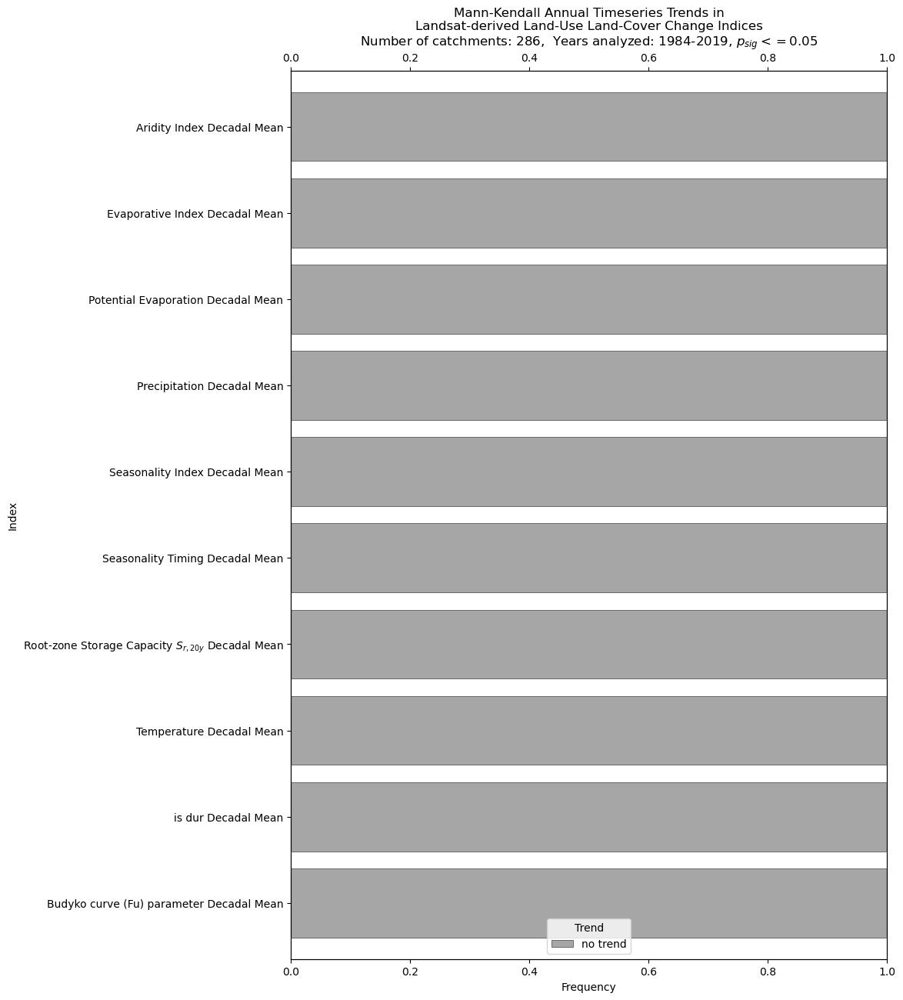

['HILDA + (Cropland)', 'HILDA + (Forest)', 'HILDA + (Artificial)', 'HILDA + (Pasture/Rangeland)', 'HILDA + (Grass/Shrubland)', 'Classified (Forest)', 'HILDA + (Sparse/No vegetation)', 'Classified (Artificial)', 'TCW Area\n', 'NDMI Area\n', 'CORINE (Artificial)', 'GNDVI Area\n', 'TCG Area\n', 'Classified (Wetlands)', 'TCA Area\n', 'NDFI Area\n', 'NDVI Area\n', 'NDSI Area\n', 'CORINE (Agricultural)', 'EVI Area\n', 'Classified (Masked (cloud))', 'NBR Area\n', 'Classified (Waterbodies)', 'Classified (Agricultural)', 'TCB Area\n', 'CORINE (Waterbodies)', 'CORINE (Forest)', 'Catchment Area\n', 'CORINE (Wetlands)']


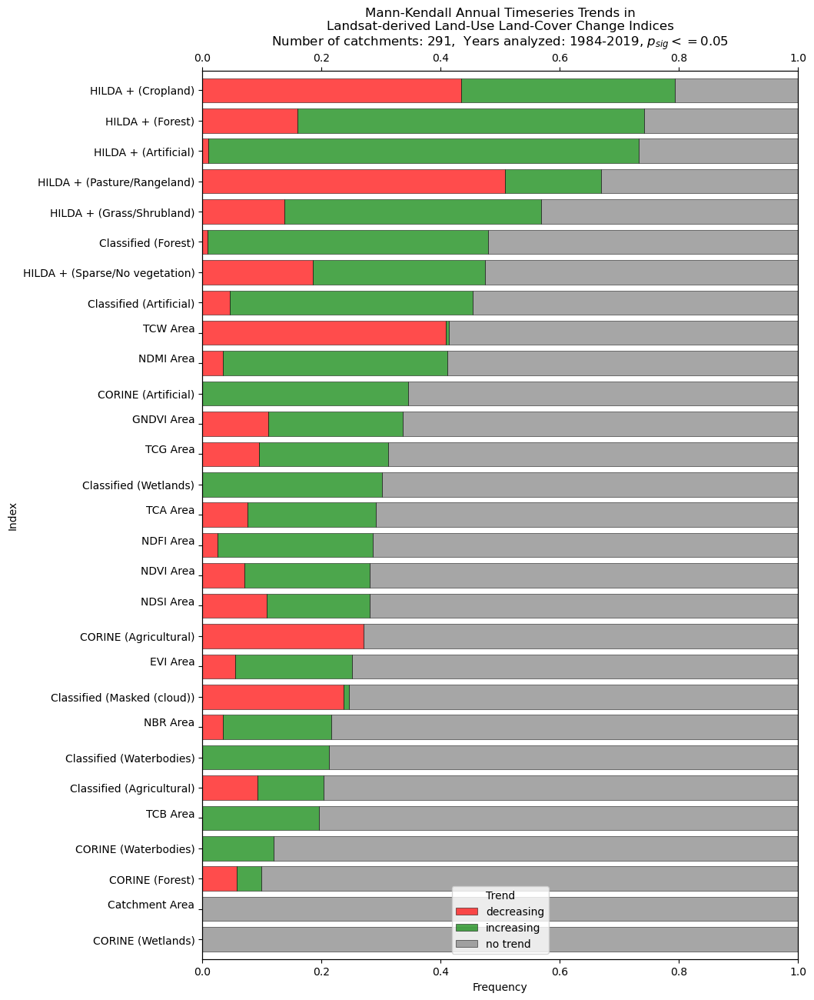

In [552]:
plot_mk_trend(mk_df_HC)
plot_mk_trend(mk_df_annual_lc_trend)

In [345]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
# shapefile_path = f"H:/My Drive/Delft/TUDELFT/Thesis/GIS/Shapefiles/{dataset}/{dataset}_Basin_4326.shp"

# Export the filtered shapefile
# gb_shp = gpd.read_file("H:/My Drive/Delft/TUDELFT/Thesis/GIS/Shapefiles/CAMELS_GB_catchment_boundaries/filtered_US_shp.shp")
meuse_shp = gpd.read_file(r"H:\My Drive\Delft\TUDELFT\Thesis\GIS\Shapefiles\Meuse\Meuse_Catchments_4326_WFLOW.shp")

In [ ]:
import geopandas as gpd

# Define the colormap
cmap = ListedColormap(['red', 'green'])

# Plot the shapefile with colors based on the "is_in_ids" column
fig, ax = plt.subplots(figsize=(10, 10))
gb_shp.plot(ax=ax, column='is_in_ids', cmap=cmap, legend=True)

# Load the CAMELS GB shapefile
gb_shp = gpd.read_file(output_path)

# Add title and show the plot
ax.set_title('CAMELS GB Shapefile')
plt.show()

C:\Users\creeb\AppData\Local\Temp\ipykernel_48148\2214901148.py:6: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['name_x', 'name_y', 'system_index', 'train_valid', 'tree_name'], dtype='object')
  geo_mean = gm_df.loc[dataset, catchment, :].rolling(window=10, min_periods=2).apply(lambda x: np.exp(np.log(x).mean()))[col]
C:\Users\creeb\AppData\Local\Temp\ipykernel_48148\2214901148.py:7: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['name_x', 'name_y', 'system_index', 'train_valid', 'tree_name'], dtype='object')
  ar_mean = gm_df.loc[dataset, catchment, :].rolling(window=10, min_periods=2).mean()[col]
C:\Users\creeb\AppData\Local\Temp\ipykernel_48148\2214901148.p

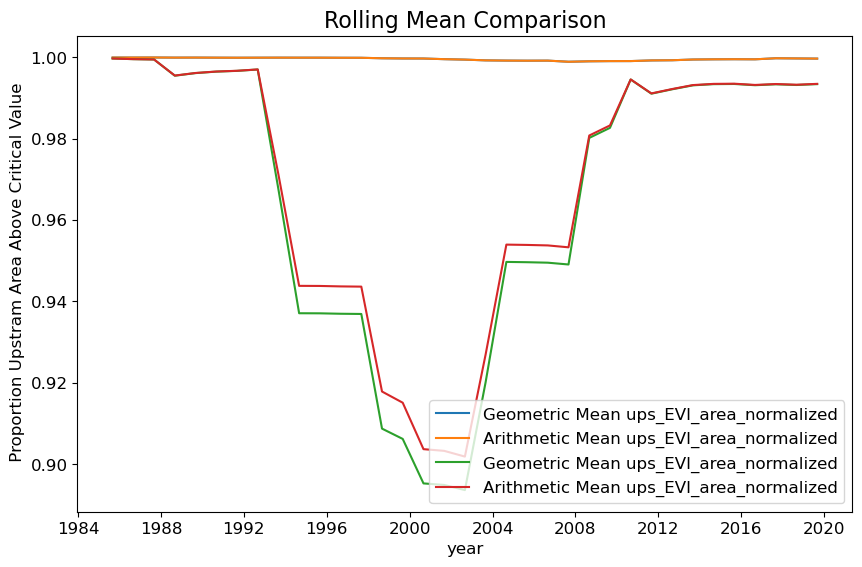

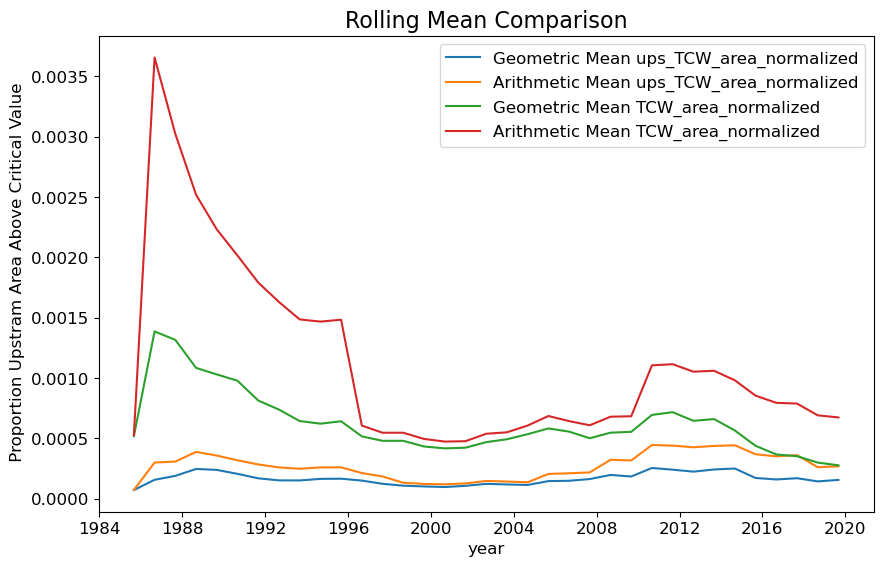

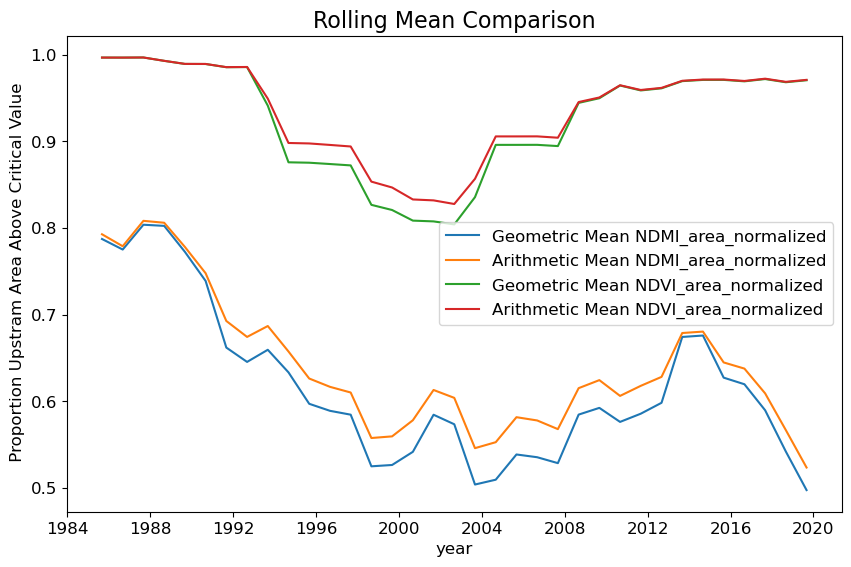

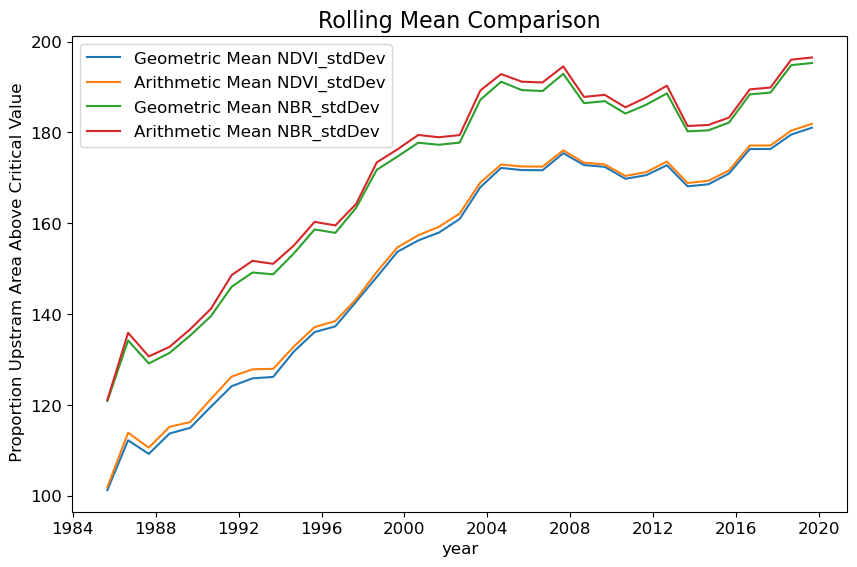

In [6]:
mean_table = pd.read_excel('../Outputs/all/mean_SR_tables.xlsx', index_col=0)
mean_table

,index,tot_area_x,h_1,h_2,h_3,h_4,h_5,year_trained,catchment_area,h_6,...,ind,train_valid,tree_name,dataset,name_x,name_y,system_index,system_index_x,system_index_y,country
0,5090,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,CAMELS_GB,NaN,NaN,NaN,NaN,NaN,GB
1,5091,272.369829,NaN,NaN,182.571374,50.080894,34.741231,1914.500000,272.369829,4.976330,...,NaN,NaN,NaN,CAMELS_GB,NaN,NaN,NaN,NaN,NaN,GB
2,5092,272.369829,NaN,NaN,191.293649,46.814964,30.446496,1926.333333,272.369829,3.814718,...,NaN,NaN,NaN,CAMELS_GB,NaN,NaN,NaN,NaN,NaN,GB
3,5093,272.369829,NaN,NaN,196.013608,47.038578,26.441782,1934.750000,272.369829,2.875861,...,NaN,NaN,NaN,CAMELS_GB,NaN,NaN,NaN,NaN,NaN,GB
4,5094,272.369829,NaN,NaN,197.321966,47.648369,25.046788,1941.800000,272.369829,2.352706,...,NaN,NaN,NaN,CAMELS_GB,NaN,NaN,NaN,NaN,NaN,GB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13022,415,142.240404,11.224464,31.929189,67.385819,26.511862,4.947754,2010.200000,142.240404,0.241316,...,23_2015,validation,Meuse_HC_tuned_tuned,Meuse,0000000000000000001c,0000000000000000001c,0000000000000000001c,NaN,NaN,BE
13023,416,142.240404,11.615808,32.719442,66.104915,26.301912,5.257010,2011.400000,142.240404,0.241316,...,23_2016,validation,Meuse_HC_tuned_tuned,Meuse,0000000000000000001c,0000000000000000001c,0000000000000000001c,NaN,NaN,BE
13024,417,142.240404,11.814331,33.336439,65.267476,26.197337,5.383504,2012.600000,142.240404,0.241316,...,23_2017,validation,Meuse_HC_tuned_tuned,Meuse,0000000000000000001c,0000000000000000001c,0000000000000000001c,NaN,NaN,BE
13025,418,142.240404,12.012854,33.901235,64.635731,26.117941,5.331328,2013.800000,142.240404,0.241316,...,23_2018,validation,Meuse_HC_tuned_tuned,Meuse,0000000000000000001c,0000000000000000001c,0000000000000000001c,NaN,NaN,BE


In [7]:
decadal_mean_df=mean_table.reset_index()
decadal_df = pd.read_excel('../Outputs/all/SR_mean_with_change.xlsx', index_col=0)
decadal_df

,index,tot_area_x,h_1,h_2,h_3,h_4,h_5,year_trained,catchment_area,h_6,...,ups_h_4_normalized_change,ups_h_5_normalized_change,ups_h_6_normalized_change,ups_c_1_normalized_change,ups_c_2_normalized_change,ups_c_3_normalized_change,ups_c_4_normalized_change,ups_c_5_normalized_change,ups_catchment_area_normalized_change,tot_area_change
0,5090,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5091,272.369829,NaN,NaN,182.571374,50.080894,34.741231,1914.500000,272.369829,4.976330,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5092,272.369829,NaN,NaN,191.293649,46.814964,30.446496,1926.333333,272.369829,3.814718,...,-0.011991,-0.015768,-4.264834e-03,NaN,NaN,NaN,NaN,NaN,0.0,NaN
3,5093,272.369829,NaN,NaN,196.013608,47.038578,26.441782,1934.750000,272.369829,2.875861,...,0.000821,-0.014703,-3.446995e-03,NaN,NaN,NaN,NaN,NaN,0.0,NaN
4,5094,272.369829,NaN,NaN,197.321966,47.648369,25.046788,1941.800000,272.369829,2.352706,...,0.002239,-0.005122,-1.920753e-03,NaN,NaN,NaN,NaN,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2405,380,142.240404,5.998371,28.393611,76.487648,17.290428,13.829030,1926.333333,142.240404,0.241316,...,0.000473,0.006972,1.333569e-16,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2406,381,142.240404,5.998371,31.261240,75.706360,17.989901,11.043216,1934.750000,142.240404,0.241316,...,0.004918,-0.019585,1.647987e-17,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2407,382,142.240404,6.315364,32.980084,74.693144,18.489523,9.520972,1941.800000,142.240404,0.241316,...,0.003513,-0.010702,9.974660e-18,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2408,408,142.240404,8.763107,30.036974,71.873364,25.923469,5.402174,2003.000000,142.240404,0.241316,...,0.052263,-0.028957,-7.979728e-17,NaN,NaN,NaN,NaN,NaN,0.0,NaN


In [8]:
HC_df = pd.read_excel('../Outputs/all/catchments_HC_combined.xlsx', index_col=None)
HC_df

,catchment,year_x,AI_mean,EI_mean,Ep_mean,Pa_mean,SI_mean,ST_mean,Sr_mean,T_mean,...,LT_T,LT_is_dur,LT_EI,LT_ST,LT_Sr,LT_catchment,LT_AI,LT_Pa,LT_Ep,LT_SI
0,La Bar Cheveuges,1989 - 1998,0.640179,0.629046,597.512792,933.352591,0.182647,0.115816,298.136981,9.589539,...,10.017674,4.038745,0.601654,0.059219,257.531013,La Bar Cheveuges,0.646296,952.514146,615.606327,0.158947
1,La Bar Cheveuges,1999 - 2008,0.595952,0.583998,624.075546,1047.190398,0.169380,0.070344,228.446253,10.126708,...,10.017674,4.038745,0.601654,0.059219,257.531013,La Bar Cheveuges,0.646296,952.514146,615.606327,0.158947
2,La Bar Cheveuges,2009 - 2018,0.712920,0.592735,625.230644,876.999450,0.208518,0.095511,219.502597,10.336745,...,10.017674,4.038745,0.601654,0.059219,257.531013,La Bar Cheveuges,0.646296,952.514146,615.606327,0.158947
3,La Chiers Carignan,1989 - 1998,0.627441,0.612039,603.671065,962.115608,0.218485,0.097110,293.047740,9.631276,...,10.031090,4.081047,0.578116,0.063326,226.948280,La Chiers Carignan,0.660542,941.121833,621.650212,0.150571
4,La Chiers Carignan,1999 - 2008,0.605398,0.584844,630.200377,1040.968305,0.163856,0.044324,215.648137,10.161340,...,10.031090,4.081047,0.578116,0.063326,226.948280,La Chiers Carignan,0.660542,941.121833,621.650212,0.150571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
935,8086212,1990 - 1999,1.637549,0.937624,1163.755211,710.669000,0.224184,0.278115,327.601907,17.983906,...,17.888555,8.832124,0.954228,0.329170,439.190278,8086212,1.701542,683.416429,1162.861531,0.281167
936,8086212,2000 - 2009,1.635407,0.966839,1151.610302,704.173333,0.366109,0.497918,374.864241,17.935833,...,17.888555,8.832124,0.954228,0.329170,439.190278,8086212,1.701542,683.416429,1162.861531,0.281167
937,8086290,1981 - 1989,1.744501,0.950470,1170.137666,670.757778,0.475441,0.253737,410.783436,17.696308,...,17.851434,8.977964,0.947938,0.293609,459.384967,8086290,1.600147,723.130357,1157.114916,0.291453
938,8086290,1990 - 1999,1.529400,0.938728,1161.784227,759.634000,0.201453,0.153549,349.662686,17.934081,...,17.851434,8.977964,0.947938,0.293609,459.384967,8086290,1.600147,723.130357,1157.114916,0.291453


C:\Users\creeb\AppData\Local\Temp\ipykernel_36224\1589263093.py:6: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['name_x', 'name_y', 'system_index', 'train_valid', 'tree_name'], dtype='object')
  geo_mean = gm_df.loc[dataset, catchment, :].rolling(window=10, min_periods=2).apply(lambda x: np.exp(np.log(x).mean()))[col]
C:\Users\creeb\AppData\Local\Temp\ipykernel_36224\1589263093.py:7: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['name_x', 'name_y', 'system_index', 'train_valid', 'tree_name'], dtype='object')
  ar_mean = gm_df.loc[dataset, catchment, :].rolling(window=10, min_periods=2).mean()[col]
C:\Users\creeb\AppData\Local\Temp\ipykernel_36224\1589263093.p

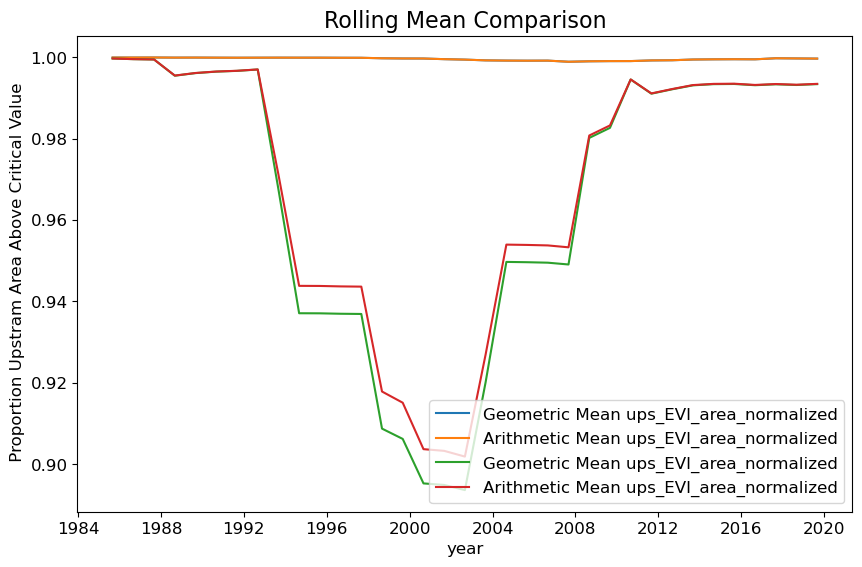

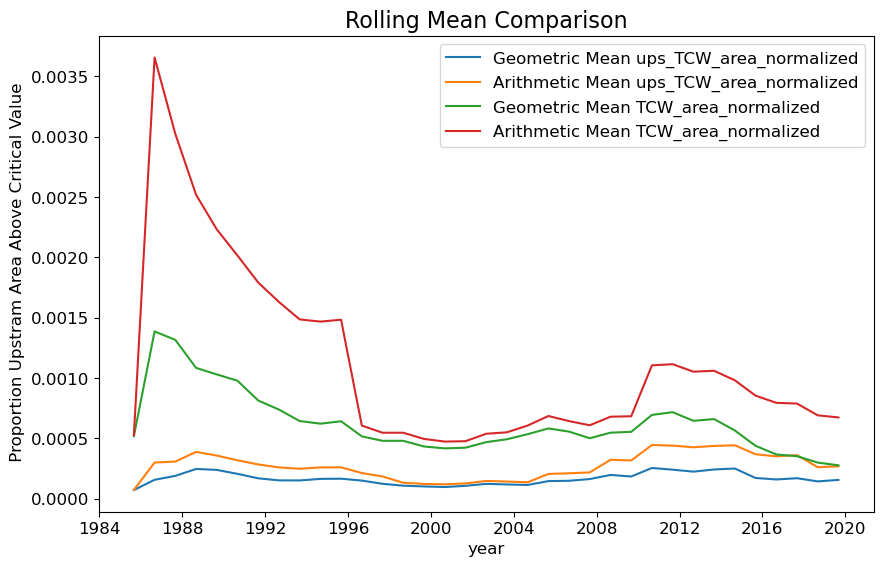

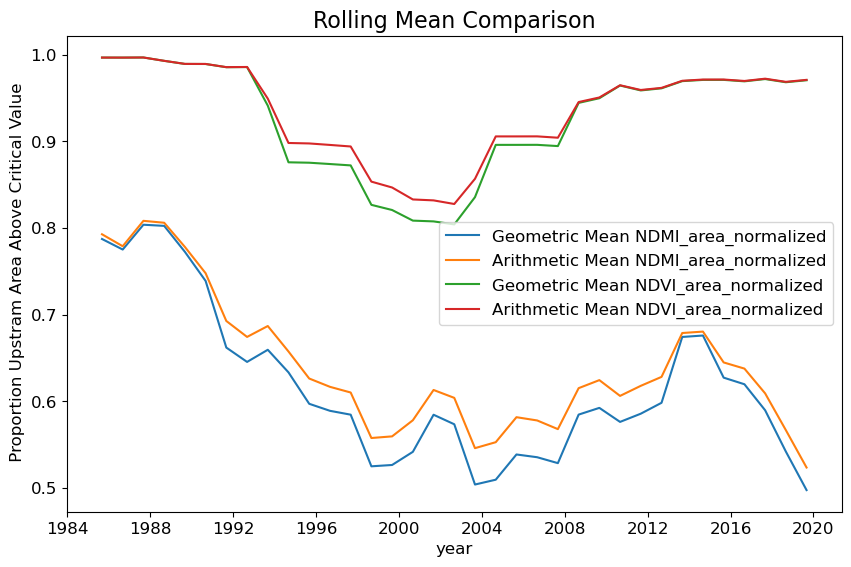

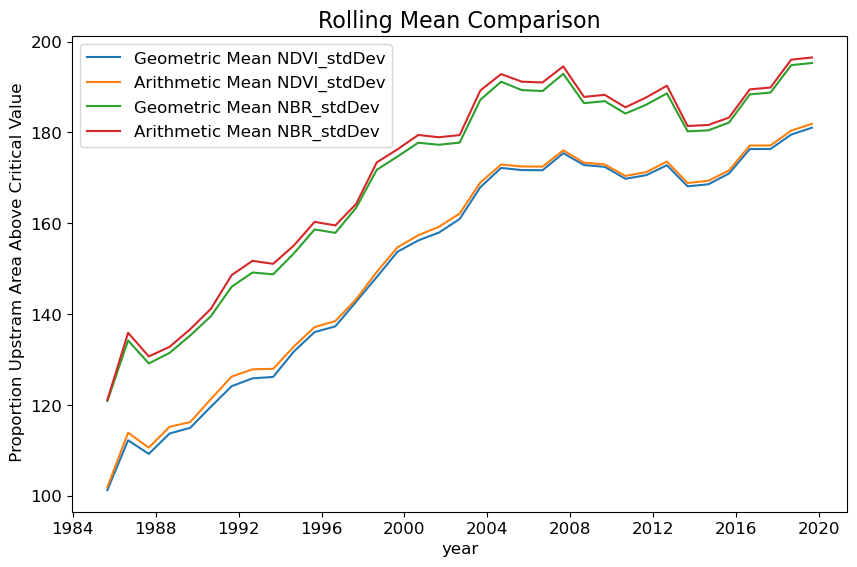

In [71]:
gm_df = annual_lc.reset_index()
gm_df = gm_df.set_index(['dataset', 'catchment', 'image_date'])

def plot_mean_comparison(gm_df, ax, col, dataset, catchment):
# Compute rolling means
    geo_mean = gm_df.loc[dataset, catchment, :].rolling(window=10, min_periods=2).apply(lambda x: np.exp(np.log(x).mean()))[col]
    ar_mean = gm_df.loc[dataset, catchment, :].rolling(window=10, min_periods=2).mean()[col]

    # Plot results
    
    ax.plot(geo_mean.index, geo_mean, label=f'Geometric Mean {col}')
    ax.plot(ar_mean.index, ar_mean, label=f'Arithmetic Mean {col}')

    # Format plot
    ax.set_title(f'Rolling Mean Comparison', fontsize=16)
    ax.set_ylabel(' Proportion Upstram Area Above Critical Value', fontsize=12)
    ax.set_xlabel('year', fontsize=12)
    ax.legend(fontsize=12)
    ax.tick_params(axis='both', labelsize=12)

    # Set golden ratio
    fig.set_size_inches(10, 6.18, forward=True)

    # plt.show()
fig, ax = plt.subplots(figsize=(10, 6.18))
plot_mean_comparison
plot_mean_comparison(gm_df, ax, 'ups_EVI_area_normalized', 'Meuse', 'La Meuse Goncourt')
plot_mean_comparison(gm_df, ax, 'ups_EVI_area_normalized', 'Meuse', 'La Meuse Stenay')

fig, ax = plt.subplots(figsize=(10, 6.18))
plot_mean_comparison(gm_df, ax, 'ups_TCW_area_normalized', 'Meuse', 'La Meuse Goncourt')
plot_mean_comparison(gm_df, ax, 'TCW_area_normalized', 'Meuse', 'La Meuse Stenay')

fig, ax = plt.subplots(figsize=(10, 6.18))
plot_mean_comparison(gm_df, ax, 'NDMI_area_normalized', 'Meuse', 'La Meuse Goncourt')
plot_mean_comparison(gm_df, ax, 'NDVI_area_normalized', 'Meuse', 'La Meuse Stenay')

fig, ax = plt.subplots(figsize=(10, 6.18))
plot_mean_comparison(gm_df, ax, 'NDVI_stdDev', 'Meuse', 'La Meuse Goncourt')
plot_mean_comparison(gm_df, ax,  'NBR_stdDev', 'Meuse', 'La Meuse Goncourt')

In [75]:
merged_df = pd.read_excel('../Outputs/all/merge_HC_SR.xlsx', index_col=None)
merged_df

,index,tot_area_x,h_1,h_2,h_3,h_4,h_5,year_trained,catchment_area,h_6,...,omega_mean_diff_pct,LT_ST,LT_EI,LT_Pa,LT_AI,LT_Sr,LT_T,LT_is_dur,LT_Ep,LT_SI
0,5090,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5091,272.369829,NaN,NaN,182.571374,50.080894,34.741231,1914.500000,272.369829,4.976330,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5092,272.369829,NaN,NaN,191.293649,46.814964,30.446496,1926.333333,272.369829,3.814718,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5093,272.369829,NaN,NaN,196.013608,47.038578,26.441782,1934.750000,272.369829,2.875861,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5094,272.369829,NaN,NaN,197.321966,47.648369,25.046788,1941.800000,272.369829,2.352706,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2404,380,142.240404,5.998371,28.393611,76.487648,17.290428,13.829030,1926.333333,142.240404,0.241316,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2405,381,142.240404,5.998371,31.261240,75.706360,17.989901,11.043216,1934.750000,142.240404,0.241316,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2406,382,142.240404,6.315364,32.980084,74.693144,18.489523,9.520972,1941.800000,142.240404,0.241316,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2407,408,142.240404,8.763107,30.036974,71.873364,25.923469,5.402174,2003.000000,142.240404,0.241316,...,NaN,0.019775,0.56996,824.441537,0.717729,170.672118,9.018223,3.696707,591.725647,0.177207


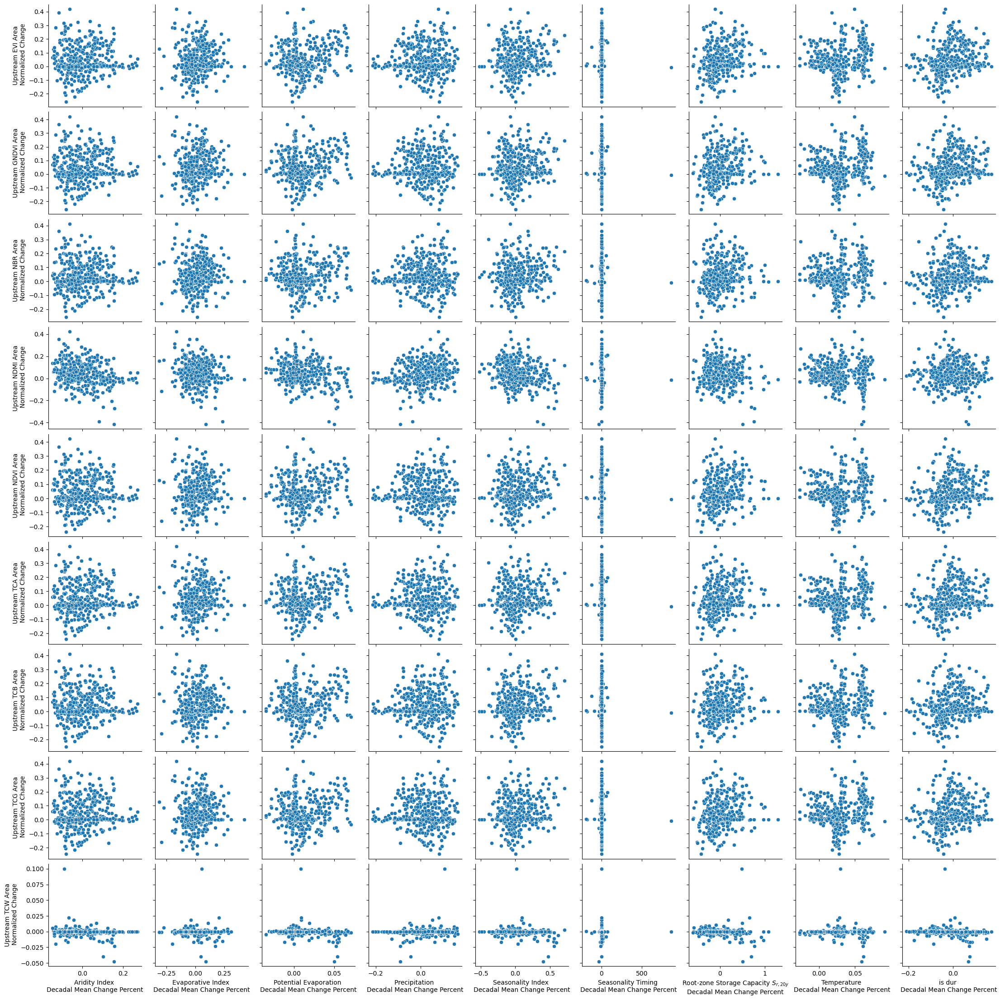

In [578]:
# Define the dependent variables
dep_vars = ['AI_mean_diff_pct',
 'EI_mean_diff_pct',
 'Ep_mean_diff_pct',
 'Pa_mean_diff_pct',
 'SI_mean_diff_pct',
 'ST_mean_diff_pct',
 'Sr_mean_diff_pct',
 'T_mean_diff_pct',
 'is_dur_mean_diff_pct',]

# Define the independent variables
ind_vars = ['ups_EVI_area_normalized_change',
 'ups_GNDVI_area_normalized_change',
 'ups_NBR_area_normalized_change',
 # 'ups_NDFI_area_normalized_change',
 'ups_NDMI_area_normalized_change',
 # 'ups_NDSI_area_normalized_change',
 'ups_NDVI_area_normalized_change',
 'ups_TCA_area_normalized_change',
 'ups_TCB_area_normalized_change',
 'ups_TCG_area_normalized_change',
 'ups_TCW_area_normalized_change']

data_change = merged_df.iloc[:, :]

translate_col_name('ups_GNDVI_area_normalized_change')

def plot_collinearity(data, dep_vars, ind_vars, hue=None):
    
    data = data[dep_vars+ind_vars]
    
    sns.pairplot(
        data=data.rename(columns=translate_col_name),
        x_vars=[translate_col_name(var) for var in dep_vars],
        y_vars=[translate_col_name(var) for var in ind_vars],
        hue=hue
        
    )
colorby = 'dataset'  # Column name for coloring

# print(data_change.columns)  # Print column names for debugging
plot_collinearity(data_change, dep_vars, ind_vars, None)

In [567]:
merged_df.iloc[merged_df.EI_mean_diff_pct.idxmax()].EI_mean_diff_pct = np.nan

C:\Users\creeb\AppData\Local\Temp\ipykernel_36224\1816682087.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df.iloc[merged_df.EI_mean_diff_pct.idxmax()].EI_mean_diff_pct = np.nan


,index,tot_area_x,h_1,h_2,h_3,h_4,h_5,year_trained,catchment_area,h_6,...,omega_mean_diff_pct,LT_ST,LT_EI,LT_Pa,LT_AI,LT_Sr,LT_T,LT_is_dur,LT_Ep,LT_SI
0,5090,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5091,272.369829,NaN,NaN,182.571374,50.080894,34.741231,1914.500000,272.369829,4.976330,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5092,272.369829,NaN,NaN,191.293649,46.814964,30.446496,1926.333333,272.369829,3.814718,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5093,272.369829,NaN,NaN,196.013608,47.038578,26.441782,1934.750000,272.369829,2.875861,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5094,272.369829,NaN,NaN,197.321966,47.648369,25.046788,1941.800000,272.369829,2.352706,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2404,380,142.240404,5.998371,28.393611,76.487648,17.290428,13.829030,1926.333333,142.240404,0.241316,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2405,381,142.240404,5.998371,31.261240,75.706360,17.989901,11.043216,1934.750000,142.240404,0.241316,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2406,382,142.240404,6.315364,32.980084,74.693144,18.489523,9.520972,1941.800000,142.240404,0.241316,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2407,408,142.240404,8.763107,30.036974,71.873364,25.923469,5.402174,2003.000000,142.240404,0.241316,...,NaN,0.019775,0.56996,824.441537,0.717729,170.672118,9.018223,3.696707,591.725647,0.177207


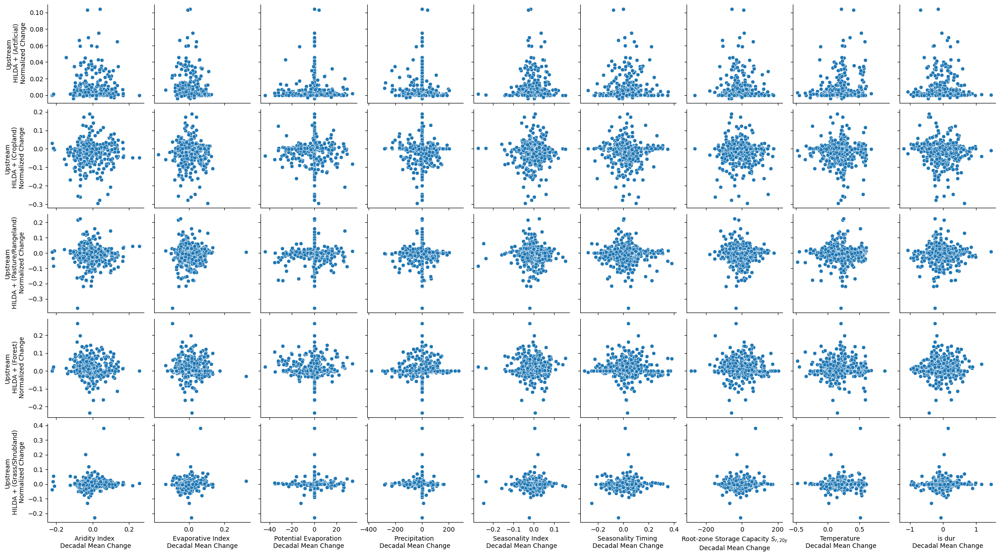

In [581]:
data_mean = merged_df.iloc[:, :]
display(data_mean)

# Define the dependent variables
dep_vars = ['AI_mean_diff',
 'EI_mean_diff',
 'Ep_mean_diff',
 'Pa_mean_diff',
 'SI_mean_diff',
 'ST_mean_diff',
 'Sr_mean_diff',
 'T_mean_diff',
 'is_dur_mean_diff',]

ind_vars = [ 'ups_h_1_normalized_change',
            'ups_h_2_normalized_change',
            'ups_h_3_normalized_change',
            'ups_h_4_normalized_change',
            'ups_h_5_normalized_change',
            # 'ups_h_6_normalized_change',
            # 'ups_h_7_normalized_change',
           ]
            
plot_collinearity(data_mean, dep_vars, ind_vars, None)


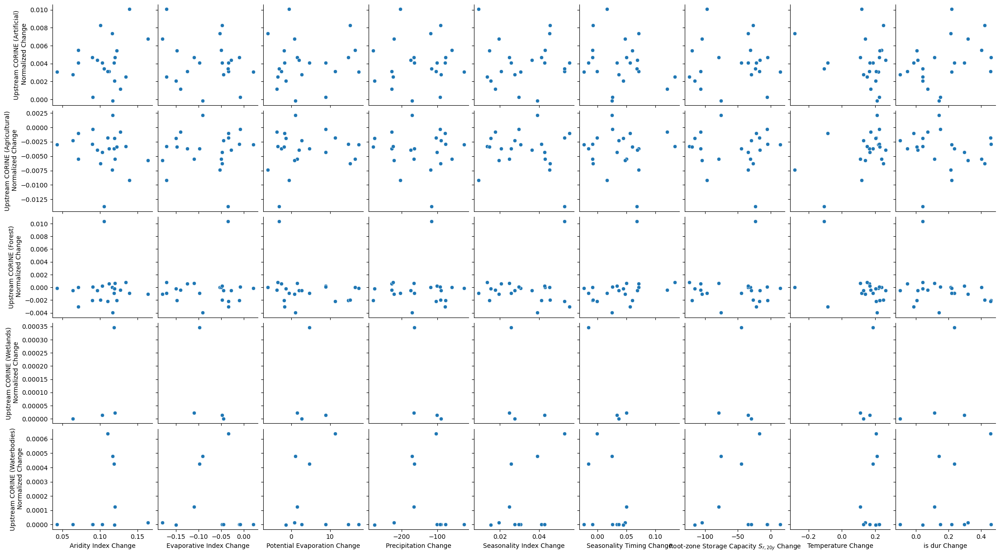

In [582]:
# Define the dependent variables
dep_vars = ['AI_change',
 'EI_change',
 'Ep_change',
 'Pa_change',
 'SI_change',
 'ST_change',
 'Sr_change',
 'T_change',
 'is_dur_change',
           ]
ind_vars = [ 'ups_c_1_normalized_change',
            'ups_c_2_normalized_change',
            'ups_c_3_normalized_change',
            'ups_c_4_normalized_change',
            'ups_c_5_normalized_change',
            # 'ups_h_6_normalized_change',
            # 'ups_h_7_normalized_change',
           ]
            
plot_collinearity(data_mean, dep_vars, ind_vars, None)

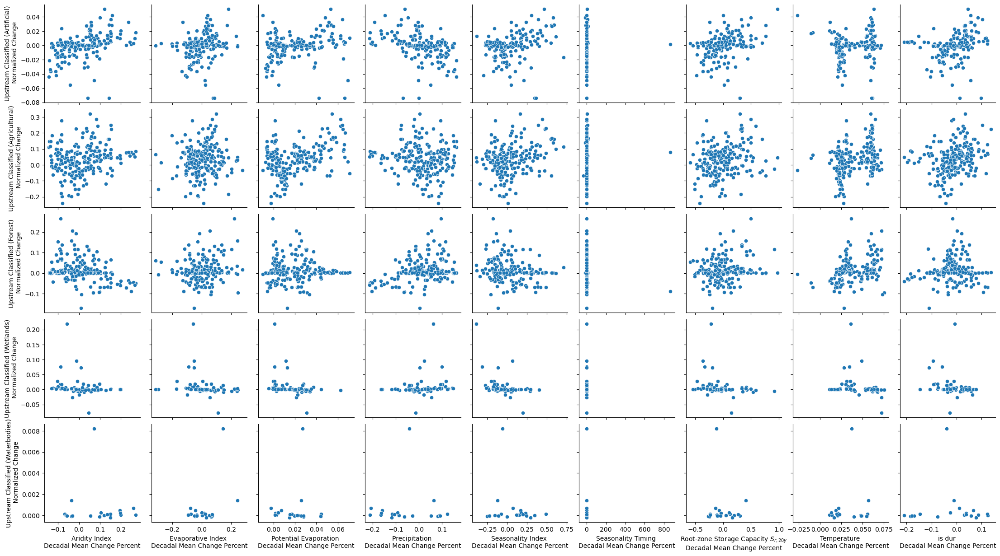

In [583]:
# Define the dependent variables
dep_vars = dep_vars = ['AI_mean_diff_pct',
 'EI_mean_diff_pct',
 'Ep_mean_diff_pct',
 'Pa_mean_diff_pct',
 'SI_mean_diff_pct',
 'ST_mean_diff_pct',
 'Sr_mean_diff_pct',
 'T_mean_diff_pct',
 'is_dur_mean_diff_pct',]
ind_vars = [ 'ups_r_1_normalized_change',
            'ups_r_2_normalized_change',
            'ups_r_3_normalized_change',
            'ups_r_4_normalized_change',
            'ups_r_5_normalized_change',
            # 'ups_h_6_normalized_change',
            # 'ups_h_7_normalized_change',
           ]
            
plot_collinearity(data_mean, dep_vars, ind_vars, None)

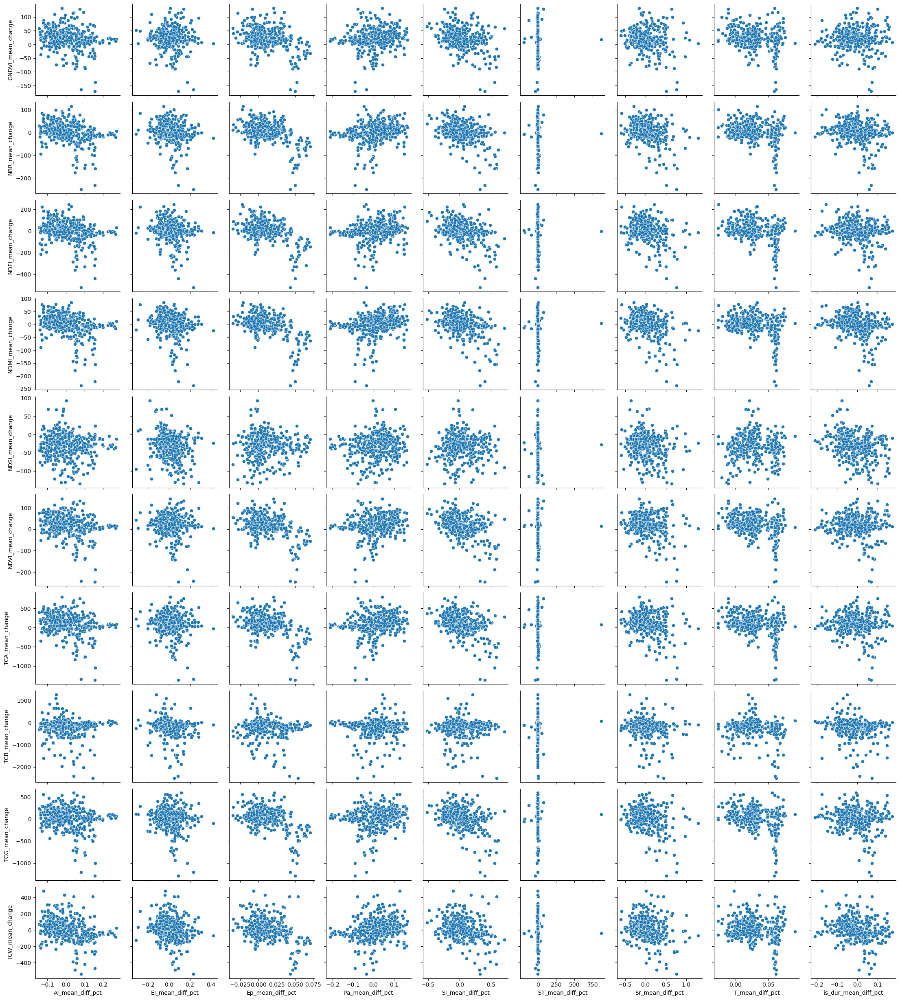

In [584]:
# Define the dependent variables
dep_vars = ['AI_mean_diff_pct',
 'EI_mean_diff_pct',
 'Ep_mean_diff_pct',
 'Pa_mean_diff_pct',
 'SI_mean_diff_pct',
 'ST_mean_diff_pct',
 'Sr_mean_diff_pct',
 'T_mean_diff_pct',
 'is_dur_mean_diff_pct',]

# Define the independent variables
ind_vars = ['GNDVI_mean_change',
 # 'GNDVI_stdDev_change',
 'NBR_mean_change',
 # 'NBR_stdDev_change',
 'NDFI_mean_change',
 # 'NDFI_stdDev_change',
 'NDMI_mean_change',
 # 'NDMI_stdDev_change',
 'NDSI_mean_change',
 # 'NDSI_stdDev_change',
 'NDVI_mean_change',
 # 'NDVI_stdDev_change',
 'TCA_mean_change',
 # 'TCA_stdDev_change',
 'TCB_mean_change',
 # 'TCB_stdDev_change',
 'TCG_mean_change',
 # 'TCG_stdDev_change',
 'TCW_mean_change',
 # 'TCW_stdDev_change',
           ]

data = merged_df

def plot_collinearity(data, dep_vars, ind_vars, hue=None):
    
    # Create a pairplot with hue as the dependent variable
    sns.pairplot(data=data, x_vars=dep_vars, y_vars=ind_vars, hue=hue)

plot_collinearity(data, dep_vars, ind_vars, None)

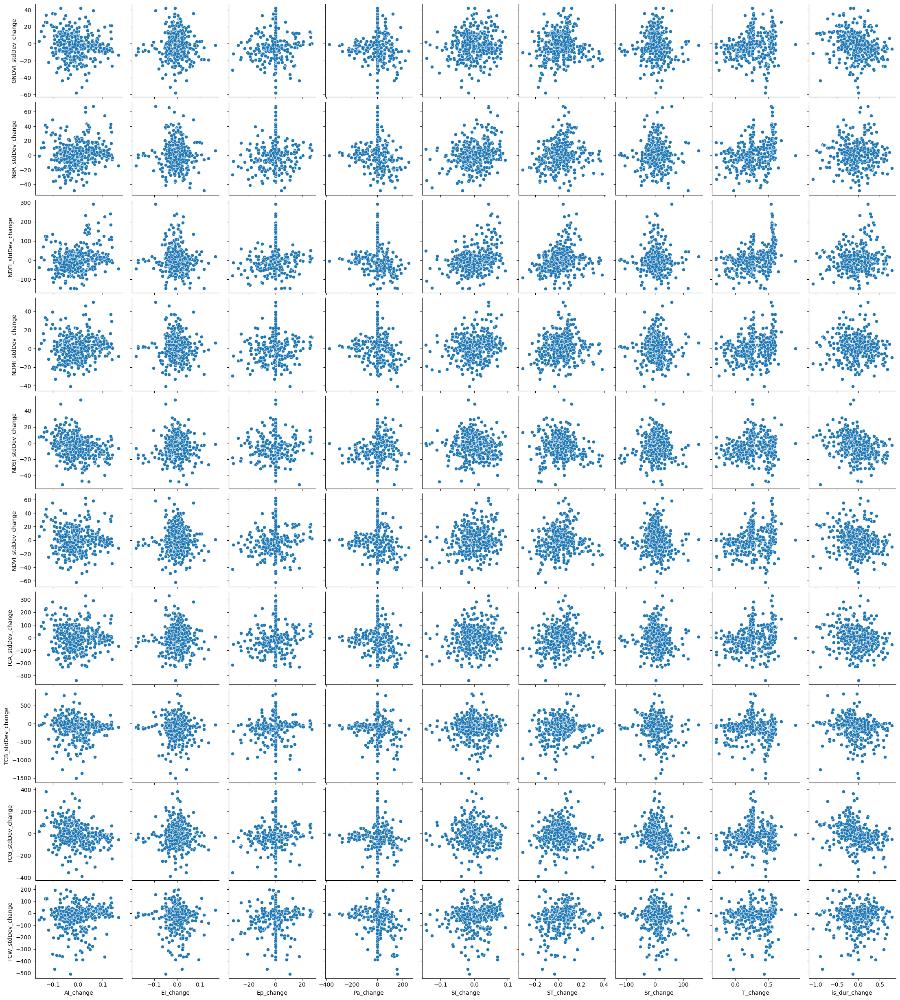

In [83]:
# Define the dependent variables
dep_vars = ['AI_change',
 'EI_change',
 'Ep_change',
 'Pa_change',
 'SI_change',
 'ST_change',
 'Sr_change',
 'T_change',
 'is_dur_change',]

# Define the independent variables
ind_vars = [
    # 'GNDVI_mean_change',
 'GNDVI_stdDev_change',
 # 'NBR_mean_change',
 'NBR_stdDev_change',
 # 'NDFI_mean_change',
 'NDFI_stdDev_change',
 # 'NDMI_mean_change',
 'NDMI_stdDev_change',
 # 'NDSI_mean_change',
 'NDSI_stdDev_change',
 # 'NDVI_mean_change',
 'NDVI_stdDev_change',
 # 'TCA_mean_change',
 'TCA_stdDev_change',
 # 'TCB_mean_change',
 'TCB_stdDev_change',
 # 'TCG_mean_change',
 'TCG_stdDev_change',
 # 'TCW_mean_change',
 'TCW_stdDev_change',
           ]

data =merged_df

def plot_collinearity(data, dep_vars, ind_vars, hue=None):
    
    # Create a pairplot with hue as the dependent variable
    sns.pairplot(data=data, x_vars=dep_vars, y_vars=ind_vars, hue=hue)

plot_collinearity(data, dep_vars, ind_vars, None)


In [585]:
# Select only columns ending with '_change'
filtered_df = merged_df.filter(regex='_change$|_mean_diff$|_diff_pct$')

# Drop columns containing 'p10' or 'p90'
filtered_df = filtered_df.drop(columns=list(filtered_df.filter(regex='p10|p90').columns.values) +['tot_area_change'])


keys_to_drop = ['fscore1','fscore2','fscore3','fscore4','fscore5','c_accuracy1','c_accuracy2','c_accuracy3','c_accuracy4','c_accuracy5', 'accuracy']
df = filtered_df.loc[:, ~filtered_df.columns.str.contains('score')]
df = df.loc[:, ~df.columns.str.contains('accuracy')]
df = df.loc[:, ~df.columns.str.contains('kappa')]
df = df.loc[:, ~df.columns.str.contains('tot')]

def top_corr(df, dep_vars):
    # calculate the correlation matrix
    corr_matrix = df.corr()

    # create an empty dataframe to store the top correlations for each dependent variable
    top_corrs = pd.DataFrame(columns=['Dependent Variable', 'Independent Variable', 'Correlation Coefficient', 'R-squared', 'P-value', 'n'])

    # loop through each dependent variable
    for dep_var in dep_vars:
        # get the correlations for this dependent variable
        dep_var_corrs = corr_matrix.loc[dep_var]

        # sort the correlations in descending order
        sorted_corrs = np.abs(dep_var_corrs).sort_values(ascending=False)

        sorted_corrs = sorted_corrs[~sorted_corrs.index.isin(dep_vars)]

        # loop through the sorted correlations and add the top significant ones to the dataframe
        for i, (ind_var, corr_val) in enumerate(sorted_corrs.items()):
            if i >= 10:
                break

            if ind_var == dep_var or ind_var in dep_vars:
                continue

            try:
                xy = df[[ind_var, dep_var]].dropna()
                n = len(xy)

            except:
                continue

            if len(xy) > 28:
                # Calculate Pearson's correlation coefficient and its square (R-squared)
                r, p_value = pearsonr(xy[ind_var], xy[dep_var])
                r_squared = r ** 2

                top_corrs = pd.concat([top_corrs, pd.DataFrame({'Dependent Variable': [translate_col_name(dep_var)],
                                                                 'Independent Variable': [translate_col_name(ind_var)],
                                                                 'Correlation Coefficient': [corr_val],
                                                                 'R-squared': [r_squared],
                                                                 'P-value': [p_value],
                                                                 'n': [n]})], ignore_index=True)
            else:
                continue

    # sort the dataframe by the correlation coefficient in descending order
    top_corrs = top_corrs.sort_values(by='Correlation Coefficient', ascending=False)

    display(top_corrs)

    # display the top correlations for each dependent variable
    for dep_var in [translate_col_name(dep_var) for dep_var in dep_vars]:
        print(f"Top correlations for {dep_var}:")
        display(top_corrs[top_corrs['Dependent Variable'] == dep_var].loc[top_corrs['Independent Variable'] != dep_var])
        print("\n")
    return top_corrs

dep_vars = ['AI_change','EI_change','Ep_change','Pa_change','SI_change','ST_change','Sr_change','T_change','is_dur_change',
           'AI_mean_diff','EI_mean_diff','Ep_mean_diff','Pa_mean_diff','SI_mean_diff','ST_mean_diff','Sr_mean_diff','T_mean_diff','is_dur_mean_diff', 'omega_mean_diff',
            'AI_mean_diff_pct','EI_mean_diff_pct','Ep_mean_diff_pct','Pa_mean_diff_pct','SI_mean_diff_pct','ST_mean_diff_pct','Sr_mean_diff_pct','T_mean_diff_pct','is_dur_mean_diff_pct', 'omega_mean_diff_pct']
top_corrs = top_corr(df, dep_vars)
top_corrs.to_excel('../Outputs/results/ranked_correlation.xlsx')

,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
80,Potential Evaporation \nDecadal Mean Change Pe...,NDMI \nDecadal Mean Change,0.517119,0.267412,5.802278e-27,374
81,Potential Evaporation \nDecadal Mean Change Pe...,NBR \nDecadal Mean Change,0.494953,0.244979,1.654642e-24,374
82,Potential Evaporation \nDecadal Mean Change Pe...,NDFI \nDecadal Mean Change,0.494479,0.244510,1.859116e-24,374
83,Potential Evaporation \nDecadal Mean Change Pe...,TCG \nDecadal Mean Change,0.473560,0.224259,2.656657e-22,374
36,Aridity Index \nDecadal Mean Change,Classified (Artificial)\n,0.472004,0.222788,4.282969e-11,175
...,...,...,...,...,...,...
117,Budyko curve (Fu) parameter \nDecadal Mean Cha...,Classified (Artificial)\n,0.250710,0.062856,8.186074e-04,175
71,Budyko curve (Fu) parameter \nDecadal Mean Change,Upstream Classified (Artificial)\n Change,0.243434,0.059260,1.169471e-03,175
32,"Root-zone Storage Capacity $S_{r,20y}$ Change",NDSI \nDecadal Mean Change,0.241528,0.058336,2.296255e-06,374
118,Budyko curve (Fu) parameter \nDecadal Mean Cha...,Upstream\n HILDA + (Cropland)\n Change,0.225456,0.050830,2.206664e-06,432


Top correlations for Aridity Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
0,Aridity Index Change,Classified (Artificial)\n,0.472004,0.222788,4.282969e-11,175
1,Aridity Index Change,Upstream Classified (Artificial)\n Normalized ...,0.469468,0.220400,5.613192e-11,175
2,Aridity Index Change,NDMI \nDecadal Mean Change,0.388946,0.151279,5.895167e-15,374
3,Aridity Index Change,NBR \nDecadal Mean Change,0.386211,0.149159,9.439832e-15,374
4,Aridity Index Change,Classified (Artificial)\n,0.350748,0.123024,1.947803e-06,175
5,Aridity Index Change,TCW \nDecadal Mean Change,0.343069,0.117697,9.070222e-12,374




Top correlations for Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
6,Evaporative Index Change,Upstream Classified (Artificial)\n Change,0.329834,0.108790,8.295824e-06,175
7,Evaporative Index Change,Upstream Classified (Forest)\n Change,0.315257,0.099387,3.515913e-06,208
8,Evaporative Index Change,Classified (Forest)\n,0.290959,0.084657,2.011670e-05,208
9,Evaporative Index Change,Classified (Artificial)\n,0.290585,0.084440,9.577533e-05,175
10,Evaporative Index Change,Upstream\n HILDA + (Cropland)\n Change,0.272421,0.074213,8.665851e-09,432
11,Evaporative Index Change,Classified (Wetlands)\n,0.258844,0.067000,4.051825e-02,63




Top correlations for Potential Evaporation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
12,Potential Evaporation Change,Classified (Forest)\n,0.311848,0.097249,0.000005,208
13,Potential Evaporation Change,Upstream Classified (Agricultural)\n Change,0.311163,0.096822,0.000004,213
14,Potential Evaporation Change,Upstream Classified (Forest)\n Change,0.283285,0.080250,0.000034,208




Top correlations for Precipitation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
15,Precipitation Change,Upstream Classified (Forest)\n Change,0.408374,0.166769,9.170299e-10,208
16,Precipitation Change,Classified (Forest)\n,0.392314,0.153910,4.612312e-09,208
17,Precipitation Change,Upstream Classified (Artificial)\n Change,0.365371,0.133496,6.635336e-07,175
18,Precipitation Change,Classified (Artificial)\n,0.332623,0.110638,6.879293e-06,175
19,Precipitation Change,Classified (Forest)\n,0.316519,0.100184,3.197663e-06,208
20,Precipitation Change,Upstream Classified (Forest)\n Normalized Change,0.313489,0.098275,4.012862e-06,208




Top correlations for Seasonality Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
21,Seasonality Index Change,Classified (Wetlands)\n,0.447510,0.200265,2.356870e-04,63
22,Seasonality Index Change,Upstream Classified (Wetlands)\n Normalized Ch...,0.447130,0.199925,2.121723e-04,64
23,Seasonality Index Change,NBR \nDecadal Mean Change,0.367489,0.135048,2.111061e-13,374
24,Seasonality Index Change,NDMI \nDecadal Mean Change,0.353753,0.125141,1.821245e-12,374
25,Seasonality Index Change,TCG \nDecadal Mean Change,0.347438,0.120713,4.739511e-12,374




Top correlations for Seasonality Timing Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
26,"Root-zone Storage Capacity $S_{r,20y}$ Change",Classified (Forest)\n,0.349542,0.122179,2.279705e-07,208
27,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream Classified (Forest)\n Normalized Change,0.348895,0.121728,2.407924e-07,208
28,"Root-zone Storage Capacity $S_{r,20y}$ Change",Classified (Forest)\n,0.330319,0.109111,1.100912e-06,208
29,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream Classified (Forest)\n Change,0.318177,0.101236,2.820959e-06,208
30,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream Classified (Artificial)\n Change,0.304853,0.092935,4.095981e-05,175
31,"Root-zone Storage Capacity $S_{r,20y}$ Change",Classified (Artificial)\n,0.267373,0.071488,3.475407e-04,175
32,"Root-zone Storage Capacity $S_{r,20y}$ Change",NDSI \nDecadal Mean Change,0.241528,0.058336,2.296255e-06,374




Top correlations for Temperature Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
33,Temperature Change,NDVI \nDecadal Mean Change,0.384935,0.148175,1.174205e-14,374
34,Temperature Change,Classified (Agricultural)\n,0.383825,0.147322,6.948529e-09,213
35,Temperature Change,Upstream Classified (Agricultural)\n Normalize...,0.383273,0.146898,7.332019e-09,213




Top correlations for is dur Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index 
Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
36,Aridity Index \nDecadal Mean Change,Classified (Artificial)\n,0.472004,0.222788,4.282969e-11,175
37,Aridity Index \nDecadal Mean Change,Upstream Classified (Artificial)\n Normalized ...,0.469468,0.220400,5.613191e-11,175
38,Aridity Index \nDecadal Mean Change,NDMI \nDecadal Mean Change,0.388946,0.151279,5.895167e-15,374
39,Aridity Index \nDecadal Mean Change,NBR \nDecadal Mean Change,0.386211,0.149159,9.439832e-15,374
40,Aridity Index \nDecadal Mean Change,Classified (Artificial)\n,0.350748,0.123024,1.947803e-06,175
41,Aridity Index \nDecadal Mean Change,TCW \nDecadal Mean Change,0.343069,0.117697,9.070222e-12,374




Top correlations for Evaporative Index 
Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
42,Evaporative Index \nDecadal Mean Change,Classified (Wetlands)\n,0.365641,0.133693,3.210374e-03,63
43,Evaporative Index \nDecadal Mean Change,Upstream Classified (Wetlands)\n Change,0.361793,0.130894,3.308628e-03,64
44,Evaporative Index \nDecadal Mean Change,NDMI \nDecadal Mean Change,0.291548,0.085000,9.209802e-09,374
45,Evaporative Index \nDecadal Mean Change,Upstream Classified (Artificial)\n Normalized ...,0.274830,0.075532,2.325548e-04,175




Top correlations for Potential Evaporation 
Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
46,Potential Evaporation \nDecadal Mean Change,Classified (Forest)\n,0.311848,0.097249,0.000005,208
47,Potential Evaporation \nDecadal Mean Change,Upstream Classified (Agricultural)\n Change,0.311163,0.096822,0.000004,213
48,Potential Evaporation \nDecadal Mean Change,Upstream Classified (Forest)\n Change,0.283285,0.080250,0.000034,208




Top correlations for Precipitation 
Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
49,Precipitation \nDecadal Mean Change,Upstream Classified (Forest)\n Change,0.408374,0.166769,9.170300e-10,208
50,Precipitation \nDecadal Mean Change,Classified (Forest)\n,0.392314,0.153910,4.612312e-09,208
51,Precipitation \nDecadal Mean Change,Upstream Classified (Artificial)\n Change,0.365371,0.133496,6.635336e-07,175
52,Precipitation \nDecadal Mean Change,Classified (Artificial)\n,0.332623,0.110638,6.879293e-06,175
53,Precipitation \nDecadal Mean Change,Classified (Forest)\n,0.316519,0.100184,3.197663e-06,208
54,Precipitation \nDecadal Mean Change,Upstream Classified (Forest)\n Normalized Change,0.313489,0.098275,4.012862e-06,208




Top correlations for Seasonality Index 
Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
55,Seasonality Index \nDecadal Mean Change,Classified (Wetlands)\n,0.447510,0.200265,2.356870e-04,63
56,Seasonality Index \nDecadal Mean Change,Upstream Classified (Wetlands)\n Normalized Ch...,0.447130,0.199925,2.121723e-04,64
57,Seasonality Index \nDecadal Mean Change,NBR \nDecadal Mean Change,0.367489,0.135048,2.111061e-13,374
58,Seasonality Index \nDecadal Mean Change,NDMI \nDecadal Mean Change,0.353753,0.125141,1.821245e-12,374
59,Seasonality Index \nDecadal Mean Change,TCG \nDecadal Mean Change,0.347438,0.120713,4.739511e-12,374




Top correlations for Seasonality Timing 
Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ 
Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
60,"Root-zone Storage Capacity $S_{r,20y}$ \nDecad...",B4 \nDecadal Mean Change,0.350729,0.123011,2.886572e-12,374
61,"Root-zone Storage Capacity $S_{r,20y}$ \nDecad...",Upstream Classified (Artificial)\n Normalized ...,0.344945,0.118987,2.942733e-06,175
62,"Root-zone Storage Capacity $S_{r,20y}$ \nDecad...",Classified (Artificial)\n,0.343132,0.117740,3.341905e-06,175
63,"Root-zone Storage Capacity $S_{r,20y}$ \nDecad...",B4 stdDev Change,0.337729,0.114061,1.978477e-11,374




Top correlations for Temperature 
Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
64,Temperature \nDecadal Mean Change,NDVI \nDecadal Mean Change,0.384935,0.148175,1.174205e-14,374
65,Temperature \nDecadal Mean Change,Classified (Agricultural)\n,0.383825,0.147322,6.948529e-09,213
66,Temperature \nDecadal Mean Change,Upstream Classified (Agricultural)\n Normalize...,0.383273,0.146898,7.332019e-09,213




Top correlations for is dur 
Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter 
Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
67,Budyko curve (Fu) parameter \nDecadal Mean Change,Classified (Forest)\n,0.291296,0.084853,0.000020,208
68,Budyko curve (Fu) parameter \nDecadal Mean Change,Upstream Classified (Forest)\n Normalized Change,0.290509,0.084396,0.000021,208
69,Budyko curve (Fu) parameter \nDecadal Mean Change,Classified (Forest)\n,0.286676,0.082183,0.000027,208
70,Budyko curve (Fu) parameter \nDecadal Mean Change,Upstream Classified (Forest)\n Change,0.258444,0.066794,0.000164,208
71,Budyko curve (Fu) parameter \nDecadal Mean Change,Upstream Classified (Artificial)\n Change,0.243434,0.059260,0.001169,175
72,Budyko curve (Fu) parameter \nDecadal Mean Change,Classified (Artificial)\n,0.224728,0.050503,0.002791,175




Top correlations for Aridity Index 
Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
73,Aridity Index \nDecadal Mean Change Percent,Classified (Artificial)\n,0.420694,0.176983,6.765613e-09,175
74,Aridity Index \nDecadal Mean Change Percent,Upstream Classified (Artificial)\n Normalized ...,0.417913,0.174651,8.695796e-09,175
75,Aridity Index \nDecadal Mean Change Percent,NBR \nDecadal Mean Change,0.347046,0.120441,5.025338e-12,374
76,Aridity Index \nDecadal Mean Change Percent,NDMI \nDecadal Mean Change,0.344590,0.118742,7.243949e-12,374
77,Aridity Index \nDecadal Mean Change Percent,Classified (Forest)\n,0.344098,0.118403,3.599405e-07,208
78,Aridity Index \nDecadal Mean Change Percent,Classified (Artificial)\n,0.341679,0.116745,3.698591e-06,175




Top correlations for Evaporative Index 
Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
79,Evaporative Index \nDecadal Mean Change Percent,Classified (Wetlands)\n,0.276131,0.076248,0.02848,63




Top correlations for Potential Evaporation 
Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
80,Potential Evaporation \nDecadal Mean Change Pe...,NDMI \nDecadal Mean Change,0.517119,0.267412,5.802278e-27,374
81,Potential Evaporation \nDecadal Mean Change Pe...,NBR \nDecadal Mean Change,0.494953,0.244979,1.654642e-24,374
82,Potential Evaporation \nDecadal Mean Change Pe...,NDFI \nDecadal Mean Change,0.494479,0.244510,1.859116e-24,374
83,Potential Evaporation \nDecadal Mean Change Pe...,TCG \nDecadal Mean Change,0.473560,0.224259,2.656657e-22,374
84,Potential Evaporation \nDecadal Mean Change Pe...,NDVI \nDecadal Mean Change,0.467476,0.218534,1.056444e-21,374
85,Potential Evaporation \nDecadal Mean Change Pe...,TCA \nDecadal Mean Change,0.461765,0.213227,3.765392e-21,374
86,Potential Evaporation \nDecadal Mean Change Pe...,NDFI stdDev Change,0.461157,0.212666,4.304461e-21,374
87,Potential Evaporation \nDecadal Mean Change Pe...,B4 \nDecadal Mean Change,0.459148,0.210817,6.686863e-21,374
88,Potential Evaporation \nDecadal Mean Change Pe...,Classified (Wetlands)\n,0.382796,0.146532,1.959108e-03,63
89,Potential Evaporation \nDecadal Mean Change Pe...,Classified (Agricultural)\n,0.381863,0.145819,8.407180e-09,213




Top correlations for Precipitation 
Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
90,Precipitation \nDecadal Mean Change Percent,Classified (Artificial)\n,0.404801,0.163864,2.755064e-08,175
91,Precipitation \nDecadal Mean Change Percent,Upstream Classified (Artificial)\n Normalized ...,0.401465,0.161174,3.665721e-08,175
92,Precipitation \nDecadal Mean Change Percent,Classified (Artificial)\n,0.354351,0.125565,1.501226e-06,175
93,Precipitation \nDecadal Mean Change Percent,Upstream Classified (Forest)\n Change,0.351673,0.123674,1.902004e-07,208
94,Precipitation \nDecadal Mean Change Percent,Classified (Forest)\n,0.351175,0.123324,1.984338e-07,208
95,Precipitation \nDecadal Mean Change Percent,Upstream Classified (Artificial)\n Change,0.343827,0.118217,3.183190e-06,175




Top correlations for Seasonality Index 
Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
96,Seasonality Index \nDecadal Mean Change Percent,NBR \nDecadal Mean Change,0.443672,0.196845,1.808901e-19,374
97,Seasonality Index \nDecadal Mean Change Percent,NDMI \nDecadal Mean Change,0.435265,0.189455,1.012276e-18,374
98,Seasonality Index \nDecadal Mean Change Percent,TCG \nDecadal Mean Change,0.414724,0.171996,5.587686e-17,374
99,Seasonality Index \nDecadal Mean Change Percent,NDFI \nDecadal Mean Change,0.411715,0.169509,9.829200e-17,374
100,Seasonality Index \nDecadal Mean Change Percent,TCA \nDecadal Mean Change,0.405340,0.164301,3.192513e-16,374
101,Seasonality Index \nDecadal Mean Change Percent,NDVI \nDecadal Mean Change,0.404546,0.163657,3.690954e-16,374
102,Seasonality Index \nDecadal Mean Change Percent,Classified (Wetlands)\n,0.404361,0.163508,1.013217e-03,63




Top correlations for Seasonality Timing 
Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
103,Seasonality Timing \nDecadal Mean Change Percent,Classified (Wetlands)\n,0.325684,0.106070,0.009195,63
104,Seasonality Timing \nDecadal Mean Change Percent,Upstream Classified (Wetlands)\n Change,0.306158,0.093733,0.013879,64




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ 
Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
105,"Root-zone Storage Capacity $S_{r,20y}$ \nDecad...",B4 \nDecadal Mean Change,0.379536,0.144048,2.924895e-14,374
106,"Root-zone Storage Capacity $S_{r,20y}$ \nDecad...",NDMI \nDecadal Mean Change,0.350711,0.122998,2.894487e-12,374
107,"Root-zone Storage Capacity $S_{r,20y}$ \nDecad...",Classified (Wetlands)\n,0.335089,0.112285,7.263438e-03,63
108,"Root-zone Storage Capacity $S_{r,20y}$ \nDecad...",Upstream Classified (Wetlands)\n Change,0.333787,0.111414,7.029532e-03,64
109,"Root-zone Storage Capacity $S_{r,20y}$ \nDecad...",B4 stdDev Change,0.329567,0.108614,6.332523e-11,374




Top correlations for Temperature 
Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
110,Temperature \nDecadal Mean Change Percent,Upstream Classified (Masked (cloud)\n) Normali...,0.390961,0.152851,1.739493e-09,221
111,Temperature \nDecadal Mean Change Percent,Classified (Masked (cloud)\n),0.390920,0.152819,1.746844e-09,221




Top correlations for is dur 
Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter 
Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
112,Budyko curve (Fu) parameter \nDecadal Mean Cha...,Classified (Forest)\n,0.328089,0.107642,0.000001,208
113,Budyko curve (Fu) parameter \nDecadal Mean Cha...,Upstream Classified (Forest)\n Normalized Change,0.326875,0.106847,0.000001,208
114,Budyko curve (Fu) parameter \nDecadal Mean Cha...,Classified (Forest)\n,0.299969,0.089982,0.000011,208
115,Budyko curve (Fu) parameter \nDecadal Mean Cha...,Upstream Classified (Forest)\n Change,0.290606,0.084452,0.000021,208
116,Budyko curve (Fu) parameter \nDecadal Mean Cha...,Upstream Classified (Artificial)\n Change,0.280722,0.078805,0.000168,175
117,Budyko curve (Fu) parameter \nDecadal Mean Cha...,Classified (Artificial)\n,0.250710,0.062856,0.000819,175
118,Budyko curve (Fu) parameter \nDecadal Mean Cha...,Upstream\n HILDA + (Cropland)\n Change,0.225456,0.050830,0.000002,432


In [597]:
merged.loc[merged.catchment==8009, ['image_date', 'catchment', 'h_1', 'h_1_change', 'AI_mean', 'AI_mean_diff', 'AI_change']]

,image_date,catchment,h_1,h_1_change,AI_mean,AI_mean_diff,AI_change
0,1899-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
1,1930-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
2,1950-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
3,1960-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
4,1970-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
5,1979-08-31 22:00:00,8009,NaN,NaN,0.446784,NaN,NaN
6,1989-08-31 22:00:00,8009,NaN,NaN,0.402179,-0.044605,-0.044605
7,1999-08-31 22:00:00,8009,NaN,NaN,0.393159,-0.009020,-0.009020
8,2009-08-31 22:00:00,8009,NaN,NaN,0.388700,-0.004459,-0.004459


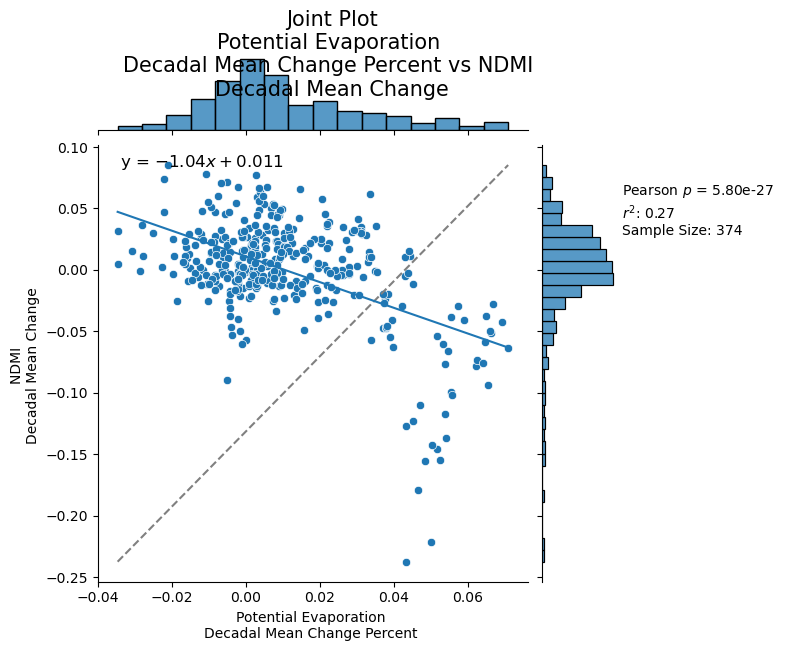

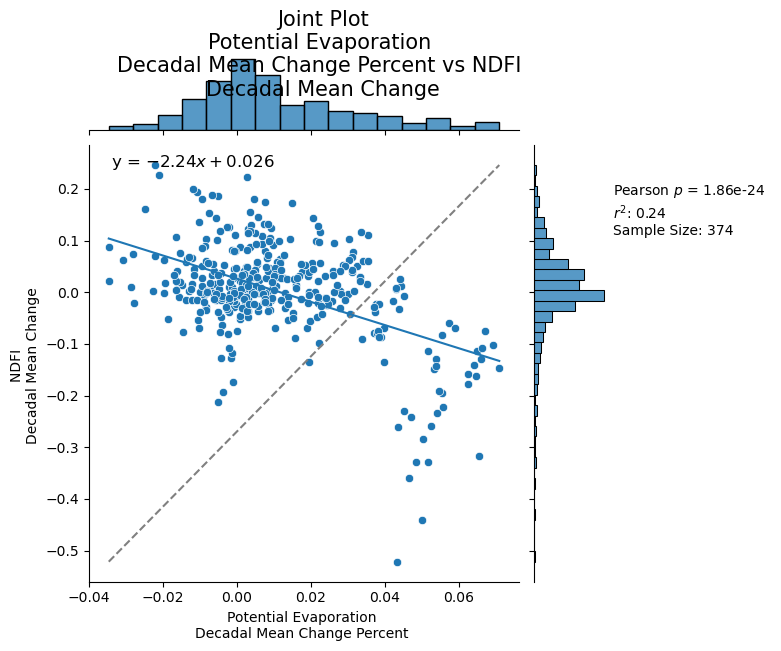

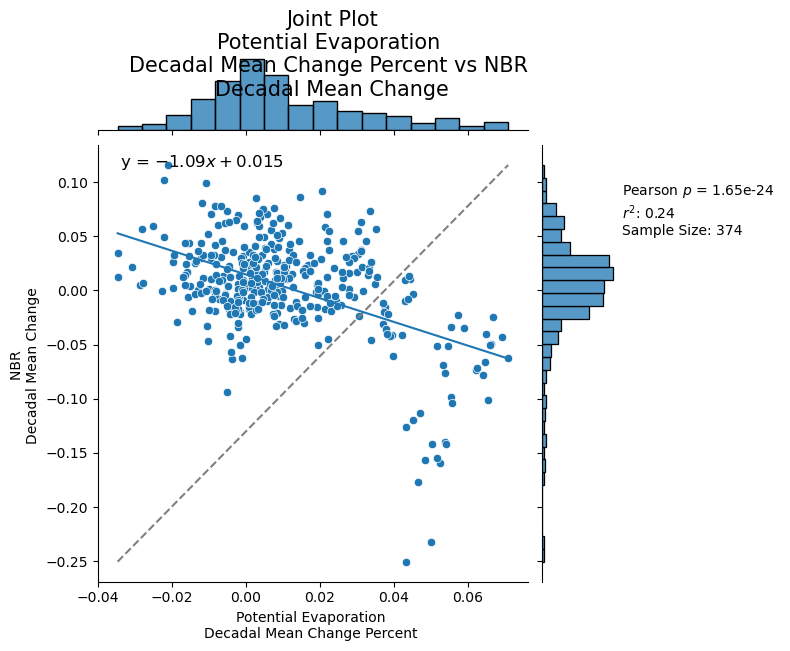

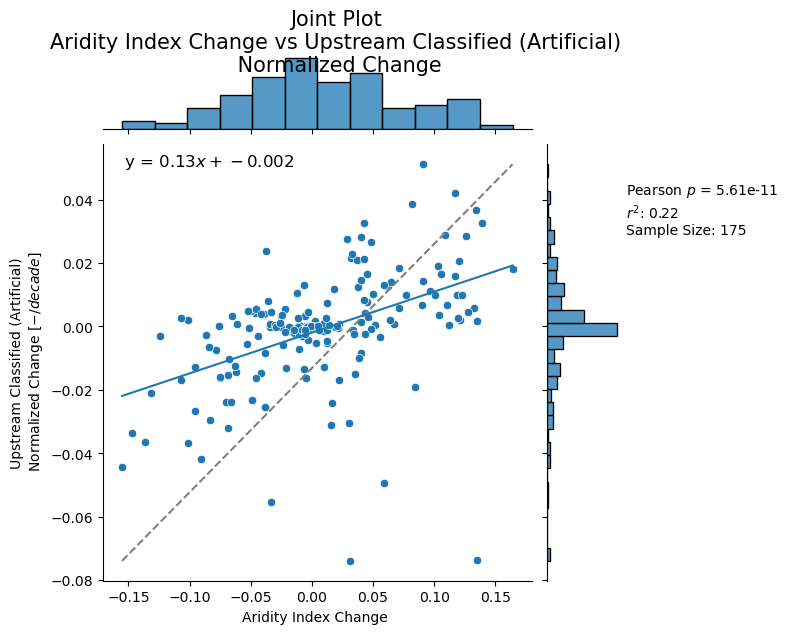

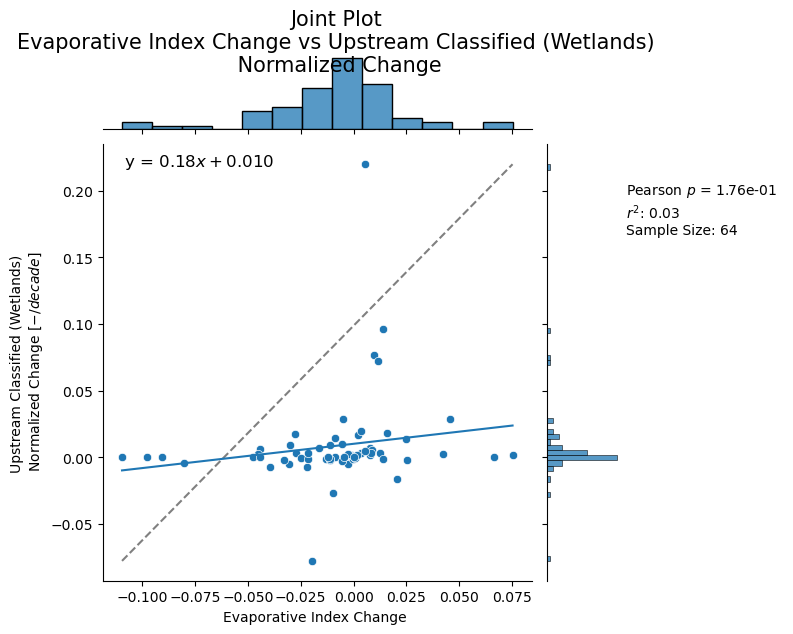

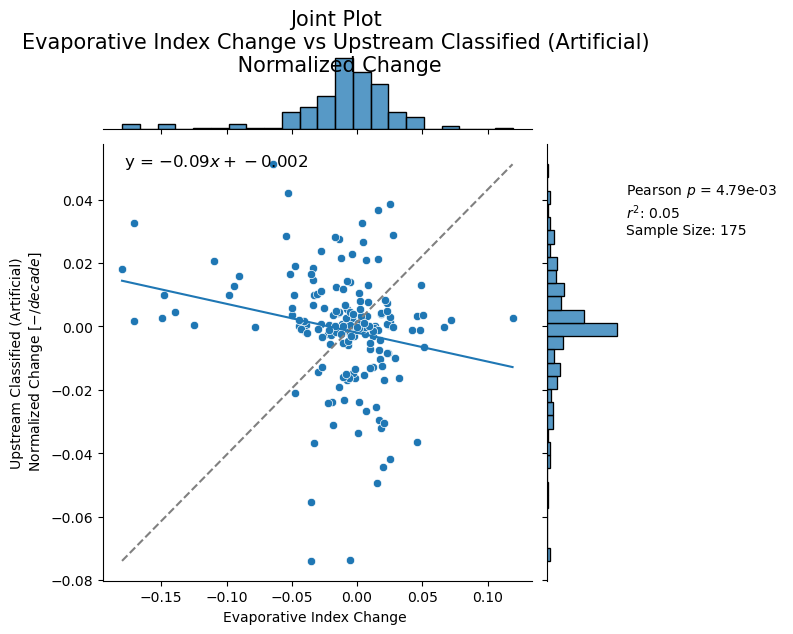

In [586]:
def get_unit_of_measurement(s):
    if 'area' in s:
        return '[$Km^2$]'
    elif 'Evaporative' in s:
        return '[$-/decade$]'
    elif 'normalized' in s:
        return '[$-/decade$]'
    elif 'Potential Evaporation' in s:
        return '[$mm/decade$]'
    elif 'Precipitation' in s:
        return '[$mm$]'
    elif 'T' in s:
        return '[$^o^C$]'
    elif 'Root-zone' in s:
        return '[$mm$]'
    else:
        return ''
    
def scatter_vars(df, x, y):
    plt.xlabel(f'{translate_col_name(x)} {get_unit_of_measurement(x)}')
    plt.ylabel(f'{translate_col_name(y)} {get_unit_of_measurement(y)}')
    plt.title(f'Scatter Plot of {translate_col_name(x)} \nvs\n {translate_col_name(y)}')

    mask = (~df[x].isnull()) & (~df[y].isnull())
    x = df.loc[mask, x]
    y = df.loc[mask, y]
    plt.scatter(x, y)
    plt.suptitle(f'n={len(x)}')

    # Calculate and display the correlation coefficient and its significance level
    r, pval = pearsonr(x, y)

    # Fit and display the regression line and its equation
    slope, intercept, rvalue, pvalue, stderr = linregress(x, y)
    reg_line = f'Regression Line: y = {slope:.2f}x + {intercept:.2f}'
    plt.plot(x, slope * x + intercept, color='r', label=reg_line)
    plt.legend()
    plt.subplots_adjust(top=0.8)

    # Calculate and display the coefficient of determination (R-squared) and adjusted R-squared
    rsq = r ** 2
    n = len(x)
    p = 1  # Assuming only one independent variable (change if necessary)
    df = n - p - 1
    adj_rsquared = 1 - ((1 - rsq) * (n - 1)) / (n - p - 1)

    textstr = f'Correlation Coefficient: {r:.2f}\nP-value: {pval:.2e}\nR-squared: {rsq:.2f}\nAdjusted R-squared: {adj_rsquared:.2f}\nSample Size: {n}\nDegrees of Freedom: {df}'
    props = dict(boxstyle='round', facecolor='white', alpha=0.5)
    plt.text(1.01, 0.98, textstr, transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox=props)

    plt.grid(linestyle=':')
    plt.show()
    
def scatter_vars2(df, x, y):
    # Filter out rows with missing values
    mask = (~df[x].isnull()) & (~df[y].isnull())
    data = df.loc[mask, [x, y]]

    # Calculate correlation coefficient
    r, pval = pearsonr(data[x].values, data[y].values)

    # Create joint plot with regression line
    g = sns.jointplot(x=x, y=y, data=data, kind="reg")
    g.fig.suptitle(f'Joint Plot of {translate_col_name(x)} vs {translate_col_name(y)}', y=1.05, fontsize=15)

    # Add correlation coefficient to the plot
    # g.ax_joint.text(0, 0, f'Correlation: {r:.2f}', transform=g.ax_joint.transAxes, fontsize=12)

    # Calculate adjusted R-squared
    n = len(data)
    p = 1  # Assuming only one independent variable (change if necessary)
    df = n - p - 1
    rsq = r ** 2
    adj_rsquared = 1 - ((1 - rsq) * (n - 1)) / (n - p - 1)
    adj='adj'
    # Add legend outside of the plot
    legend_text = f'Pearson $p$ = {pval:.2e}\n$r^2$: {rsq:.2f}\nadjusted $r^2$: {adj_rsquared:.2f}\nSample Size: {n}\nDegrees of Freedom: {df}'
    g.ax_joint.legend([legend_text], loc='center left', bbox_to_anchor=(1.1, 0.85), frameon=False)

    # Adjust the title and labels
    g.set_axis_labels(f'{translate_col_name(x)} {get_unit_of_measurement(x)}', f'{translate_col_name(y)} {get_unit_of_measurement(y)}')

    plt.show()

def scatter_vars2(df, x, y, is_reflectance=False):
    # Filter out rows with missing values
    mask = (~df[x].isnull()) & (~df[y].isnull())
    
    data = df.loc[mask, [x, y]]
    
    if is_reflectance == True:
        # Calculate correlation coefficient
        r, pval = pearsonr(data[x].values, data[y].values/1000)
        # Create joint plot with regression line
        data[y] = data[y]/1000
        g = sns.jointplot(x=x, y=y, data=data)
    else:
        # Calculate correlation coefficient
        r, pval = pearsonr(data[x].values, data[y].values)
        # Create joint plot with regression line
        g = sns.jointplot(x=x, y=y, data=data)
    
    g.fig.suptitle(f'Joint Plot\n{translate_col_name(x)} vs {translate_col_name(y)}', y=1.05, fontsize=15)
    g.set_axis_labels(f'{translate_col_name(x)} {get_unit_of_measurement(x)}', f'{translate_col_name(y)} {get_unit_of_measurement(y)}')
    
    # Calculate adjusted R-squared
    n = len(data)
    p = 1  # Assuming only one independent variable (change if necessary)
    df = n - p - 1
    rsq = r ** 2
    adj_rsquared = 1 - ((1 - rsq) * (n - 1)) / (n - p - 1)
    
    # Add legend outside of the plot
    legend_text = f'Pearson $p$ = {pval:.2e}\n$r^2$: {rsq:.2f}\nSample Size: {n}'
    
    g.ax_joint.legend([legend_text], loc='center left', bbox_to_anchor=(1.1, 0.85), frameon=False)
    
    x1 = [data[x].min(), data[x].max()]
    
    # Add a 1:1 line
    g.ax_joint.plot(x1, (data[y].min(),data[y].max()) , color='gray', linestyle='--', label='1:1 Line')

    # Add the regression line equation
    slope, intercept = np.polyfit(data[x], data[y], deg=1)
    x2 = np.linspace(x1[0], x1[1], 1000)
    y = slope*x2+intercept
    g.ax_joint.plot(x2, y)
    equation_text = f'y = ${slope:.2f}x + {intercept:.3f}$'
    g.ax_joint.text(0.05, 0.95, equation_text, transform=g.ax_joint.transAxes, fontsize=12)
 
    # Adjust the title and labels
    

    plt.show()

scatter_vars2(df, 'Ep_mean_diff_pct', 'NDMI_mean_change', is_reflectance=True)
scatter_vars2(df, 'Ep_mean_diff_pct', 'NDFI_mean_change', is_reflectance=True)
scatter_vars2(df, 'Ep_mean_diff_pct', 'NBR_mean_change', is_reflectance=True)

scatter_vars2(df, 'AI_change', 'ups_r_1_normalized_change',)

scatter_vars2(df, 'EI_change', 'ups_r_4_normalized_change',)

scatter_vars2(df, 'EI_change', 'ups_r_1_normalized_change',)





Group: 0.2-0.4, indice: 88
Group: 0.4-0.6, indice: 145
Group: 0.6-0.8, indice: 358
Group: 0.8-1.0, indice: 292
Group: 1.0-1.2, indice: 30
Group: 1.2-1.4, indice: 9
Group: 1.4-1.6, indice: 9
Group: 1.6-1.8, indice: 15
Group: 1.8-2.0, indice: 0


C:\Users\creeb\AppData\Local\Temp\ipykernel_36224\2803612289.py:30: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(aridity_table_SR.LT_AI, bins=AI_levels, palette=palette_9)


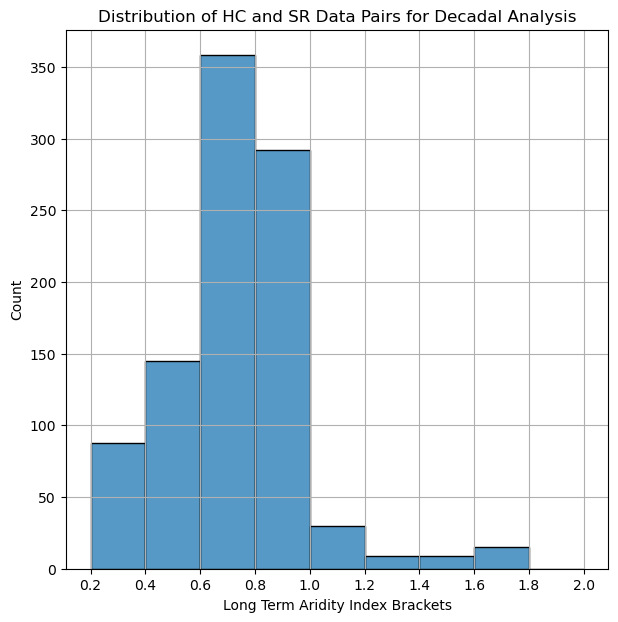

In [104]:
AI_levels = [0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2]

labels=[f'{float(AI_levels[0])}-{float(AI_levels[1])}',
         f'{float(AI_levels[1])}-{float(AI_levels[2])}',
         f'{float(AI_levels[2])}-{float(AI_levels[3])}',
         f'{float(AI_levels[3])}-{float(AI_levels[4])}',
         f'{float(AI_levels[4])}-{float(AI_levels[5])}',
         f'{float(AI_levels[5])}-{float(AI_levels[6])}',
         f'{float(AI_levels[6])}-{float(AI_levels[7])}',
         f'{float(AI_levels[7])}-{float(AI_levels[8])}',
         f'{float(AI_levels[8])}-{float(AI_levels[9])}',]

AI_levels = [0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2]

aridity_table_SR = merged_df.set_index('system_index').sort_values('LT_AI')
aridity_table_SR['AI_group_narrow'] = pd.cut(aridity_table_SR['LT_AI'], AI_levels, labels=labels, ordered=True)

grouped_SR = aridity_table_SR.groupby('AI_group_narrow')
colors9 = ['#FFFFFF','#009B77', '#6CC24A','#FFB81C', '#EC6842', '#A50034', '#222222', '#222222', '#222222']
palette_9 = sns.color_palette(colors9)
dist = []

for group, indices in grouped_SR.indices.items():
    
    print(f"Group: {group}, indice: {len(indices)}")
    dist.append(len(indices))

colors5 = ['#009B77', '#6CC24A','#FFB81C', '#EC6842', '#A50034']

#222222
fig = plt.figure(figsize=(7, 7))
sns.histplot(aridity_table_SR.LT_AI, bins=AI_levels, palette=palette_9)
plt.xticks(AI_levels)
plt.xlabel('Long Term Aridity Index Brackets')
plt.grid()
plt.title('Distribution of HC and SR Data Pairs for Decadal Analysis');

In [587]:
import scipy.stats as stats

def distribution_pairs(grouped_df: pd.DataFrame, top_row: str, tr_label: str, bottom_row: str, br_label: str, suptitle: str):
    fig, ax = plt.subplots(2, 5, figsize=(30, 13))
    fig.text(0.5, 0.95, suptitle, fontsize=18, ha='center', va='top')  # Adjust the y parameter to change the vertical position of the suptitle
    n = []
    index = np.arange(0, 6)

    for i, (group, data) in enumerate(grouped_df):
        lim = np.max(np.abs(data.loc[:, top_row]))

        if len(data) > 0 and lim < 1 and i < 5:
            x1 = data.loc[:, top_row]
            sns.histplot(y=x1.values, ax=ax[0, i], color=colors5[i], orientation='horizontal', kde=True)
            # sns.kdeplot(y=x1.values, ax=ax[0, i], color='black', lw=2)
            mu = np.mean(x1)
            p10 = np.nanpercentile(x1.values, 10)
            p90 = np.nanpercentile(x1.values, 90)
            skew = stats.skew(x1, nan_policy='omit')
            
            ax[0, i].set_ylabel(tr_label)
            ax[0, i].set_title(f'AI {group} \n (n={len(x1.dropna())})')
            ax[0, i].axhline(mu, c='r', label=f'$\mu$: {mu:.3f}')
            ax[0, i].axhline(p90, c='r', ls='--', label=f'$p0.9$: {p90:.3f}')
            ax[0, i].axhline(p10, c='r', ls='--', label=f'$p0.1$: {p10:.3f}')
            ax[0, i].set_xlim(0, 70)
            ax[0, i].grid()
            ax[0, i].legend(loc='upper right', title=f'Skewness: {skew:.2f}')

        if len(data) > 0 and lim < 1 and i < 5:
            x1 = data.loc[:, bottom_row]
            sns.histplot(x=x1.values, ax=ax[1, i], color=colors5[i], kde=True)
            # sns.kdeplot(x=x1.values, ax=ax[1, i], color='black', lw=2)
            mu = np.mean(x1)
            p10 = np.nanpercentile(x1.values, 10)
            p90 = np.nanpercentile(x1.values, 90)
            skew = stats.skew(x1, nan_policy='omit')
            
            ax[1, i].set_xlabel(br_label)
            ax[1, i].axvline(mu, c='r', label=f'$\mu$: {mu:.3f}')
            ax[1, i].axvline(p10, c='r', ls='--', label=f'$p0.1$: {p10:.3f}')
            ax[1, i].axvline(p90, c='r', ls='--', label=f'$p0.9$: {p90:.3f}')
            ax[1, i].set_ylim(0, 70)
            ax[1, i].grid()
            ax[1, i].legend(loc='upper left', title=f'Skewness: {skew:.2f}')



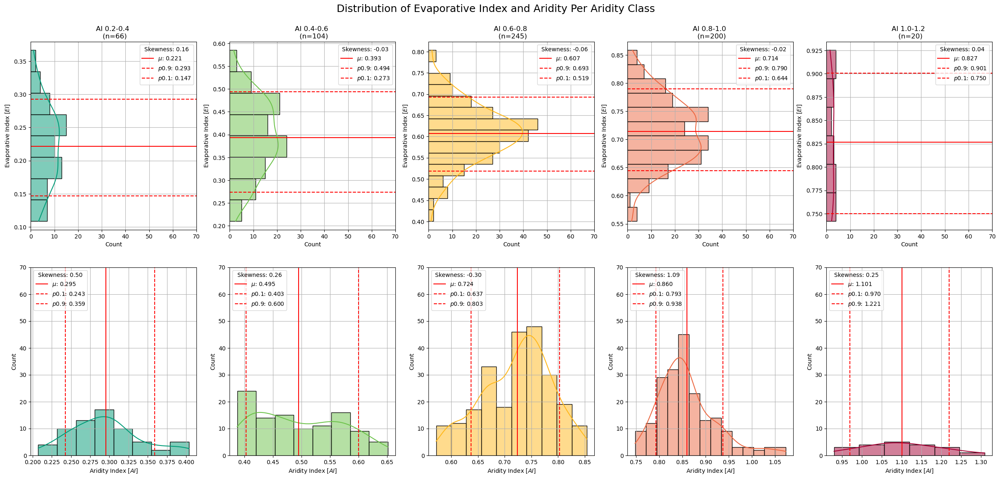

In [588]:
distribution_pairs(grouped_SR, 'EI_mean', 'Evaporative Index [$EI$]', 'AI_mean', 'Aridity Index [$AI$]', 'Distribution of Evaporative Index and Aridity Per Aridity Class')

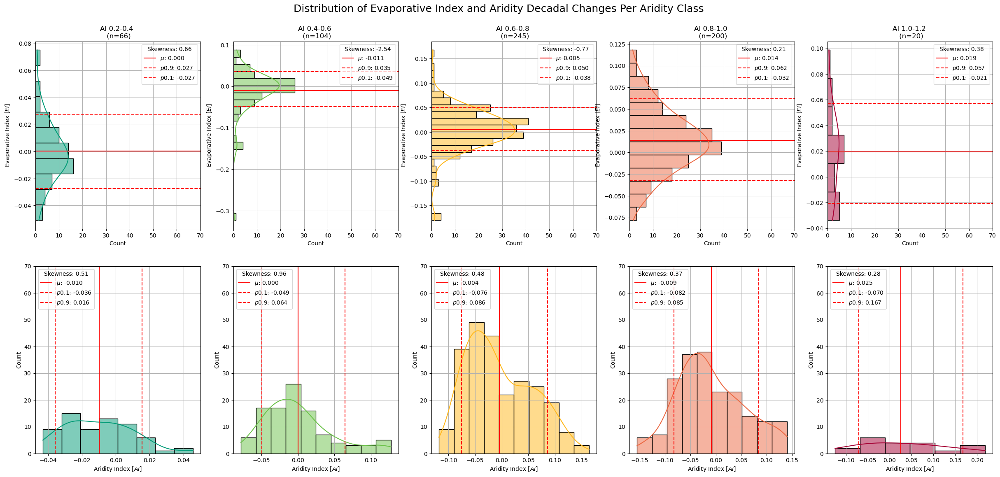

In [589]:
distribution_pairs(grouped_SR, 'EI_change', 'Evaporative Index [$EI$]', 'AI_change', 'Aridity Index [$AI$]', 'Distribution of Evaporative Index and Aridity Decadal Changes Per Aridity Class')

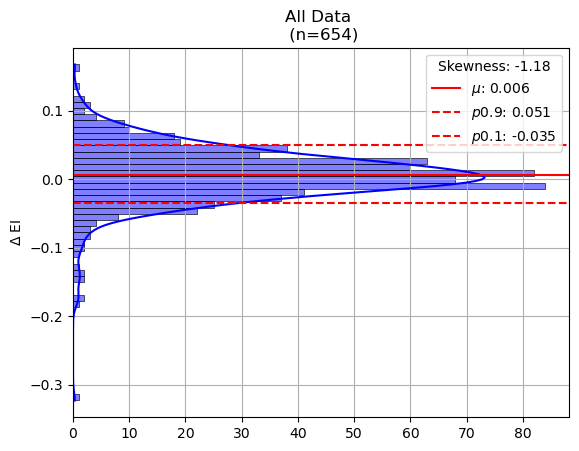

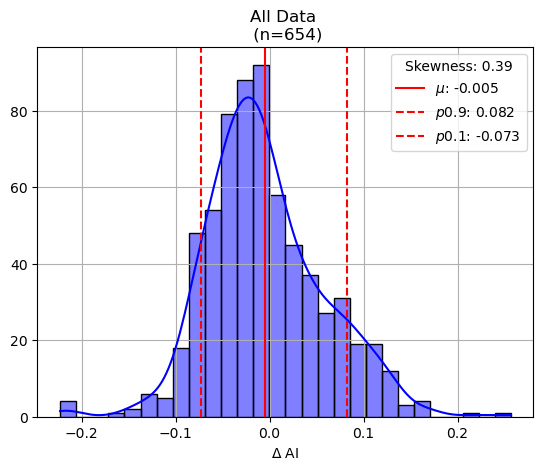

In [590]:
def plot_one_hist(df, top_row, tr_label, hor):
    fig, axs = plt.subplots(1,1)
    x1 = df.loc[:, top_row]
    sns.histplot(x=x1.values if hor=='vertical' else None, y=x1.values if hor=='horizontal' else None, ax=axs, kde=True, color='blue')

    mu = np.mean(x1)
    p10 = np.nanpercentile(x1.values, 10)
    p90 = np.nanpercentile(x1.values, 90)
    skew = stats.skew(x1, nan_policy='omit')

    axs.set_ylabel(tr_label if hor=='horizontal' else None)
    axs.set_xlabel(tr_label if hor=='vertical' else None)
    axs.set_title(f'All Data \n (n={len(x1.dropna())})')
    if hor == 'vertical':
        axs.axvline(mu, c='r', label=f'$\mu$: {mu:.3f}')
        axs.axvline(p90, c='r', ls='--', label=f'$p0.9$: {p90:.3f}')
        axs.axvline(p10, c='r', ls='--', label=f'$p0.1$: {p10:.3f}')
    else: # hor == 'horizontal'
        axs.axhline(mu, c='r', label=f'$\mu$: {mu:.3f}')
        axs.axhline(p90, c='r', ls='--', label=f'$p0.9$: {p90:.3f}')
        axs.axhline(p10, c='r', ls='--', label=f'$p0.1$: {p10:.3f}')
    # axs.set_xlim(0, 100)
    axs.grid()
    axs.legend(loc='upper right', title=f'Skewness: {skew:.2f}')

top_row = 'EI_change'
tr_label = '$\Delta$ EI'
plot_one_hist(merged_df, top_row, tr_label, 'horizontal')

top_row = 'AI_change'
tr_label = '$\Delta$ AI'
plot_one_hist(merged_df, top_row, tr_label, 'vertical')



In [598]:
merged.loc[merged.catchment==8009, ['image_date', 'catchment', 'h_1', 'h_1_change', 'AI_mean', 'AI_mean_diff', 'AI_change']]

,image_date,catchment,h_1,h_1_change,AI_mean,AI_mean_diff,AI_change
0,1899-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
1,1930-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
2,1950-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
3,1960-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
4,1970-08-31 22:00:00,8009,NaN,NaN,NaN,NaN,NaN
5,1979-08-31 22:00:00,8009,NaN,NaN,0.446784,NaN,NaN
6,1989-08-31 22:00:00,8009,NaN,NaN,0.402179,-0.044605,-0.044605
7,1999-08-31 22:00:00,8009,NaN,NaN,0.393159,-0.009020,-0.009020
8,2009-08-31 22:00:00,8009,NaN,NaN,0.388700,-0.004459,-0.004459


C:\Users\creeb\AppData\Local\Temp\ipykernel_36224\3650405472.py:13: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  w = grouped.mean()['omega_mean'][i]


<Figure size 640x480 with 0 Axes>

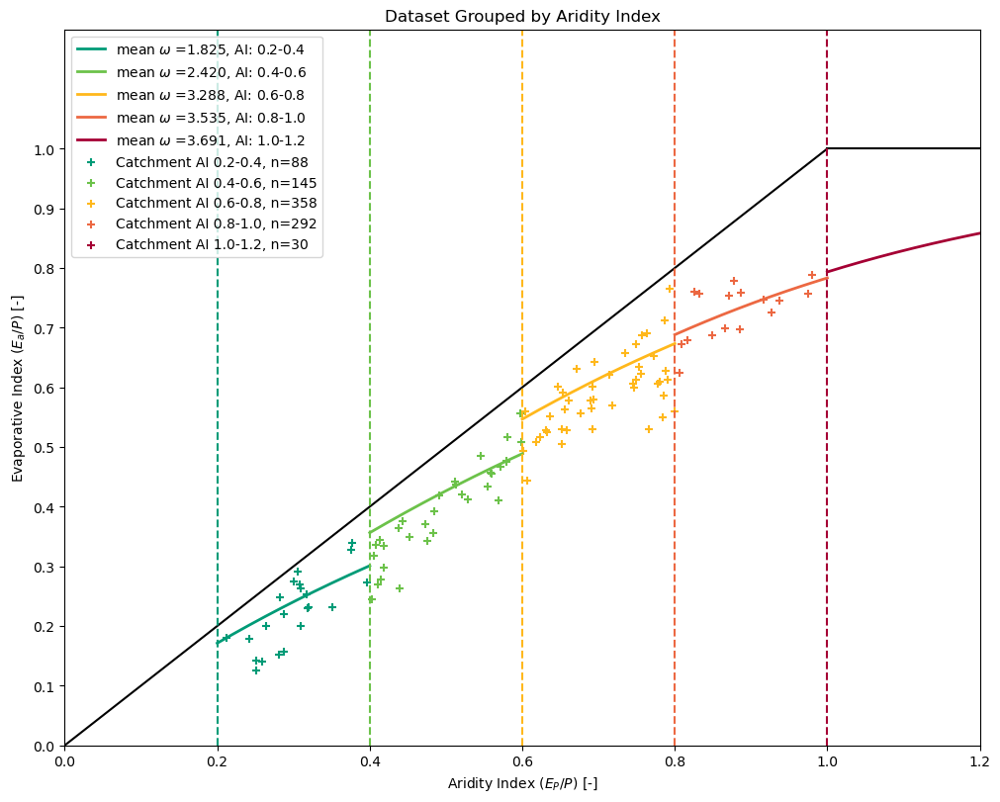

In [109]:
def w_function(AI, w):
    EI = 1 + AI - (1 + (AI**w))**(1/w)
    return EI

plt.figure(99)

def many_w_curves(grouped):
    for i, (group, indices) in enumerate(grouped):
        ls_EI = []
        ls_AI = []
        if i <=4:
            AI = np.linspace(AI_levels[i], AI_levels[i+1], 150)
            w = grouped.mean()['omega_mean'][i]
            EI_curve = w_function(AI, w)
            plt.plot(AI, EI_curve, linewidth=2, c=colors5[i], label=f'mean $\omega$ ={w:.3f}, AI: {group}')
            ls_EI.append(EI_curve)
            ls_AI.append(AI)
         
        else:
            break
    return [ls_EI, ls_AI]


def budyko_aridity(df, grouped):

    budyko_curve_x = np.arange(1, 2, 0.05)
    energy_limit_x = np.arange(0, 1.0001, 0.05)
    x = np.arange(0, 1.0001, 0.05)
    water_limit_y = 1 + budyko_curve_x*0
    energy_limit_y = energy_limit_x
    y = 1 + x*0

    levels = [0, 0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2]

    fig, ax = plt.subplots(1, constrained_layout=True, figsize=(10,8))

    plt.ylabel(f"Evaporative Index ($E_a/P$) [-]")
    plt.xlabel(f"Aridity Index ($E_P/P$) [-]")

    plt.ylim(0, 1.2)

    plt.plot(energy_limit_x, energy_limit_y, c='k')
    plt.plot(budyko_curve_x, water_limit_y,c='k')
    plt.plot()

    plt.yticks([0,0.1,0.2,0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
    plt.xticks([0,0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0]);


    ls_EI, ls_AI = many_w_curves(grouped)

    combo = df.drop_duplicates(subset='system_index', keep='first')

    for i in range(len(colors5)):
        mask = (combo['LT_AI'] >= AI_levels[i]) & (combo['LT_AI'] <= AI_levels[i+1])
        masked = combo[mask]
        scatter1 = ax.scatter(masked.LT_AI, masked.LT_EI, c = colors5[i], label=f'Catchment AI {list(grouped.groups.keys())[i]}, n={len(list(grouped.groups.values())[i])}', marker='+')

    for i, level in enumerate(levels[1:6]):
        plt.axvline(level, ymax=1, linestyle='dashed', color=colors5[i])


    #cbar.set_ticks(AI_levels)
    #cbar.set_ticklabels(colors9)

    plt.title('Dataset Grouped by Aridity Index')
    plt.xlim(0,1.2)

    plt.legend()

budyko_aridity(merged_df, grouped_SR)

0.6481305508918263
0.6622884639522439
0.6334997071742983
0.47519605104368307
0.3231161550358926
[0.5750598980367699, 0.5849654121701583, 0.5646881289544844, 0.44360828432140753, 0.31252708333594]


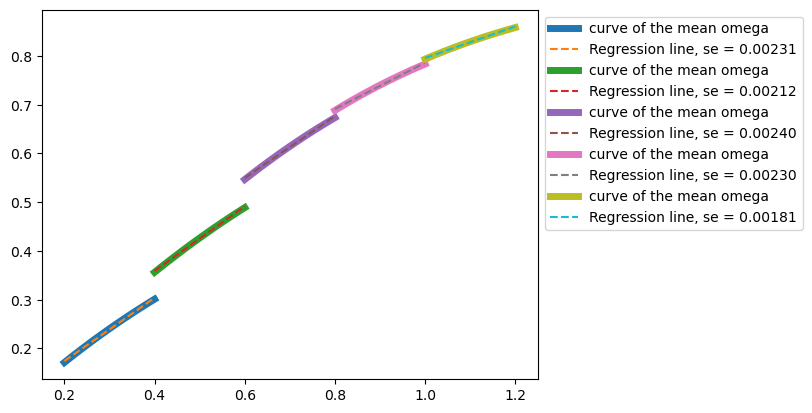

In [110]:
w_slope_rad = []

for i, (group, data) in enumerate(grouped_SR):
    w = data['omega_mean'].mean()
    x0 = AI_levels[i]
    x1 = AI_levels[i+1]
    x = np.linspace(x0, x1, 100)
    y = w_function(x, w)
    slope, intercept, r, p, se = linregress(x, y)
    print(slope)
    
    slope_radians = np.arctan(slope)
    w_slope_rad.append(slope_radians)
    
    plt.plot(x, y, linewidth=5, label='curve of the mean omega')
    plt.plot(x, slope*x + intercept, linestyle='dashed', label=f'Regression line, se = {se:.5f}')

    if i == 4:
        break

plt.legend(bbox_to_anchor=(1,1))

print(w_slope_rad)

- North (upwards, 0 degrees) corresponds to a positive change in the Y direction and no change in the X direction.
- East (rightwards, 90 degrees) corresponds to a positive change in the X direction and no change in the Y direction.
- South (downwards, 180 degrees) corresponds to a negative change in the Y direction and no change in the X direction.
- West (leftwards, 270 degrees) corresponds to a negative change in the X direction and no change in the Y direction.

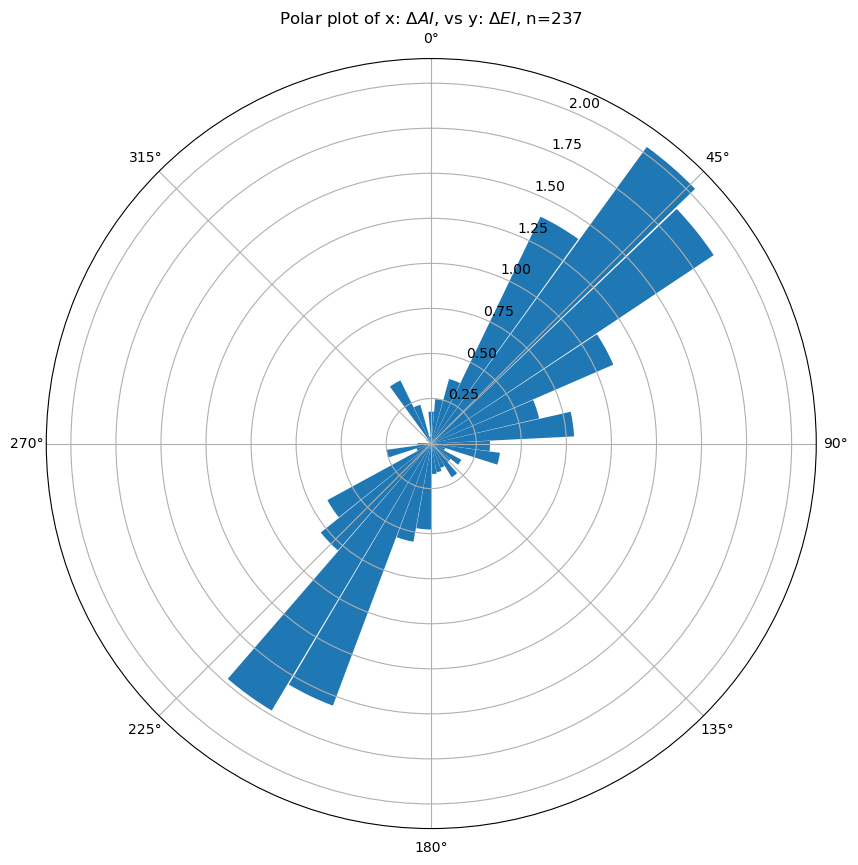

,catchment_name,decade_ending,d_EI,d_AI
2,La Bar Cheveuges,2005,0.012606,0.020515
10,La Bar Cheveuges,2015,0.023297,0.040631


Index(['d_AI', 'd_GREENNESS', 'd_nbr', 'd_T', 'd_B7', 'LT_EI', 'd_SI', 'd_B4',
       'd_B1', 'd_ndmi', 'Unnamed: 0', 'LT_AI', 'LT_SR', 'd_gndvi',
       'system_index', 'd_ndbi', 'decade_ending', 'd_B5', 'd_BRIGHTNESS',
       'd_evi', 'd_omega', 'd_B3', 'd_WETNESS', 'd_B2', 'd_EI', 'country_code',
       'd_ndvi', 'd_is_dur', 'd_ST', 'catchment_name'],
      dtype='object')


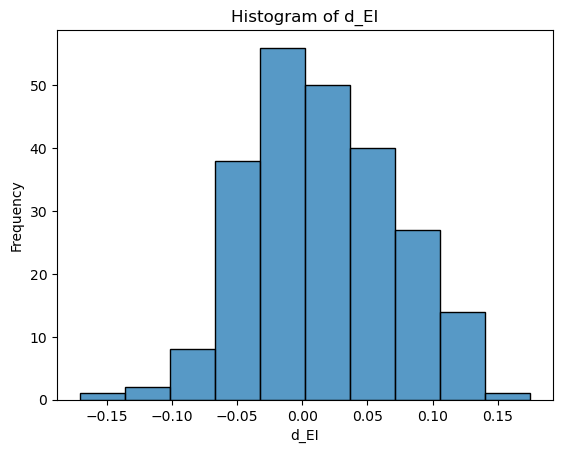

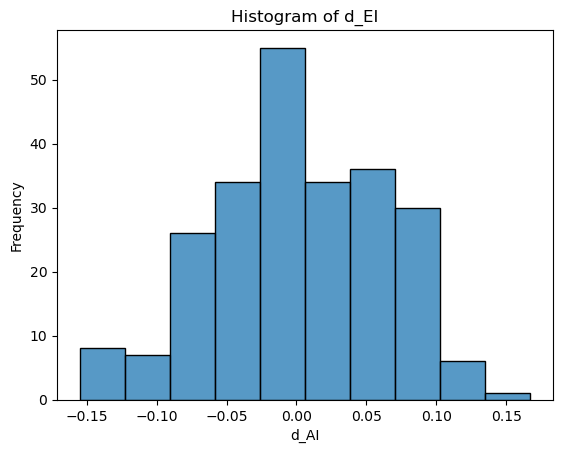

In [111]:
df = pd.read_excel('../Outputs/all/old_d_combo.xlsx')

# Get the angle and magnitude of each data point
angles = np.arctan2(df['d_EI'], df['d_AI'])
magnitudes = np.sqrt(df['d_AI']**2 + df['d_EI']**2)


# Create bins for the angles
bins = np.linspace(-np.pi, np.pi, num=36)

# Create a histogram of the angles
hist, _ = np.histogram(angles, bins=bins, weights=magnitudes)

# Plot the rose diagram
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(20, 10))
ax.bar(bins[:-1], hist, width=2*np.pi/36, align='edge', bottom=0)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
ax.set_title(f"Polar plot of x: $\Delta AI$, vs y: $\Delta EI$, n={len(df)}")
plt.show()

display(df.loc[df.catchment_name == 'La Bar Cheveuges ', ['catchment_name', 'decade_ending', 'd_EI', 'd_AI']])
print(df.keys())
# Plot histogram
sns.histplot(data=df, x='d_EI', bins=10)  # Adjust the number of bins as needed

# Set labels and title
plt.xlabel('d_EI')
plt.ylabel('Frequency')
plt.title('Histogram of d_EI')

# Display the plot
plt.show()

sns.histplot(data=df, x='d_AI', bins=10)  # Adjust the number of bins as needed

# Set labels and title
plt.xlabel('d_AI')
plt.ylabel('Frequency')
plt.title('Histogram of d_EI')

# Display the plot
plt.show()

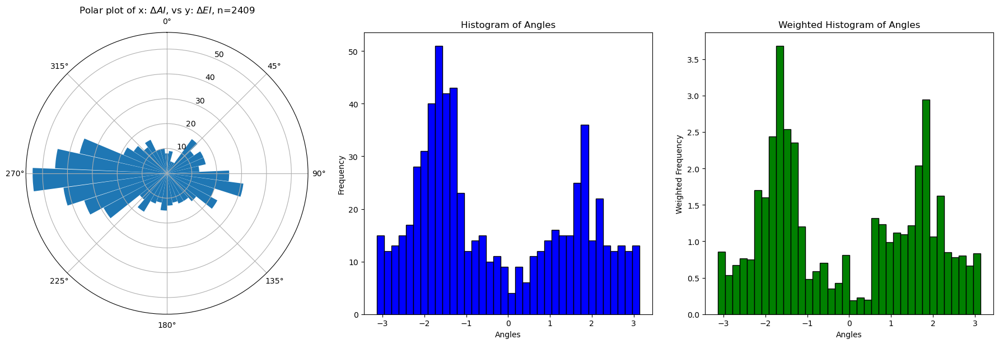

In [112]:
df = merged_df

# Calculate angles and wrap around if necessary
angles = np.arctan2(df['EI_change'], df['AI_change']) + np.pi/2
angles = np.where(angles > np.pi, angles - 2*np.pi, angles)

# Calculate the magnitudes of changes
magnitudes = np.sqrt(df['AI_change']**2 + df['EI_change']**2)

# Create bins for the angles
bins = np.linspace(-np.pi, np.pi, num=36)

# Create the figure and subplots
fig = plt.figure(figsize=(18, 6))
ax1 = fig.add_subplot(131, projection='polar')
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

# Plot the polar plot on the first subplot
hist, _ = np.histogram(angles, bins=bins)
ax1.bar(bins[:-1], hist, width=2*np.pi/36, align='edge', bottom=0)
ax1.set_theta_zero_location("N")
ax1.set_theta_direction(-1)
ax1.set_title(f"Polar plot of x: $\Delta AI$, vs y: $\Delta EI$, n={len(df)}")

# Plot the histogram of angles on the second subplot
ax2.hist(angles, bins=36, edgecolor='black', color='blue')
ax2.set_xlabel('Angles')
ax2.set_ylabel('Frequency')
ax2.set_title('Histogram of Angles')

# Plot the weighted histogram on the third subplot
ax3.hist(angles, bins=36, weights=magnitudes, edgecolor='black', color='green')
ax3.set_xlabel('Angles')
ax3.set_ylabel('Weighted Frequency')
ax3.set_title('Weighted Histogram of Angles')

plt.tight_layout()
plt.show()


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (4, 2) + inhomogeneous part.

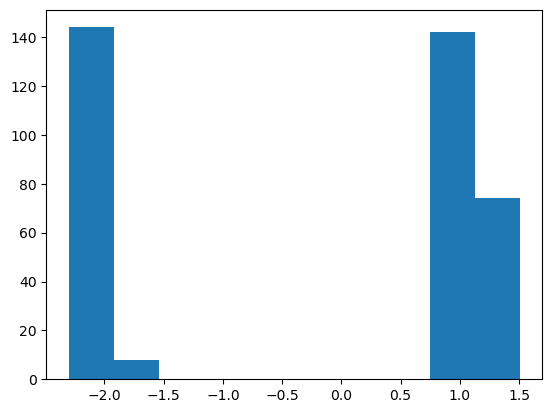

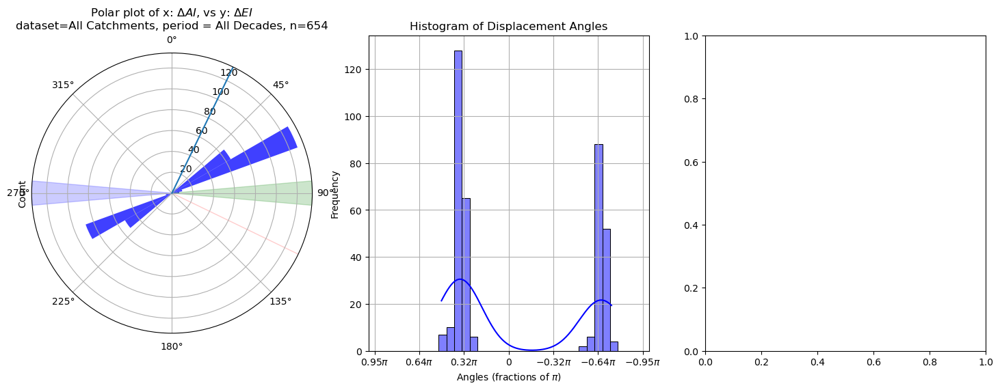

In [633]:
import matplotlib.ticker as ticker

def format_pi(value, _):
    frac = value / np.pi
    if frac == 0:
        return '0'
    elif frac == 1:
        return '$\pi$'
    else:
        return f'${frac:.2f}\pi$'


def hist_plot_i(df, dataset, period, subplot, color, merge, suffix):  
    df = df.dropna(subset=['EI_change', 'AI_change'])
    
    # Calculate angles and wrap around if necessary
    angles = np.arctan2(df['EI_change'], df['AI_change'])
    angles = np.where(angles > np.pi, angles - 2*np.pi, angles)

    # Calculate the magnitudes of changes
    magnitudes = np.sqrt(df['AI_change']**2 + df['EI_change']**2)

    # Remove nan values from angles and magnitudes simultaneously
    valid_indices = ~np.isnan(angles) & ~np.isnan(magnitudes)
    angles = angles[valid_indices]
    magnitudes = magnitudes[valid_indices]

    # Normalize the magnitudes to a specific range for weighting
    min_weight = 0.1  # Minimum weight
    max_weight = 1.0  # Maximum weight
    normalized_magnitudes = (magnitudes - magnitudes.min()) / (magnitudes.max() - magnitudes.min())
    weights = min_weight + (max_weight - min_weight) * normalized_magnitudes
    
    def estimate_y(AI_mean):
        x = np.linspace(AI_mean * 0.97, AI_mean * 1.03, 100)
        y = w_function(x, w)
        slope, intercept, r, p, se = linregress(x, y)
        return slope
    
    df['slope'] = df['AI_mean'].map(estimate_y)
    
    
    slope_radians = np.arctan(df.slope)
    bin_width = 2 * np.pi / 36  # Assuming 36 bins
    
    # Create the figure and subplots
    fig = plt.figure(figsize=(18, 6))
    ax1 = fig.add_subplot(131, projection='polar')
    
    
    sns.histplot(angles, kde=False, bins=np.linspace(-np.pi, np.pi, num=37), ax=ax1, color=color)
    ax1.set_title(f"Polar plot of x: $\Delta AI$, vs y: $\Delta EI$\ndataset={dataset}, period = {period}, n={len(df.AI_change.dropna())}")
    
    # Rotate the red and green spans by 90 degrees (or π/2 radians)
    ax1.axvspan(slope_radians.min() - bin_width/2, slope_radians.max() + bin_width/2, alpha=0.2, color='red')
    ax1.axvspan(slope_radians.min() - bin_width/2 +np.pi, slope_radians.max() + bin_width/2 +np.pi, alpha=0.2, color='red')
    ax1.axvspan(-np.pi/2 - bin_width/2, -np.pi/2 + bin_width/2, alpha=0.2, color='green')
    ax1.axvspan(-np.pi/2 - bin_width/2+np.pi, -np.pi/2 + bin_width/2+np.pi, alpha=0.2, color='green')
    
    

    dx = df['AI_change']
    dy = df['EI_change']
    
#     change_org = np.array([dx, dy])
        
#     expected = np.array([dx, dx*np.tan(slope_radians)])

#     change_adj = change_org - expected

#     if subplot==True:
#         ax2 = fig.add_subplot(132)
#         ax3 = fig.add_subplot(133)

        

#         # Plot the histogram of angles on the second subplot
#         sns.histplot(angles, kde=True, bins=np.linspace(-np.pi, np.pi, num=37), ax=ax2, color='blue')
#         ax2.set_xlim(np.pi, -np.pi)
#         ax2.set_xlabel('Angles (fractions of $\pi$)')
#         ax2.set_ylabel('Frequency')
#         ax2.set_title('Histogram of Displacement Angles')
#         ax2.grid()
#         ax2.xaxis.set_major_formatter(ticker.FuncFormatter(format_pi))
#         ax2.axvspan(slope_radians.min() - bin_width/2, slope_radians.max() + bin_width/2, alpha=0.2, color='red')
#         ax2.axvspan(slope_radians.min() - bin_width/2 -np.pi, slope_radians.max() + bin_width/2 -np.pi, alpha=0.2, color='red')
#         # ax2.axvspan(slope_radians + bin_width/2 +np.pi, slope_radians - bin_width/2 +np.pi, alpha=0.2, color='red')

#         ax3.quiver(np.zeros(len(df.AI_change)), np.zeros(len(df.AI_change)), change_org[0], change_org[1], angles='xy', scale_units='xy', scale=1, color='blue')
#         # ax3.quiver(np.zeros(len(df.AI_change)), np.zeros(len(df.AI_change)), change_adj[0], change_adj[1], angles='xy', scale_units='xy', scale=1, color='red', alpha=0.3)
#         ax3.quiver(0, 0, np.cos(slope_radians.mean()), np.sin(slope_radians.mean()), angles='xy', scale_units='xy', scale=1, color='red')
#         ax3.quiver(0, 0, -np.cos(slope_radians.mean()), -np.sin(slope_radians.mean()), angles='xy', scale_units='xy', scale=1, color='red')

#         max_abs = max(np.max(np.abs(dx))*1.1, np.max(np.abs(dy))*1.1)
#         ax3.set_xlim(-max_abs, max_abs)
#         ax3.set_ylim(-max_abs, max_abs)
#         ax3.set_xlabel('AI change')
#         ax3.set_ylabel('EI change')
#         ax3.set_title('Vectors of AI and EI changes')
#         ax3.grid()
        
        
#         fig4, ax5 = plt.subplots(figsize=(10, 6.18))

#         # Plot the histograms
#         sns.histplot(change_org[1], 
#              label=f'$\Delta EI$ (n={len(change_org[1])}), Skewness={pd.Series(change_org[1]).skew():.2f}, Mean={change_org[1].mean():.3f}, $\sigma$={change_org[1].std():.3f}', 
#              bins=int(np.sqrt(len(change_org[1]))))
#         sns.histplot(change_adj[1], label='$\Delta EI_{adj}$'+f' (n={len(change_adj[1])}), Skewness={pd.Series(change_adj[1]).skew():.3f}, Mean={change_adj[1].mean():.3f}, $\sigma$={change_org[1].std():.3f}', bins=int(np.sqrt(len(change_org[1]))))
        

#         ax5.set_xlabel('Change in Evaporative Index ($\Delta EI$)')
#         ax5.set_ylabel('Count')
#         ax5.set_title('Original vs Adjusted Changes in EI')
#         ax5.grid()
#         ax5.legend()
        
    

#     plt.tight_layout()
#     plt.show()
    
    
#     df.loc[:,'adj_EI_change'+suffix] = change_adj[1]
#     df.loc[:,'magnitudes'+suffix] = magnitudes
#     df.loc[:,'normalized_magnitude'+suffix] = normalized_magnitudes

#     return df



    
    # plt.hist(df.AI_change)
EI_a_ind = hist_plot(merged_df.dropna(subset=['AI_change', 'EI_change']), 'All Catchments', 'All Decades', True, 'blue', True, '_all')
display(EI_a_ind)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (4, 2) + inhomogeneous part.

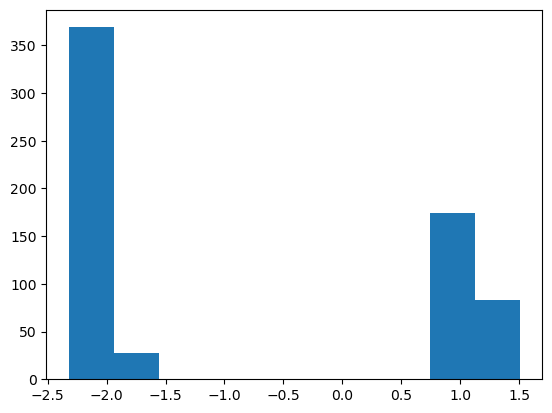

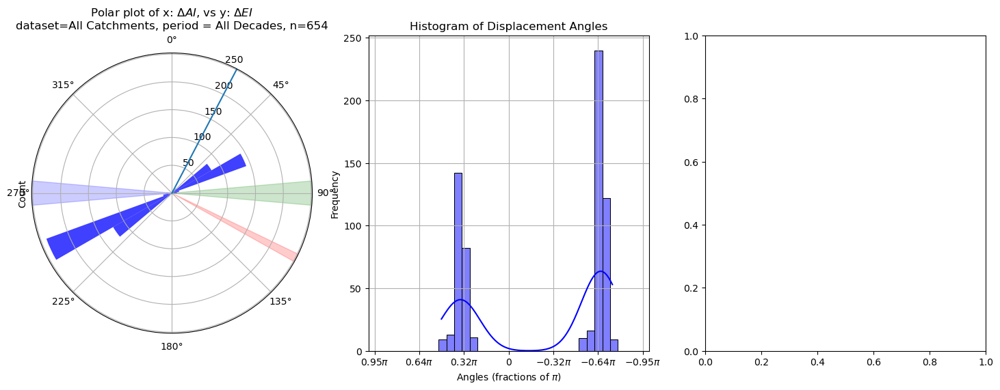

In [631]:
import matplotlib.ticker as ticker

def format_pi(value, _):
    frac = value / np.pi
    if frac == 0:
        return '0'
    elif frac == 1:
        return '$\pi$'
    else:
        return f'${frac:.2f}\pi$'

def estimate_y(x, w):
    x= np.linspace(x*0.97, x*1.03,100)
    y = w_function(x, w)
    slope, intercept, r, p, se = linregress(x, y)
    return slope

def hist_plot(dataframe, dataset, period, subplot, color, merge, suffix):  
    
    grouped = dataframe.groupby('catchment')
    
    new_df = pd.DataFrame()
    
    for catch, df in grouped:
        x1 = df.AI_mean.shift()
        x2 = df.AI_mean
        x = df.AI_change
        df['dx'] = x2-x1
        
        
        df['b'] = np.where(df['AI_change'] > 0, 90, 270)
        df['omega_mean_shift'] = df.omega_mean.shift()
        df['y_clim_x1'] = w_function(x1, df.omega_mean_shift)
        df['y_clim_x2'] = w_function(x2, df.omega_mean_shift)
        df['dy_clim'] = df.y_clim_x2 - df.y_clim_x1
        df['theta'] = np.radians(df.b) - np.arctan(df.dy_clim / df.AI_change)
        df['r'] = np.sqrt(df.dy_clim**2 + x**2)

        new_df = pd.concat([new_df, df])
        
    

    new_df['slope_rad'] = df.apply(lambda row: np.arctan(estimate_y(row['AI_mean'], row['omega_mean'])), axis=1)

    df = new_df 
    
    # Calculate angles and wrap around if necessary
    angles = df.theta
    magnitudes = df.r
    
    slope_radians = df.slope_rad
    angles = np.where(angles > np.pi, angles - 2*np.pi, angles)
    
    # Remove nan values from angles and magnitudes simultaneously
    valid_indices = ~np.isnan(angles) & ~np.isnan(magnitudes)
    angles = angles[valid_indices]
    magnitudes = magnitudes[valid_indices]

    # Normalize the magnitudes to a specific range for weighting
    min_weight = 0.1  # Minimum weight
    max_weight = 1.0  # Maximum weight
    normalized_magnitudes = (magnitudes - magnitudes.min()) / (magnitudes.max() - magnitudes.min())
    weights = min_weight + (max_weight - min_weight) * normalized_magnitudes
    
    x0 = df.AI_mean.min()
    x1 = df.AI_mean.max()
    x = np.linspace(x0, x1, 100)
    
    # Create the figure and subplots
    fig = plt.figure(figsize=(18, 6))
    ax1 = fig.add_subplot(131, projection='polar')
    
    ax1.set_theta_direction('clockwise')
    ax1.set_theta_zero_location('N')
    
    
    sns.histplot(angles, kde=False, bins=np.linspace(-np.pi, np.pi, num=37), ax=ax1, color=color)
    ax1.set_title(f"Polar plot of x: $\Delta AI$, vs y: $\Delta EI$\ndataset={dataset}, period = {period}, n={len(df.AI_change.dropna())}")
    
    hbw = bin_width/2
    clim_min =np.pi/2 + slope_radians.min()
    clim_max = np.pi/2 + slope_radians.max()
    # Rotate the red and green spans by 90 degrees (or π/2 radians)
    ax1.axvspan(clim_min, clim_max, alpha=0.2, color='red')
    ax1.axvline(slope_radians.mean())
    # ax1.axvspan(slope_radians.min() - bin_width/2 +np.pi, slope_radians.max() + bin_width/2 +np.pi, alpha=0.2, color='red')
    ax1.axvspan(-np.pi/2 - bin_width/2, -np.pi/2 + bin_width/2, alpha=0.2, color='blue')
    ax1.axvspan(-np.pi/2 - bin_width/2+np.pi, -np.pi/2 + bin_width/2+np.pi, alpha=0.2, color='green')
    
    

    dx = df['AI_change']
    dy = df['EI_change']
    
    change_org = np.array([dx, dy])
        
    expected = np.array([dx, dx*np.tan(slope_radians)])

    change_adj = change_org - expected

    if subplot==True:
        ax2 = fig.add_subplot(132)
        ax3 = fig.add_subplot(133)

        # Plot the histogram of angles on the second subplot
        sns.histplot(angles, kde=True, bins=np.linspace(-np.pi, np.pi, num=37), ax=ax2, color='blue')
        ax2.set_xlim(np.pi, -np.pi)
        ax2.set_xlabel('Angles (fractions of $\pi$)')
        ax2.set_ylabel('Frequency')
        ax2.set_title('Histogram of Displacement Angles')
        ax2.grid()
        ax2.xaxis.set_major_formatter(ticker.FuncFormatter(format_pi))
        
        
        ax2.axvspan(slope_radians - bin_width/2, slope_radians + bin_width/2, alpha=0.2, color='red')
        ax2.axvspan(slope_radians - bin_width/2 -np.pi, slope_radians + bin_width/2 -np.pi, alpha=0.2, color='red')
        ax2.axvspan(slope_radians + bin_width/2 +np.pi, slope_radians - bin_width/2 +np.pi, alpha=0.2, color='red')

        ax3.quiver(np.zeros(len(df.AI_change)), np.zeros(len(df.AI_change)), change_org[0], change_org[1], angles='xy', scale_units='xy', scale=1, color='blue')
        # ax3.quiver(np.zeros(len(df.AI_change)), np.zeros(len(df.AI_change)), change_adj[0], change_adj[1], angles='xy', scale_units='xy', scale=1, color='red', alpha=0.3)
        ax3.quiver(0, 0, np.cos(slope_radians), np.sin(slope_radians), angles='xy', scale_units='xy', scale=1, color='red')
        ax3.quiver(0, 0, -np.cos(slope_radians), -np.sin(slope_radians), angles='xy', scale_units='xy', scale=1, color='red')

        max_abs = max(np.max(np.abs(dx))*1.1, np.max(np.abs(dy))*1.1)
        ax3.set_xlim(-max_abs, max_abs)
        ax3.set_ylim(-max_abs, max_abs)
        ax3.set_xlabel('AI_change')
        ax3.set_ylabel('EI_change')
        ax3.set_title('Vectors of AI and EI changes')
        ax3.grid()
        
        
        fig4, ax5 = plt.subplots(figsize=(10, 6.18))

        # Plot the histograms
        sns.histplot(change_org[1], 
             label=f'$\Delta EI$ (n={len(change_org[1])}), Skewness={pd.Series(change_org[1]).skew():.2f}, Mean={change_org[1].mean():.3f}, $\sigma$={change_org[1].std():.3f}', 
             bins=int(np.sqrt(len(change_org[1]))))
        sns.histplot(change_adj[1], label='$\Delta EI_{adj}$'+f' (n={len(change_adj[1])}), Skewness={pd.Series(change_adj[1]).skew():.3f}, Mean={change_adj[1].mean():.3f}, $\sigma$={change_org[1].std():.3f}', bins=int(np.sqrt(len(change_org[1]))))
        

        ax5.set_xlabel('Change in Evaporative Index ($\Delta EI$)')
        ax5.set_ylabel('Count')
        ax5.set_title('Original vs Adjusted Changes in EI')
        ax5.grid()
        ax5.legend()
        
    

    plt.tight_layout()
    plt.show()
    
    
    df.loc[:,'adj_EI_change'+suffix] = change_adj[1]
    df.loc[:,'magnitudes'+suffix] = magnitudes
    df.loc[:,'normalized_magnitude'+suffix] = normalized_magnitudes

    return df



    
    # plt.hist(df.AI_change)
merge_w_EI_adj = hist_plot(merged_df, 'All Catchments', 'All Decades', True, 'blue', True, '_all')
display(merge_w_EI_adj)

Jaramillo 2018

In [634]:
import matplotlib.ticker as ticker

def format_pi(value, _):
    frac = value / np.pi
    if frac == 0:
        return '0'
    elif frac == 1:
        return '$\pi$'
    else:
        return f'${frac:.2f}\pi$'


def hist_plot(df, dataset, period, subplot, color, merge, suffix):  
    # df = df.dropna(subset=['EI_change', 'AI_change')
    # Calculate angles and wrap around if necessary
    
    
    # Calculate the magnitudes of changes
    magnitudes = np.sqrt(df['AI_change']**2 + df['EI_change']**2)

    # Remove nan values from angles and magnitudes simultaneously
    valid_indices = ~np.isnan(angles) & ~np.isnan(magnitudes)
    angles = angles[valid_indices]
    magnitudes = magnitudes[valid_indices]

    # Normalize the magnitudes to a specific range for weighting
    min_weight = 0.1  # Minimum weight
    max_weight = 1.0  # Maximum weight
    normalized_magnitudes = (magnitudes - magnitudes.min()) / (magnitudes.max() - magnitudes.min())
    weights = min_weight + (max_weight - min_weight) * normalized_magnitudes
    
    x0 = df.AI_mean.min()
    x1 = df.AI_mean.max()
    x = np.linspace(x0, x1, 100)
    
    slope, intercept, r, p, se = linregress(x, y)
    slope_radians = np.arctan(slope)
    bin_width = 2 * np.pi / 36  # Assuming 36 bins
    
    # Create the figure and subplots
    fig = plt.figure(figsize=(18, 6))
    ax1 = fig.add_subplot(131, projection='polar')
    
    
    sns.histplot(angles, kde=False, bins=np.linspace(-np.pi, np.pi, num=37), ax=ax1, color=color)
    ax1.set_title(f"Polar plot of x: $\Delta AI$, vs y: $\Delta EI$\ndataset={dataset}, period = {period}, n={len(df.AI_change.dropna())}")
    
    # Rotate the red and green spans by 90 degrees (or π/2 radians)
    ax1.axvspan(slope_radians - bin_width/2, slope_radians + bin_width/2, alpha=0.2, color='red')
    ax1.axvspan(slope_radians - bin_width/2 +np.pi, slope_radians + bin_width/2 +np.pi, alpha=0.2, color='red')
    ax1.axvspan(-np.pi/2 - bin_width/2, -np.pi/2 + bin_width/2, alpha=0.2, color='green')
    ax1.axvspan(-np.pi/2 - bin_width/2+np.pi, -np.pi/2 + bin_width/2+np.pi, alpha=0.2, color='green')
    
    

    dx = df['AI_change']
    dy = df['EI_change']
    
    change_org = np.array([dx, dy])
        
    expected = np.array([dx, dx*np.tan(slope_radians)])

    change_adj = change_org - expected

    if subplot==True:
        ax2 = fig.add_subplot(132)
        ax3 = fig.add_subplot(133)

        

        # Plot the histogram of angles on the second subplot
        sns.histplot(angles, kde=True, bins=np.linspace(-np.pi, np.pi, num=37), ax=ax2, color='blue')
        ax2.set_xlim(np.pi, -np.pi)
        ax2.set_xlabel('Angles (fractions of $\pi$)')
        ax2.set_ylabel('Frequency')
        ax2.set_title('Histogram of Displacement Angles')
        ax2.grid()
        ax2.xaxis.set_major_formatter(ticker.FuncFormatter(format_pi))
        ax2.axvspan(slope_radians - bin_width/2, slope_radians + bin_width/2, alpha=0.2, color='red')
        ax2.axvspan(slope_radians - bin_width/2 -np.pi, slope_radians + bin_width/2 -np.pi, alpha=0.2, color='red')
        ax2.axvspan(slope_radians + bin_width/2 +np.pi, slope_radians - bin_width/2 +np.pi, alpha=0.2, color='red')

        ax3.quiver(np.zeros(len(df.AI_change)), np.zeros(len(df.AI_change)), change_org[0], change_org[1], angles='xy', scale_units='xy', scale=1, color='blue')
        # ax3.quiver(np.zeros(len(df.AI_change)), np.zeros(len(df.AI_change)), change_adj[0], change_adj[1], angles='xy', scale_units='xy', scale=1, color='red', alpha=0.3)
        ax3.quiver(0, 0, np.cos(slope_radians), np.sin(slope_radians), angles='xy', scale_units='xy', scale=1, color='red')
        ax3.quiver(0, 0, -np.cos(slope_radians), -np.sin(slope_radians), angles='xy', scale_units='xy', scale=1, color='red')

        max_abs = max(np.max(np.abs(dx))*1.1, np.max(np.abs(dy))*1.1)
        ax3.set_xlim(-max_abs, max_abs)
        ax3.set_ylim(-max_abs, max_abs)
        ax3.set_xlabel('AI_change')
        ax3.set_ylabel('EI_change')
        ax3.set_title('Vectors of AI and EI changes')
        ax3.grid()
        
        
        fig4, ax5 = plt.subplots(figsize=(10, 6.18))

        # Plot the histograms
        sns.histplot(change_org[1], 
             label=f'$\Delta EI$ (n={len(change_org[1])}), Skewness={pd.Series(change_org[1]).skew():.2f}, Mean={change_org[1].mean():.3f}, $\sigma$={change_org[1].std():.3f}', 
             bins=int(np.sqrt(len(change_org[1]))))
        sns.histplot(change_adj[1], label='$\Delta EI_{adj}$'+f' (n={len(change_adj[1])}), Skewness={pd.Series(change_adj[1]).skew():.3f}, Mean={change_adj[1].mean():.3f}, $\sigma$={change_org[1].std():.3f}', bins=int(np.sqrt(len(change_org[1]))))
        

        ax5.set_xlabel('Change in Evaporative Index ($\Delta EI$)')
        ax5.set_ylabel('Count')
        ax5.set_title('Original vs Adjusted Changes in EI')
        ax5.grid()
        ax5.legend()
        
    

    plt.tight_layout()
    plt.show()
    
    
    df.loc[:,'adj_EI_change'+suffix] = change_adj[1]
    df.loc[:,'magnitudes'+suffix] = magnitudes
    df.loc[:,'normalized_magnitude'+suffix] = normalized_magnitudes

    return df



    
    # plt.hist(df.AI_change)
merge_w_EI_adj = hist_plot(merged_df.dropna(subset=['AI_change', 'EI_change']), 'All Catchments', 'All Decades', True, 'blue', True, '_all')
display(merge_w_EI_adj)

AttributeError: 'DataFrame' object has no attribute 'AI_w_change'

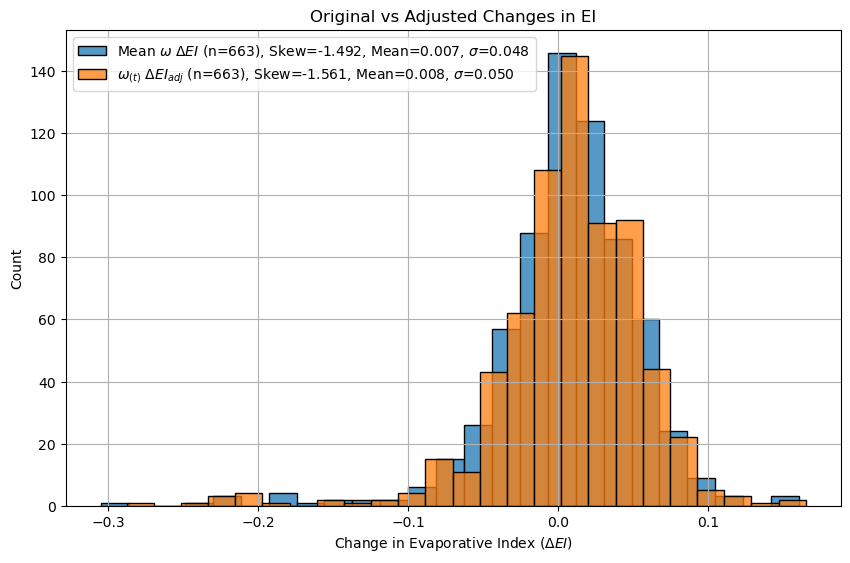

In [418]:
fig4, ax5 = plt.subplots(figsize=(10, 6.18))

# Plot the histograms
sns.histplot(merge_w_EI_adj.adj_EI_change_all, label=f'Mean $\omega$ $\Delta EI$ (n={len(merge_w_EI_adj.adj_EI_change_all)}), Skew={merge_w_EI_adj.adj_EI_change_all.skew():.3f}, Mean={merge_w_EI_adj.adj_EI_change_all.mean():.3f}, $\sigma$={merge_w_EI_adj.adj_EI_change_all.std():.3f}', bins=int(np.sqrt(len(merge_w_EI_adj.adj_EI_change_all))))
sns.histplot(EI_a_ind.adj_EI_change_all, label='$\omega_{(t)}$ $\Delta EI_{adj}$'+f' (n={len(EI_a_ind.adj_EI_change_all)}), Skew={EI_a_ind.adj_EI_change_all.skew():.3f}, Mean={EI_a_ind.adj_EI_change_all.mean():.3f}, $\sigma$={EI_a_ind.adj_EI_change_all.std():.3f}', bins=int(np.sqrt(len(EI_a_ind.adj_EI_change_all))))


ax5.set_xlabel('Change in Evaporative Index ($\Delta EI$)')
ax5.set_ylabel('Count')
ax5.set_title('Original vs Adjusted Changes in EI')
ax5.grid()
ax5.legend(loc='upper left')

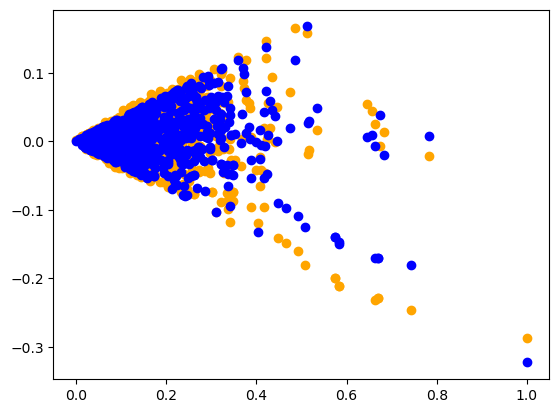

In [419]:
plt.scatter(EI_a_ind.normalized_magnitude_all, EI_a_ind.adj_EI_change_all, c='orange') 

plt.scatter(EI_a_ind.normalized_magnitude_all, EI_a_ind.EI_change, c='blue') 

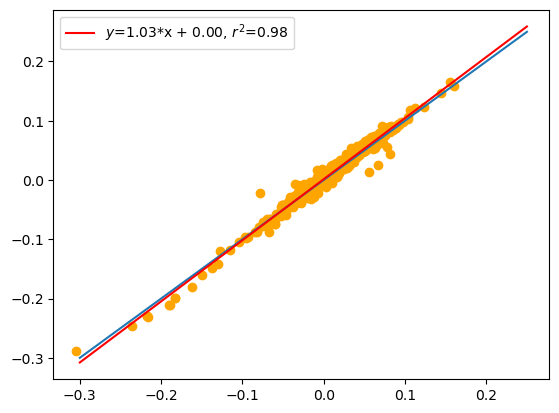

In [439]:
x = merge_w_EI_adj.adj_EI_change_all
y = EI_a_ind.adj_EI_change_all
slope, intercept, r, p, se = linregress(x, y)
plt.scatter(x, y, c='orange') 
plt.plot([-0.3, 0.25], [-0.3, 0.25])
x1 = np.linspace(-0.3, 0.25, 100)
plt.plot(x1, slope*x1+intercept, label = f"$y$={slope:.2f}*x + {intercept:.2f}, $r^2$={r**2:.2f}", c='r')
plt.legend()

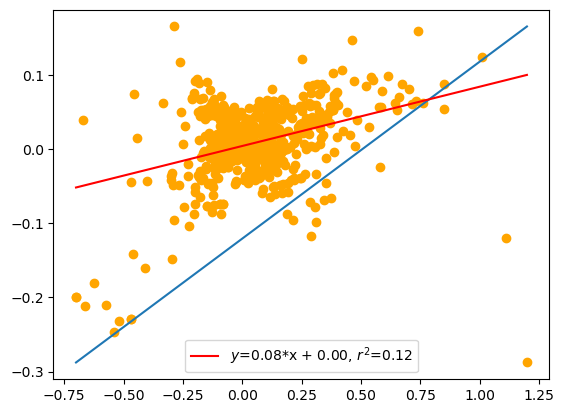

In [445]:
x = merge_w_EI_adj.omega_mean_diff_pct
y = EI_a_ind.adj_EI_change_all
slope, intercept, r, p, se = linregress(x, y)
plt.scatter(x, y, c='orange') 
plt.plot([x.min(), x.max()], [y.min(), y.max()])
x1 = np.linspace(x.min(), x.max(), 100)
plt.plot(x1, slope*x1+intercept, label = f"$y$={slope:.2f}*x + {intercept:.2f}, $r^2$={r**2:.2f}", c='r')
plt.legend()

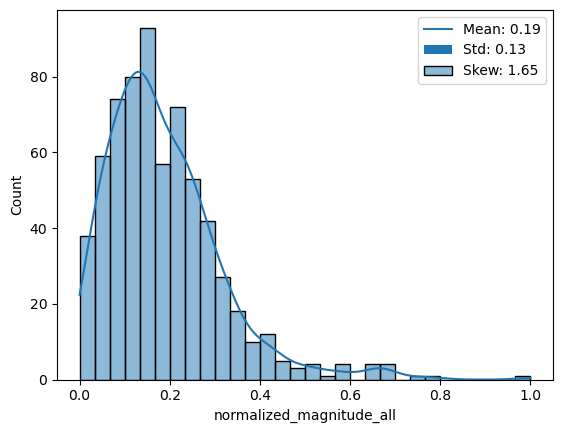

In [407]:
# Plot the histogram
sns.histplot(data=merge_w_EI_adj, x='normalized_magnitude_all', kde=True)

# Calculate mean, standard deviation, and skewness
mean_value = merge_w_EI_adj['normalized_magnitude_all'].mean()
std_value = merge_w_EI_adj['normalized_magnitude_all'].std()
skew_value = merge_w_EI_adj['normalized_magnitude_all'].skew()

# Add legend with mean, standard deviation, and skewness
plt.legend(labels=[f'Mean: {mean_value:.2f}', f'Std: {std_value:.2f}', f'Skew: {skew_value:.2f}'])

# Show the plot
plt.show()

[-0.01       -0.00323116]


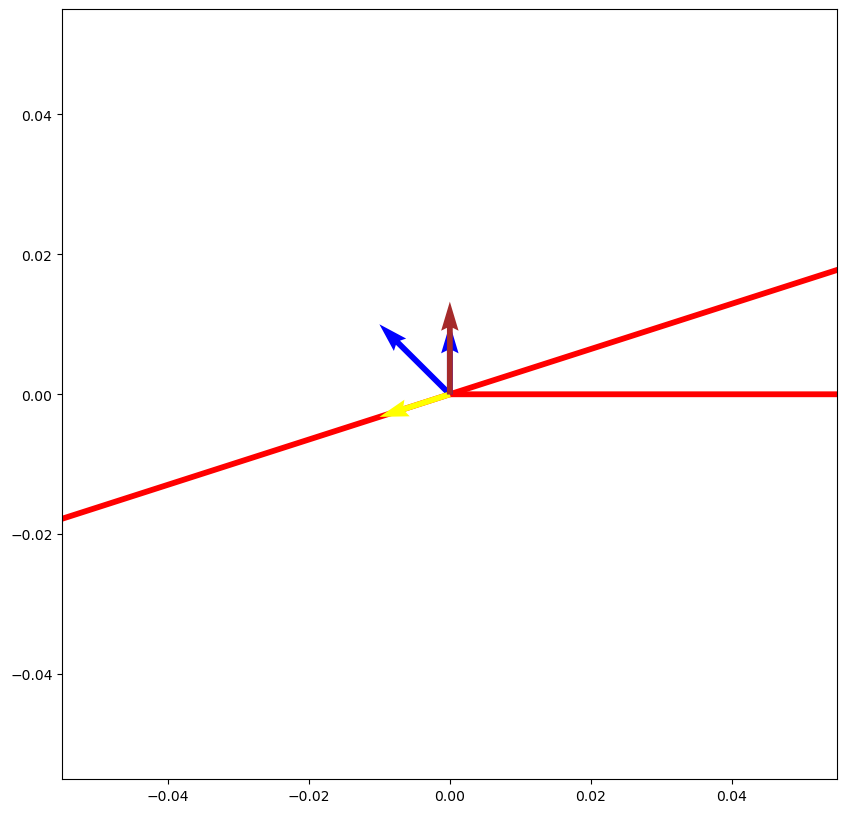

In [355]:
fig= plt.subplots(figsize=(10,10))

dx = -0.01
vector = np.array([dx,np.sin(-dx)])


slope_radians =np.arctan(0.3231161550358926)
expected = np.array([dx,  dx * np.tan(slope_radians)])
print(expected)

vector4 = vector-expected



# Plotting the vector as a quiver plot
plt.quiver(0, 0, np.cos(slope_radians), np.sin(slope_radians), angles='xy', scale_units='xy', scale=1, color='red')
plt.quiver(0, 0, np.cos(0), np.sin(0), angles='xy', scale_units='xy', scale=1, color='red', ls=':')
plt.quiver(0, 0, -np.cos(slope_radians), -np.sin(slope_radians), angles='xy', scale_units='xy', scale=1, color='red')

plt.quiver(0, 0, vector[0], vector[1], angles='xy', scale_units='xy', scale=1, color='blue')
# plt.quiver(0, 0, vector2[0], vector2[1], angles='xy', scale_units='xy', scale=1, color='green')
# plt.quiver(0, 0, vector3[0], vector3[1], angles='xy', scale_units='xy', scale=1, color='pink')
plt.quiver(0, 0, expected[0], expected[1], angles='xy', scale_units='xy', scale=1, color='yellow')
plt.quiver(0, 0, 0, vector[1], angles='xy', scale_units='xy', scale=1, color='blue')
plt.quiver(0, 0, vector4[0], vector4[1], angles='xy', scale_units='xy', scale=1, color='brown')

# Annotating the norm of the vecto
# plt.text(vector[0]/2, vector[1]/2 +1, f"Norm: {norm:.2f}", color='b', ha='center')

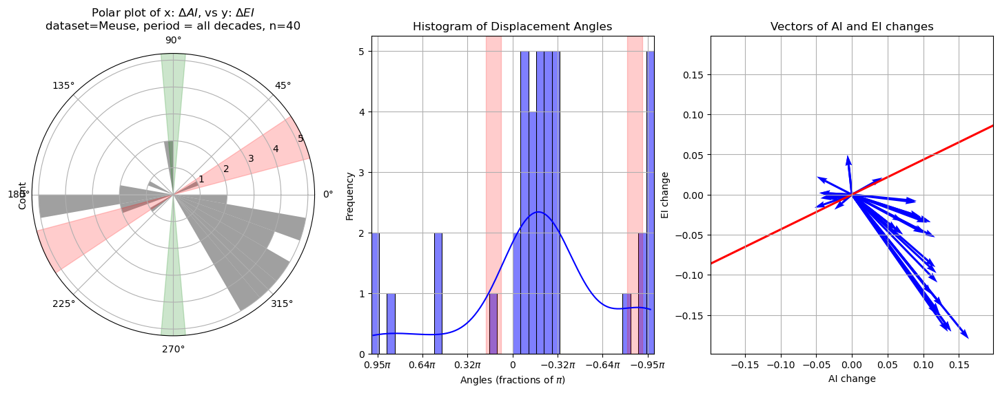

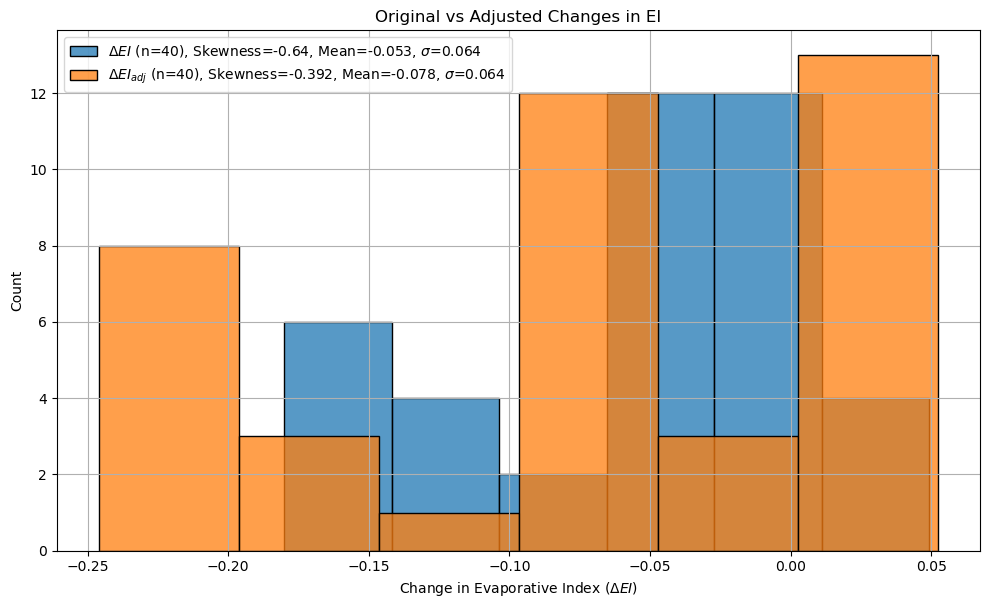

<Figure size 640x480 with 0 Axes>

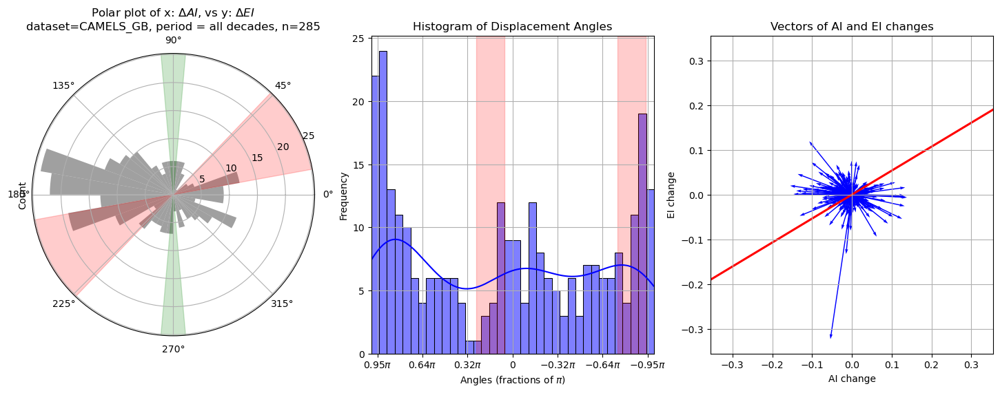

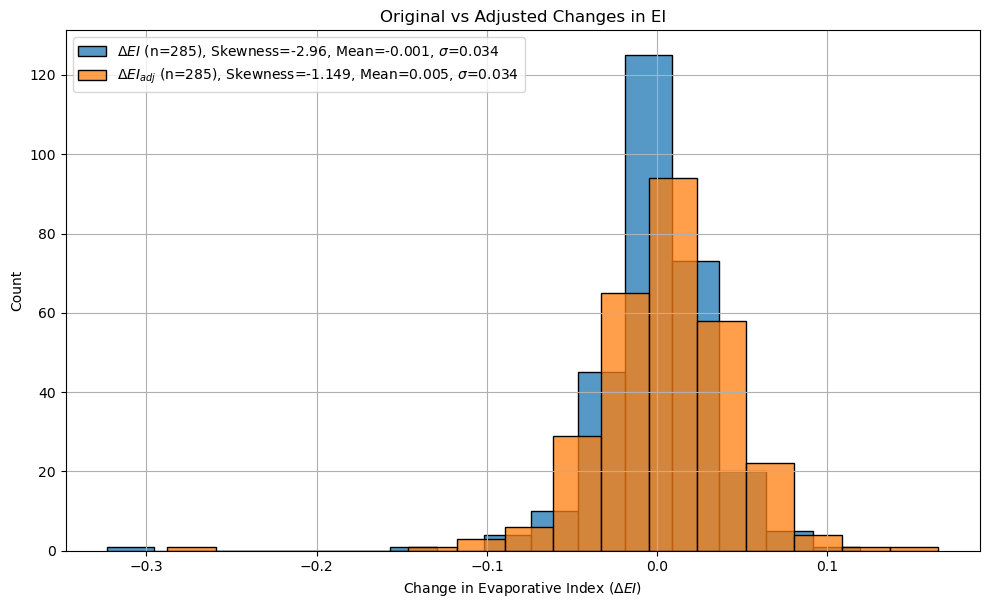

<Figure size 640x480 with 0 Axes>

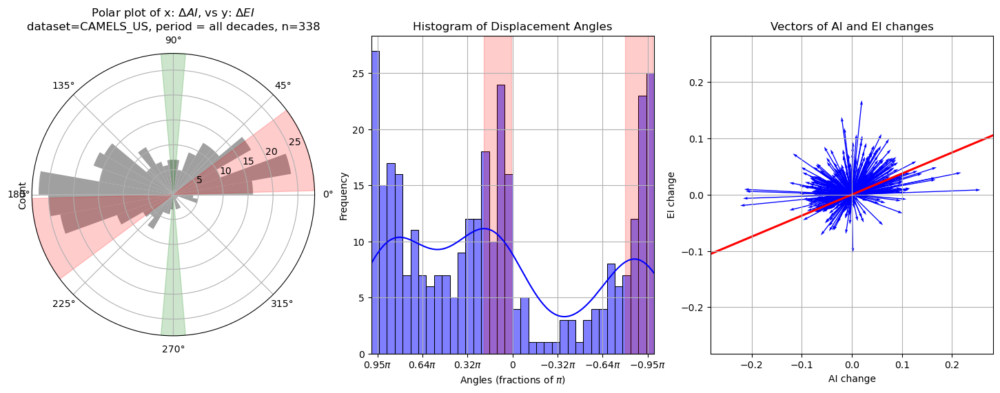

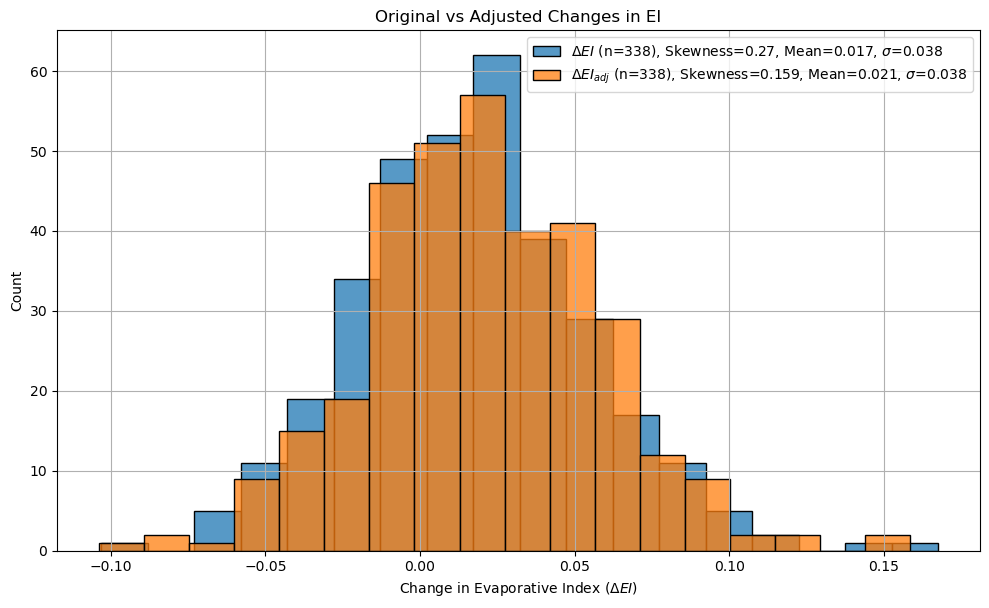

<Figure size 640x480 with 0 Axes>

,index,tot_area_x,h_1,h_2,h_3,h_4,h_5,year_trained,catchment_area,h_6,...,LT_is_dur,LT_Ep,LT_SI,slope,adj_EI_change_all,magnitudes_all,normalized_magnitude_all,adj_EI_change_ds,magnitudes_ds,normalized_magnitude_ds
2213,544,1247.982599,279.124531,351.158787,139.964615,443.133045,32.196991,2013.8,1247.982599,2.404630,...,4.030195,608.195601,0.193971,0.427877,-0.160817,0.162361,0.492948,-0.160817,0.162361,0.631343
2220,166,1471.943902,115.300560,160.737793,294.963540,878.348241,22.380201,2013.8,1471.943902,0.213567,...,3.792808,633.405855,0.186046,0.426845,-0.148354,0.153620,0.466094,-0.148354,0.153620,0.591641
2227,208,302.637555,14.375550,2.288189,83.940341,192.239679,11.100450,2013.8,302.637555,0.066260,...,3.779964,596.728651,0.175837,0.496391,-0.180207,0.167561,0.508925,-0.180207,0.167561,0.654963
2234,292,162.777877,12.344943,26.093338,44.008575,76.886036,3.426106,2013.8,162.777877,0.018879,...,3.746967,596.525896,0.176810,0.393146,-0.061706,0.078924,0.236605,-0.061706,0.078924,0.252363
2241,502,305.818286,29.801659,272.527978,0.787201,3.151946,NaN,2013.8,305.818286,-0.454508,...,4.092896,588.568678,0.186956,0.362805,-0.095501,0.128150,0.387843,-0.095501,0.128150,0.475954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2190,8382,NaN,NaN,188.415121,80.492536,NaN,7.847900,2004.5,276.838680,0.083122,...,9.347027,1160.951475,0.309395,0.136108,-0.008373,0.012065,0.031196,-0.008373,0.012065,0.032321
2197,12190,NaN,5.207067,17.232669,1342.060990,55.865870,169.342946,1994.5,1590.122276,0.412735,...,8.832124,1162.861531,0.281167,0.147046,0.025132,0.217649,0.662809,0.025132,0.217649,0.844920
2198,12200,NaN,5.207067,17.420481,1298.947283,112.726484,155.408227,2004.5,1590.122276,0.412735,...,8.832124,1162.861531,0.281167,0.147360,0.029744,0.029507,0.084781,0.029744,0.029507,0.101262
2205,10534,NaN,3.452183,22.600704,536.475126,44.106043,126.679082,1994.5,733.383019,0.069881,...,8.977964,1157.114916,0.291453,0.164159,0.044639,0.215303,0.655602,0.044639,0.215303,0.835647


In [425]:
country_df = HC_df[['catchment', 'country']]

country_codes = ['Meuse', 'CAMELS_GB', 'CAMELS_US']

df_new = pd.DataFrame()
# Iterate over each country and its catchments
for i, country in enumerate(country_codes):
    
    subset_df = EI_a_ind[EI_a_ind['dataset'] == country]
    
    # Plot the histograms using the three_hist_plot function
    df = hist_plot_i(subset_df, country, 'all decades', True, 'grey', True, '_ds')
    df_new = pd.concat([df_new, df])
    plt.suptitle(f"Histograms for Country: {country}")
    plt.show()

dataset_adj = df_new
display(df_new)

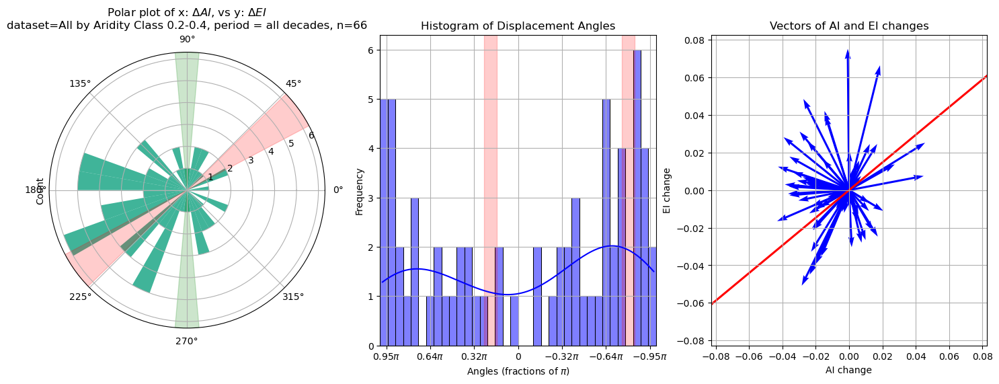

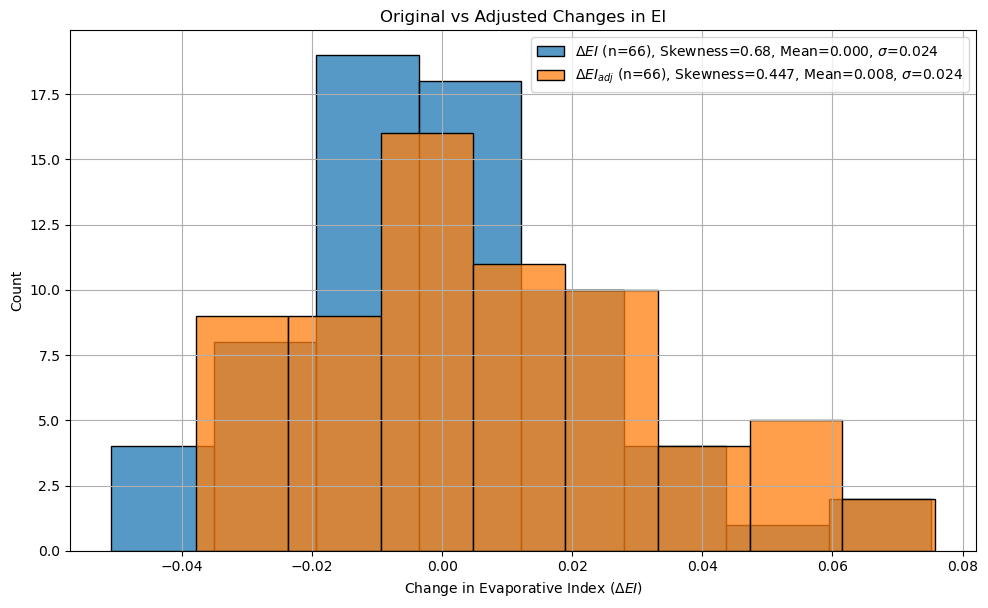

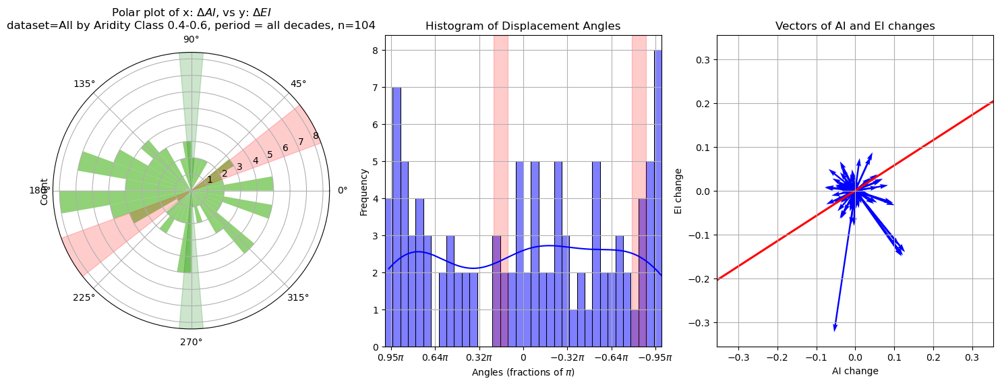

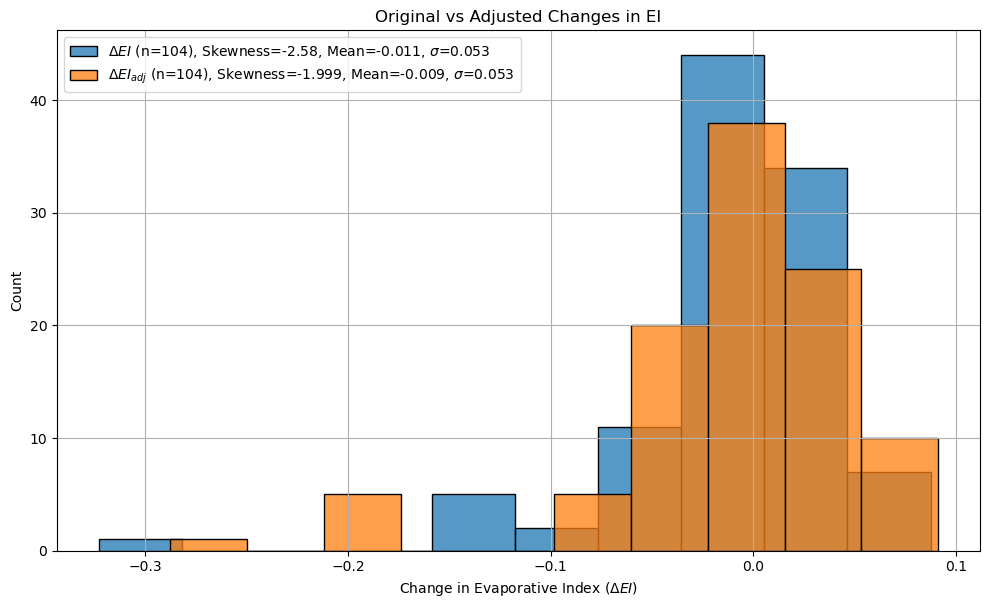

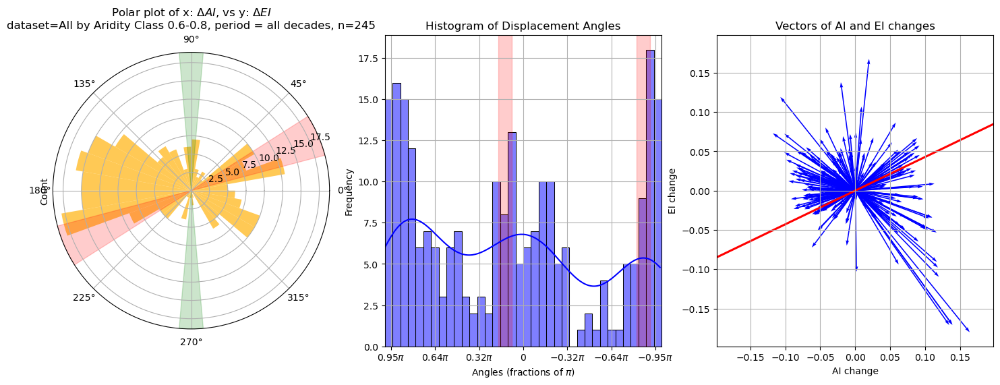

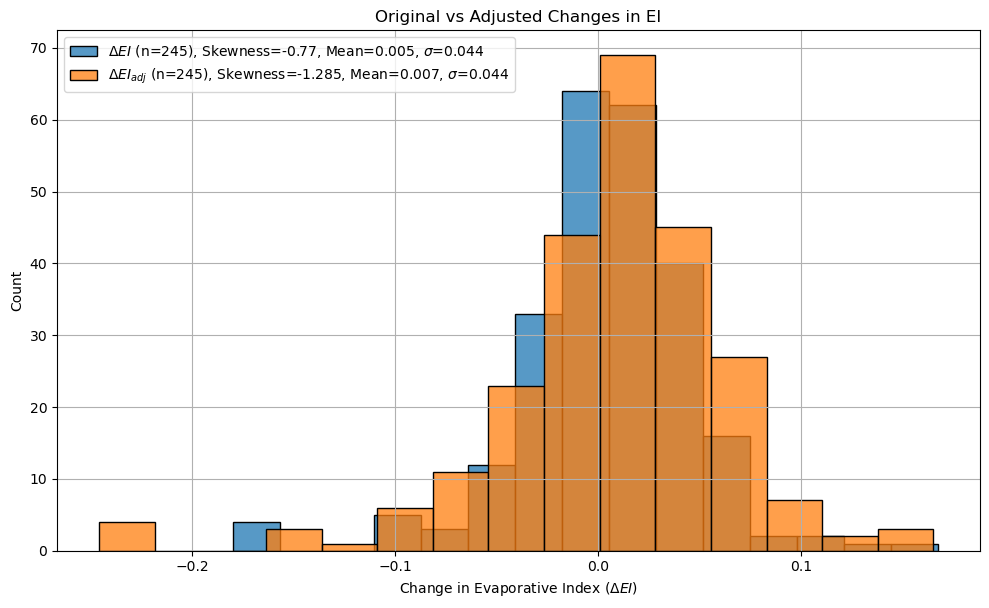

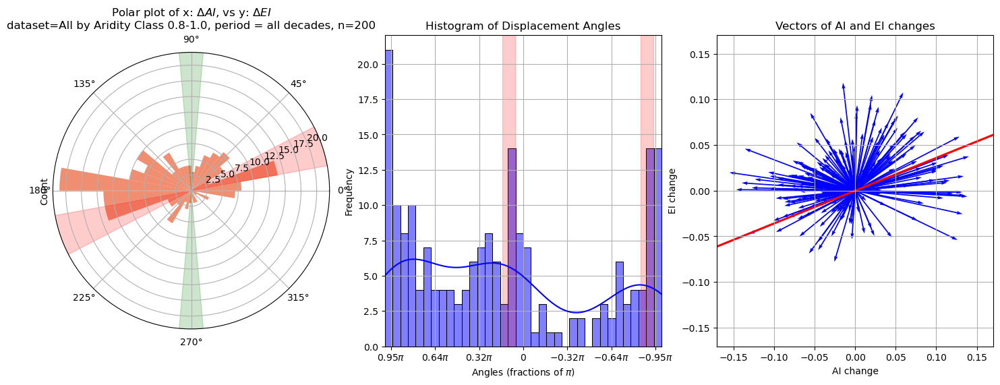

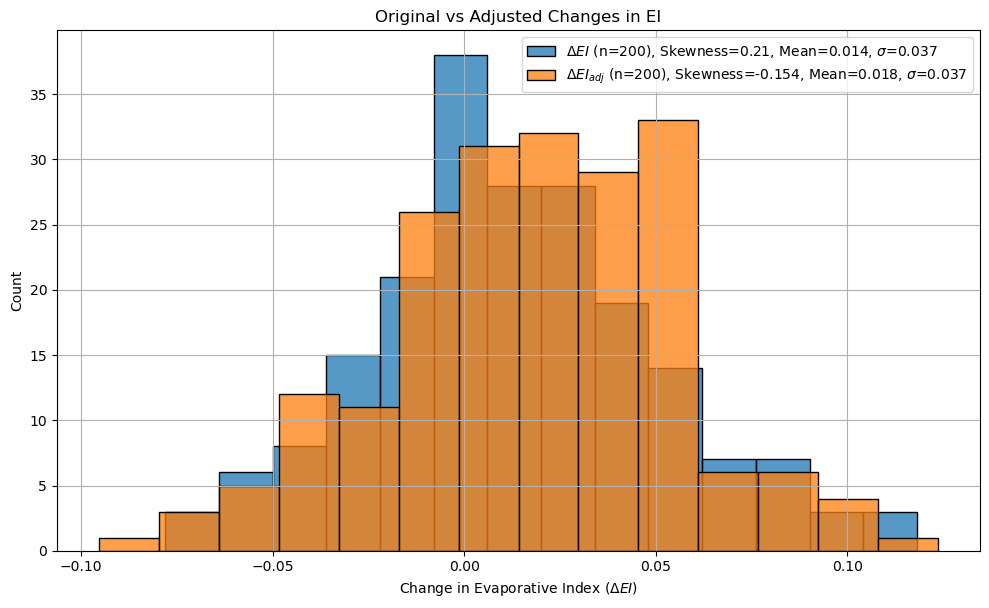

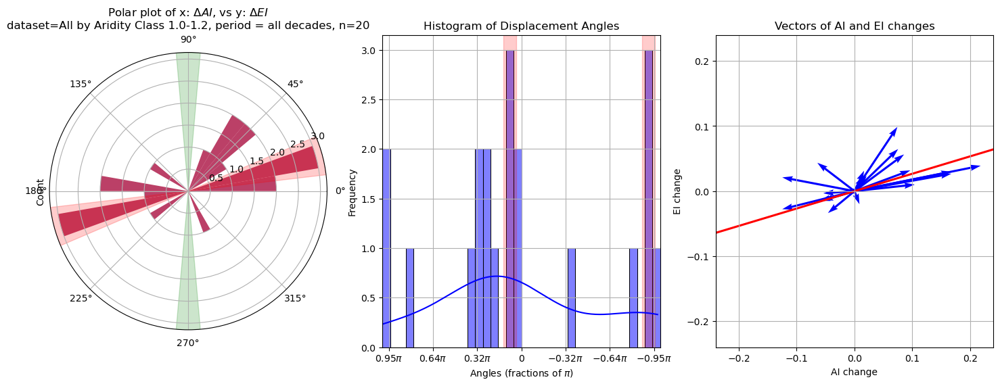

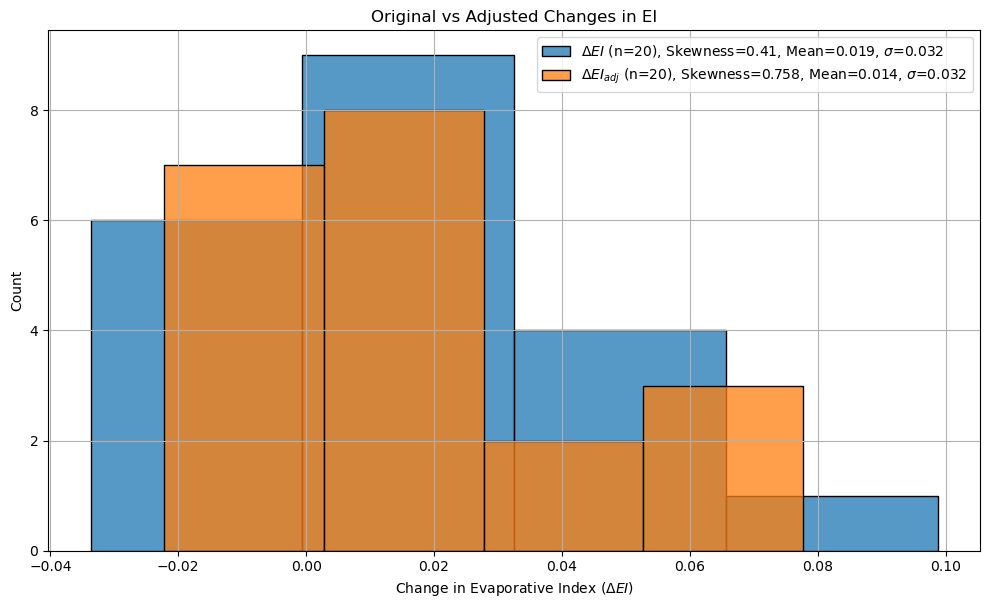

1.2-1.4
1.4-1.6
1.6-1.8
1.8-2.0


In [426]:
dfs = pd.DataFrame()

AI_levels = [0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2]
aridity_table_SR = dataset_adj.sort_values('LT_AI')
aridity_table_SR['AI_group_narrow'] = pd.cut(aridity_table_SR['LT_AI'], AI_levels, labels=labels, ordered=True)
grouped_SR = aridity_table_SR.groupby('AI_group_narrow')


for i, (group, data) in enumerate(grouped_SR):
    if i < 5:
        adj_EI_df = hist_plot_i(data, f'All by Aridity Class {group}', 'all decades', True, colors5[i], True, '_ai')
        dfs = pd.concat([dfs,adj_EI_df])
    else:
        print(group)

# Concatenate all the dataframes in dfs


# Merge with big_merge
adj_add_ai = dfs


In [428]:
suffixes = ['_ai', '_ds', '_all']

new = ['adj_EI_change', 'magnitudes', 'normalized_magnitude']

new_vars = []

for i in new:
    for j in suffixes:
        new_vars.append(i+j)
# print(new_vars)

added_vars = suffixes + ['_change', '_mean_diff', '_diff_pct']
# print(added_vars)
reg = '|'.join([f'{r}$' for r in added_vars])

print(reg)


filtered_df = adj_add_ai.filter(regex=reg)

# print(list(filtered_df.keys()))

# Drop columns containing 'p10' or 'p90'
filtered_df = filtered_df.drop(columns=list(filtered_df.filter(regex='p10|p90').columns.values))


keys_to_drop = ['fscore1','fscore2','fscore3','fscore4','fscore5','c_accuracy1','c_accuracy2','c_accuracy3','c_accuracy4','c_accuracy5', 'accuracy']
df = filtered_df.loc[:, ~filtered_df.columns.str.contains('score')]
df = df.loc[:, ~df.columns.str.contains('accuracy')]
df = df.loc[:, ~df.columns.str.contains('kappa')]
df = df.loc[:, ~df.columns.str.contains('tot')]

print(list(df.keys()))

dep_vars = ['AI_change','EI_change','Ep_change','Pa_change','SI_change','ST_change','Sr_change','T_change','is_dur_change',
           'AI_mean_diff','EI_mean_diff','Ep_mean_diff','Pa_mean_diff','SI_mean_diff','ST_mean_diff','Sr_mean_diff','T_mean_diff','is_dur_mean_diff', 'omega_mean_diff',
            'AI_mean_diff_pct','EI_mean_diff_pct','Ep_mean_diff_pct','Pa_mean_diff_pct','SI_mean_diff_pct','ST_mean_diff_pct','Sr_mean_diff_pct','T_mean_diff_pct','is_dur_mean_diff_pct', 'omega_mean_diff_pct']

top_corr_w_adj = top_corr(df, dep_vars+ ['adj_EI_change_all','magnitudes_all','normalized_magnitude_all','adj_EI_change_ds','magnitudes_ds','normalized_magnitude_ds','adj_EI_change_ai','magnitudes_ai','normalized_magnitude_ai'])

top_corr_w_adj.to_excel('../Outputs/results/ranked_corr_with_adj_EI_grouping_ind.xlsx', index=0)

_ai$|_ds$|_all$|_change$|_mean_diff$|_diff_pct$
['h_1_change', 'h_2_change', 'h_3_change', 'h_4_change', 'h_5_change', 'year_trained_change', 'catchment_area_change', 'h_6_change', 'c_1_change', 'c_2_change', 'c_3_change', 'c_5_change', 'c_6_change', 'r_1_change', 'r_2_change', 'r_3_change', 'r_5_change', 'r_6_change', 'c_4_change', 'r_4_change', 'h__change', 'h_7_change', 'scale_m_x_change', 'EVI_area_change', 'GNDVI_area_change', 'NBR_area_change', 'NDFI_area_change', 'NDMI_area_change', 'NDSI_area_change', 'NDVI_area_change', 'TCA_area_change', 'TCB_area_change', 'TCG_area_change', 'TCW_area_change', 'scale_m_y_change', 'B1_mean_change', 'B1_stdDev_change', 'B2_mean_change', 'B2_stdDev_change', 'B3_mean_change', 'B3_stdDev_change', 'B4_mean_change', 'B4_stdDev_change', 'B5_mean_change', 'B5_stdDev_change', 'B7_mean_change', 'B7_stdDev_change', 'EVI_mean_change', 'EVI_stdDev_change', 'GNDVI_mean_change', 'GNDVI_stdDev_change', 'NBR_mean_change', 'NBR_stdDev_change', 'NDFI_mean_change

,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
50,Potential Evaporation Decadal Mean Change Percent,NDMI Decadal Mean Change,0.512454,0.262609,1.244918e-26,377
51,Potential Evaporation Decadal Mean Change Percent,NBR Decadal Mean Change,0.491877,0.241943,2.308459e-24,377
52,Potential Evaporation Decadal Mean Change Percent,NDFI Decadal Mean Change,0.490854,0.240938,2.965663e-24,377
21,Aridity Index Decadal Mean Change,Classified (Artificial),0.476336,0.226896,1.070058e-11,182
0,Aridity Index Change,Classified (Artificial),0.476336,0.226896,1.070059e-11,182
...,...,...,...,...,...,...
18,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream Classified (Forest) Change,0.300266,0.090159,8.204047e-06,213
49,Evaporative Index Decadal Mean Change Percent,Upstream Classified (Wetlands) Change,0.298626,0.089177,2.046858e-02,60
76,Budyko curve (Fu) parameter Decadal Mean Chang...,Classified (Forest),0.297487,0.088498,1.002988e-05,213
27,Evaporative Index Decadal Mean Change,NDMI Decadal Mean Change,0.290736,0.084527,8.870698e-09,377


Top correlations for Aridity Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
0,Aridity Index Change,Classified (Artificial),0.476336,0.226896,1.070059e-11,182
1,Aridity Index Change,Upstream Classified (Artificial) Normalized Ch...,0.473523,0.224224,1.468065e-11,182
2,Aridity Index Change,NBR Decadal Mean Change,0.380471,0.144758,1.969762e-14,377
3,Aridity Index Change,NDMI Decadal Mean Change,0.379310,0.143876,2.397105e-14,377




Top correlations for Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
4,Evaporative Index Change,Upstream Classified (Artificial) Change,0.311432,0.096990,0.000019,182
5,Evaporative Index Change,Classified (Forest),0.303109,0.091875,0.000007,213




Top correlations for Potential Evaporation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
6,Potential Evaporation Change,Upstream Classified (Agricultural) Change,0.322462,0.103982,0.000001,218
7,Potential Evaporation Change,Classified (Forest),0.303512,0.092120,0.000006,213




Top correlations for Precipitation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
8,Precipitation Change,Classified (Forest),0.397067,0.157662,1.857511e-09,213
9,Precipitation Change,Upstream Classified (Forest) Change,0.379882,0.144310,1.017805e-08,213




Top correlations for Seasonality Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
10,Seasonality Index Change,Classified (Wetlands),0.462653,0.214048,2.248029e-04,59
11,Seasonality Index Change,Upstream Classified (Wetlands) Normalized Change,0.462115,0.213550,2.016201e-04,60
12,Seasonality Index Change,NBR Decadal Mean Change,0.369452,0.136494,1.229661e-13,377
13,Seasonality Index Change,TCG Decadal Mean Change,0.358467,0.128499,7.127704e-13,377
14,Seasonality Index Change,NDVI Decadal Mean Change,0.356254,0.126917,1.007416e-12,377




Top correlations for Seasonality Timing Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
15,"Root-zone Storage Capacity $S_{r,20y}$ Change",Classified (Forest),0.377557,0.142550,1.271585e-08,213
16,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream Classified (Forest) Normalized Change,0.376196,0.141524,1.447497e-08,213
17,"Root-zone Storage Capacity $S_{r,20y}$ Change",Classified (Forest),0.328660,0.108017,9.325687e-07,213
18,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream Classified (Forest) Change,0.300266,0.090159,8.204047e-06,213




Top correlations for Temperature Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
19,Temperature Change,NDVI Decadal Mean Change,0.381670,0.145672,1.607277e-14,377
20,Temperature Change,TCG Decadal Mean Change,0.375043,0.140657,4.897421e-14,377




Top correlations for is dur Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
21,Aridity Index Decadal Mean Change,Classified (Artificial),0.476336,0.226896,1.070058e-11,182
22,Aridity Index Decadal Mean Change,Upstream Classified (Artificial) Normalized Ch...,0.473523,0.224224,1.468065e-11,182
23,Aridity Index Decadal Mean Change,NBR Decadal Mean Change,0.380471,0.144758,1.969762e-14,377
24,Aridity Index Decadal Mean Change,NDMI Decadal Mean Change,0.379310,0.143876,2.397105e-14,377




Top correlations for Evaporative Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
25,Evaporative Index Decadal Mean Change,Classified (Wetlands),0.372058,0.138427,3.712162e-03,59
26,Evaporative Index Decadal Mean Change,Upstream Classified (Wetlands) Change,0.368353,0.135684,3.781956e-03,60
27,Evaporative Index Decadal Mean Change,NDMI Decadal Mean Change,0.290736,0.084527,8.870698e-09,377




Top correlations for Potential Evaporation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
28,Potential Evaporation Decadal Mean Change,Upstream Classified (Agricultural) Change,0.322462,0.103982,0.000001,218
29,Potential Evaporation Decadal Mean Change,Classified (Forest),0.303512,0.092120,0.000006,213




Top correlations for Precipitation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
30,Precipitation Decadal Mean Change,Classified (Forest),0.397067,0.157662,1.857511e-09,213
31,Precipitation Decadal Mean Change,Upstream Classified (Forest) Change,0.379882,0.144310,1.017805e-08,213




Top correlations for Seasonality Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
32,Seasonality Index Decadal Mean Change,Classified (Wetlands),0.462653,0.214048,2.248029e-04,59
33,Seasonality Index Decadal Mean Change,Upstream Classified (Wetlands) Normalized Change,0.462115,0.213550,2.016201e-04,60
34,Seasonality Index Decadal Mean Change,NBR Decadal Mean Change,0.369452,0.136494,1.229662e-13,377
35,Seasonality Index Decadal Mean Change,TCG Decadal Mean Change,0.358467,0.128499,7.127704e-13,377
36,Seasonality Index Decadal Mean Change,NDVI Decadal Mean Change,0.356254,0.126917,1.007416e-12,377




Top correlations for Seasonality Timing Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
37,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",B4 Decadal Mean Change,0.351883,0.123822,1.979425e-12,377
38,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",B4 stdDev Change,0.338120,0.114325,1.552250e-11,377
39,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",TCG stdDev Change,0.332947,0.110853,3.280743e-11,377
40,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Classified (Wetlands),0.328080,0.107636,1.118874e-02,59




Top correlations for Temperature Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
41,Temperature Decadal Mean Change,NDVI Decadal Mean Change,0.381670,0.145672,1.607276e-14,377
42,Temperature Decadal Mean Change,TCG Decadal Mean Change,0.375043,0.140657,4.897421e-14,377




Top correlations for is dur Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
43,Budyko curve (Fu) parameter Decadal Mean Change,Classified (Forest),0.307115,0.094320,0.000005,213
44,Budyko curve (Fu) parameter Decadal Mean Change,Upstream Classified (Forest) Normalized Change,0.305886,0.093566,0.000005,213
45,Budyko curve (Fu) parameter Decadal Mean Change,Classified (Forest),0.274411,0.075301,0.000049,213




Top correlations for Aridity Index Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
46,Aridity Index Decadal Mean Change Percent,Classified (Artificial),0.426955,0.182291,1.849649e-09,182
47,Aridity Index Decadal Mean Change Percent,Upstream Classified (Artificial) Normalized Ch...,0.424027,0.179799,2.448352e-09,182




Top correlations for Evaporative Index Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
48,Evaporative Index Decadal Mean Change Percent,Classified (Wetlands),0.300721,0.090433,0.020650,59
49,Evaporative Index Decadal Mean Change Percent,Upstream Classified (Wetlands) Change,0.298626,0.089177,0.020469,60




Top correlations for Potential Evaporation Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
50,Potential Evaporation Decadal Mean Change Percent,NDMI Decadal Mean Change,0.512454,0.262609,1.244918e-26,377
51,Potential Evaporation Decadal Mean Change Percent,NBR Decadal Mean Change,0.491877,0.241943,2.308459e-24,377
52,Potential Evaporation Decadal Mean Change Percent,NDFI Decadal Mean Change,0.490854,0.240938,2.965663e-24,377
53,Potential Evaporation Decadal Mean Change Percent,TCG Decadal Mean Change,0.467130,0.218211,7.861103e-22,377
54,Potential Evaporation Decadal Mean Change Percent,NDVI Decadal Mean Change,0.465788,0.216958,1.064286e-21,377
55,Potential Evaporation Decadal Mean Change Percent,NDFI stdDev Change,0.463693,0.215011,1.703101e-21,377
56,Potential Evaporation Decadal Mean Change Percent,TCA Decadal Mean Change,0.459605,0.211237,4.221926e-21,377
57,Potential Evaporation Decadal Mean Change Percent,B4 Decadal Mean Change,0.445447,0.198423,8.933301e-20,377




Top correlations for Precipitation Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
58,Precipitation Decadal Mean Change Percent,Classified (Artificial),0.408874,0.167178,1.001466e-08,182
59,Precipitation Decadal Mean Change Percent,Upstream Classified (Artificial) Normalized Ch...,0.405415,0.164362,1.367929e-08,182




Top correlations for Seasonality Index Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
60,Seasonality Index Decadal Mean Change Percent,NBR Decadal Mean Change,0.437589,0.191484,4.575658e-19,377
61,Seasonality Index Decadal Mean Change Percent,NDMI Decadal Mean Change,0.428674,0.183761,2.774866e-18,377
62,Seasonality Index Decadal Mean Change Percent,TCG Decadal Mean Change,0.415426,0.172579,3.668703e-17,377
63,Seasonality Index Decadal Mean Change Percent,Classified (Wetlands),0.412071,0.169803,1.183420e-03,59
64,Seasonality Index Decadal Mean Change Percent,Upstream Classified (Wetlands) Normalized Change,0.411581,0.169399,1.086410e-03,60
65,Seasonality Index Decadal Mean Change Percent,NDVI Decadal Mean Change,0.405526,0.164451,2.347755e-16,377




Top correlations for Seasonality Timing Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
66,Seasonality Timing Decadal Mean Change Percent,Classified (Wetlands),0.323972,0.104958,0.012310,59
67,Seasonality Timing Decadal Mean Change Percent,Upstream Classified (Wetlands) Change,0.303511,0.092119,0.018402,60




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
68,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",B4 Decadal Mean Change,0.383066,0.146740,1.266765e-14,377
69,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",NDMI Decadal Mean Change,0.350522,0.122866,2.437483e-12,377
70,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Classified (Wetlands),0.339316,0.115136,8.561803e-03,59
71,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Upstream Classified (Wetlands) Change,0.338049,0.114277,8.249194e-03,60




Top correlations for Temperature Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
72,Temperature Decadal Mean Change Percent,Classified (Masked (cloud)),0.381836,0.145799,2.941611e-09,226
73,Temperature Decadal Mean Change Percent,Upstream Classified (Masked (cloud)) Normalize...,0.381391,0.145459,3.078964e-09,226




Top correlations for is dur Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change Percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
74,Budyko curve (Fu) parameter Decadal Mean Chang...,Classified (Forest),0.351070,0.123250,1.424936e-07,213
75,Budyko curve (Fu) parameter Decadal Mean Chang...,Upstream Classified (Forest) Normalized Change,0.349409,0.122087,1.646243e-07,213
76,Budyko curve (Fu) parameter Decadal Mean Chang...,Classified (Forest),0.297487,0.088498,1.002988e-05,213




Top correlations for adjusted Evaporative Index Change All Datasets:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
77,adjusted Evaporative Index Change All Datasets,Classified (Forest),0.353837,0.125201,1.118376e-07,213
78,adjusted Evaporative Index Change All Datasets,Classified (Artificial),0.352561,0.124300,1.054447e-06,182




Top correlations for magnitudes All Datasets:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
79,magnitudes All Datasets,Classified (Forest),0.391023,0.152899,3.416471e-09,213
80,magnitudes All Datasets,Upstream Classified (Forest) Change,0.370466,0.137245,2.481175e-08,213




Top correlations for Normalized magnitude All Datasets:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
81,Normalized magnitude All Datasets,Classified (Forest),0.391023,0.152899,3.416471e-09,213
82,Normalized magnitude All Datasets,Upstream Classified (Forest) Change,0.370466,0.137245,2.481175e-08,213




Top correlations for adjusted Evaporative Index Change Datasets Grouping:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
83,adjusted Evaporative Index Change Datasets Gro...,Classified (Forest),0.353837,0.125201,1.118376e-07,213
84,adjusted Evaporative Index Change Datasets Gro...,Classified (Artificial),0.352561,0.124300,1.054447e-06,182




Top correlations for magnitudes Datasets Grouping:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
85,magnitudes Datasets Grouping,Classified (Forest),0.391023,0.152899,3.416471e-09,213
86,magnitudes Datasets Grouping,Upstream Classified (Forest) Change,0.370466,0.137245,2.481175e-08,213




Top correlations for Normalized magnitude Datasets Grouping:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
87,Normalized magnitude Datasets Grouping,Classified (Forest),0.411455,0.169295,4.141072e-10,213
88,Normalized magnitude Datasets Grouping,Upstream Classified (Forest) Change,0.395838,0.156688,2.104599e-09,213




Top correlations for adjusted Evaporative Index Change Aridity Grouping:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
89,adjusted Evaporative Index Change Aridity Grou...,Classified (Forest),0.353837,0.125201,1.118376e-07,213
90,adjusted Evaporative Index Change Aridity Grou...,Classified (Artificial),0.352561,0.124300,1.054447e-06,182




Top correlations for magnitudes Aridity Grouping:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
91,magnitudes Aridity Grouping,Classified (Forest),0.391023,0.152899,3.416471e-09,213
92,magnitudes Aridity Grouping,Upstream Classified (Forest) Change,0.370466,0.137245,2.481175e-08,213




Top correlations for Normalized magnitude Aridity Grouping:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n


<Axes: >

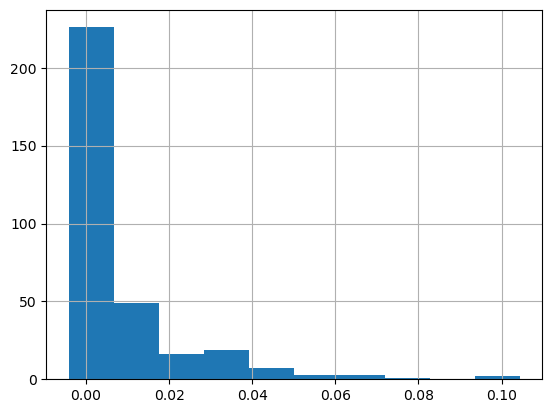

In [446]:
MEA = adj_add_ai
MEA.ups_h_1_normalized_change.hist()

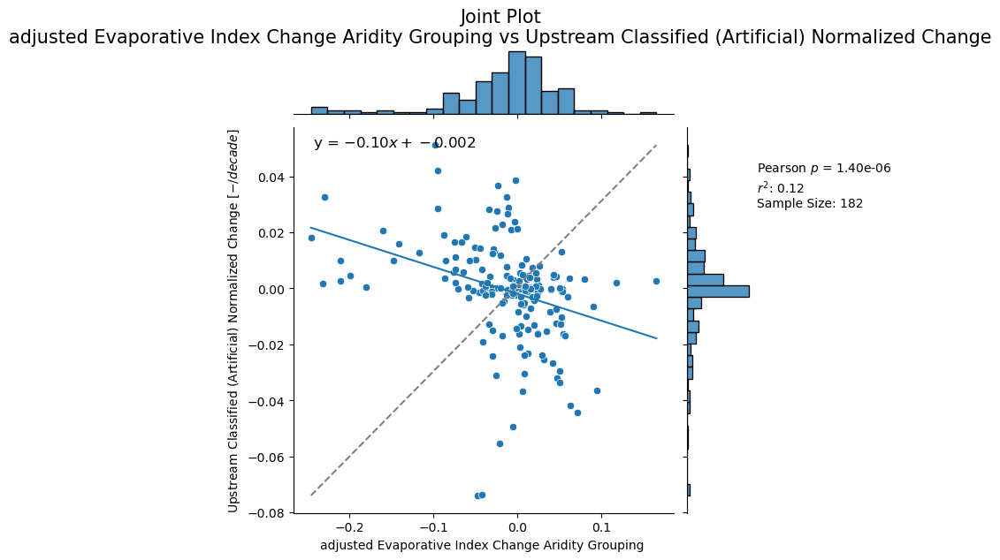

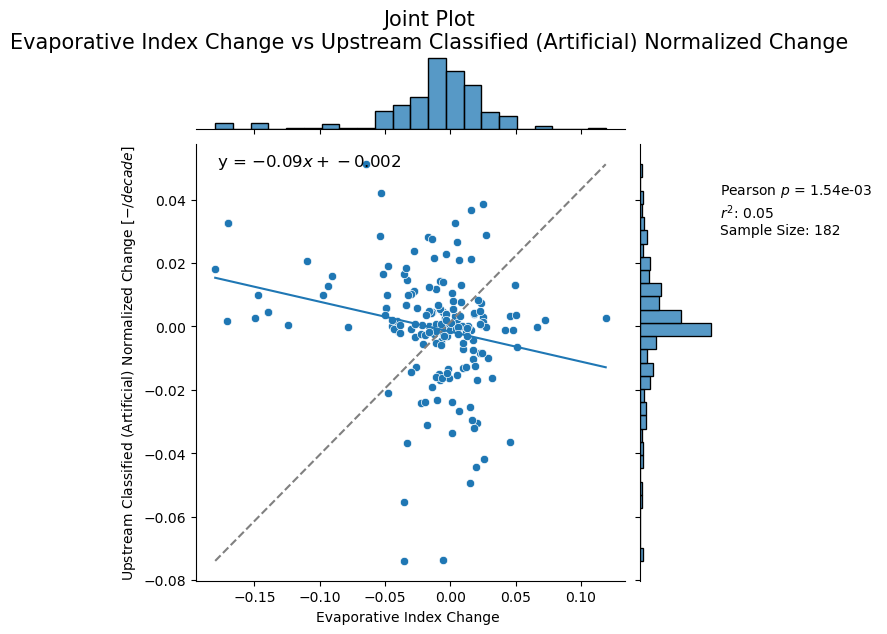

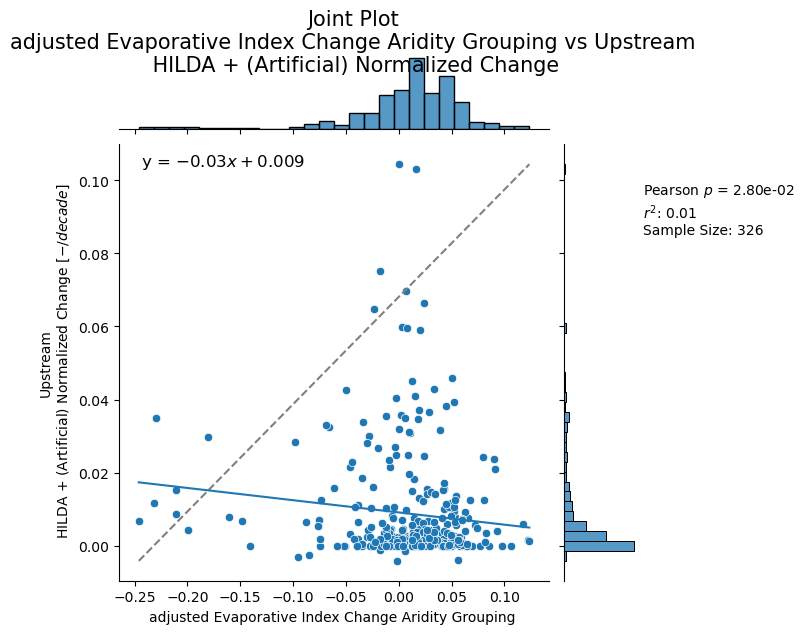

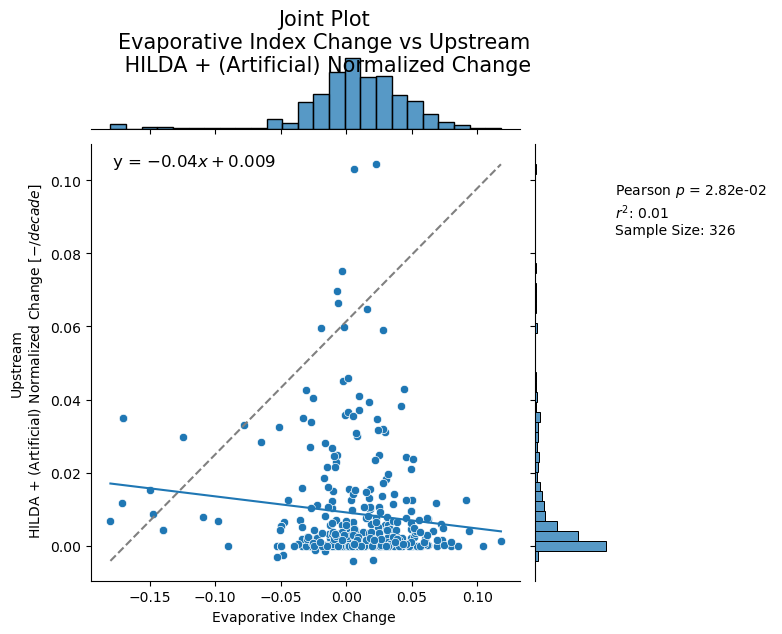

In [449]:
scatter_vars2(MEA,'adj_EI_change_ai','ups_r_1_normalized_change',)
scatter_vars2(MEA,'EI_change','ups_r_1_normalized_change',)
scatter_vars2(MEA,'adj_EI_change_ai','ups_h_1_normalized_change',)
scatter_vars2(MEA,'EI_change','ups_h_1_normalized_change',)

0 0.2-0.4 66
1 0.4-0.6 104
2 0.6-0.8 245
3 0.8-1.0 200
4 1.0-1.2 20


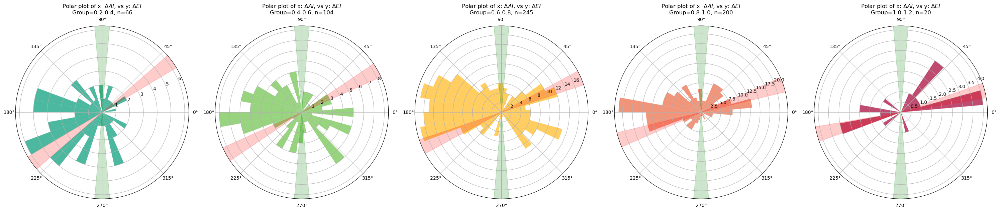

In [461]:
aridity_table_SR = MEA.sort_values('LT_AI', ascending=False)  # Sort in descending order
aridity_table_SR['AI_group_narrow'] = pd.cut(aridity_table_SR['LT_AI'], AI_levels, labels=labels, ordered=True)
grouped_SR = aridity_table_SR.groupby('AI_group_narrow')
fig, ax = plt.subplots(1, 5, figsize=(30, 7.5), subplot_kw={'projection': 'polar'})

for i, (group, df) in enumerate(grouped_SR):
    if i < 5:
        df = df.dropna(subset=['EI_change', 'AI_change'])
        # Calculate angles and wrap around if necessary
        angles = np.arctan2(df['EI_change'], df['AI_change'])
        angles = np.where(angles > np.pi, angles - 2*np.pi, angles)
        # display(df)
        # break
        color = colors5[i]

        # Calculate the magnitudes of changes
        magnitudes = np.sqrt(df['AI_change']**2 + df['EI_change']**2)

        # Remove nan values from angles and magnitudes simultaneously
        valid_indices = ~np.isnan(angles) & ~np.isnan(magnitudes)
        angles = angles[valid_indices]
        magnitudes = magnitudes[valid_indices]

        # Normalize the magnitudes to a specific range for weighting
        min_weight = 0.1  # Minimum weight
        max_weight = 1.0  # Maximum weight
        normalized_magnitudes = (magnitudes - magnitudes.min()) / (magnitudes.max() - magnitudes.min())
        weights = min_weight + (max_weight - min_weight) * normalized_magnitudes

        x0 = df.AI_mean.min()
        x1 = df.AI_mean.max()

        x = np.linspace(x0, x1, 100)
        y = w_function(x, w)
        slope, intercept, r, p, se = linregress(x, y)
        slope_radians = np.arctan(slope)
        bin_width = 2 * np.pi / 36  # Assuming 36 bins
        print(i, group, len(df))
        # Plot the polar plot in the corresponding subplot
        ax[i].hist(angles, bins=np.linspace(-np.pi, np.pi, num=36), color=color, alpha=0.7)
        ax[i].set_title(f"Polar plot of x: $\Delta AI$, vs y: $\Delta EI$\nGroup={group}, n={len(df.AI_change.dropna())}")

        # Rotate the red and green spans by 90 degrees (or π/2 radians)
        ax[i].axvspan(slope_radians - bin_width/2, slope_radians + bin_width/2, alpha=0.2, color='red')
        ax[i].axvspan(slope_radians - bin_width/2 + np.pi, slope_radians + bin_width/2 + np.pi, alpha=0.2, color='red')
        ax[i].axvspan(-np.pi/2 - bin_width/2, -np.pi/2 + bin_width/2, alpha=0.2, color='green')
        ax[i].axvspan(-np.pi/2 - bin_width/2 + np.pi, -np.pi/2 + bin_width/2 + np.pi, alpha=0.2, color='green')

plt.tight_layout()
plt.show()


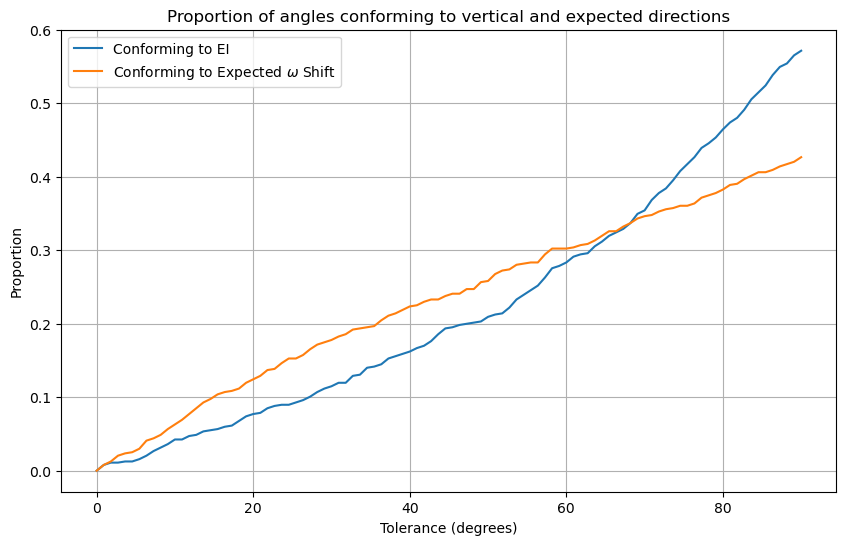

Mean Average Error: 0.0482992125984252


In [469]:
import matplotlib.pyplot as plt
import numpy as np

# Define a range of tolerances in degrees, then convert to radians
tolerances_deg = np.linspace(0, 90, 100)
tolerances_rad = np.radians(tolerances_deg)

# Initialize lists to store proportions
vertical_proportions = []
expected_proportions = []
slope_rad = []
df = MEA

for tolerance in tolerances_rad:
    # Initialize counters
    vertical_count = 0
    expected_count = 0

    for group, df in grouped_SR:
        dx = df.AI_change
        dy = df.EI_change
        ref = df.omega_mean.mean()

        x = np.linspace(df.AI_mean.min(), df.AI_mean.max())
        y_cur = w_function(x, ref)

        slope, intercept, r, p, se = linregress(x, y_cur)

        slope_radians = np.arctan(slope)  # Compute slope in radians
        
        theta = np.arctan2(dy, dx)  # Compute the angle

        # Count how many angles fall within each quadrant bisected by the vertical and expected directions
        vertical_count += np.sum(np.abs(theta - np.pi/2) <= tolerance)  # Bisects all quadrants around the vertical direction
        expected_count += np.sum(np.abs(theta - slope_radians) <= tolerance)  # Bisects all quadrants around the expected direction
    
    
    # Calculate proportions and store them
    total_vectors = sum([len(df) for group, df in grouped_SR])
    vertical_proportions.append(vertical_count / total_vectors)
    expected_proportions.append(expected_count / total_vectors)

# Plot proportions as functions of tolerance
plt.figure(figsize=(10, 6))
plt.plot(tolerances_deg, vertical_proportions, label='Conforming to EI')
plt.plot(tolerances_deg, expected_proportions, label='Conforming to Expected $\omega$ Shift')
plt.xlabel('Tolerance (degrees)')
plt.ylabel('Proportion')
plt.legend()
plt.title('Proportion of angles conforming to vertical and expected directions')
plt.grid(True)
plt.show()

# Calculate mean average error
mean_average_error = np.mean(np.abs(np.array(expected_proportions) - np.array(vertical_proportions)))

# Print mean average error
print(f"Mean Average Error: {mean_average_error}")

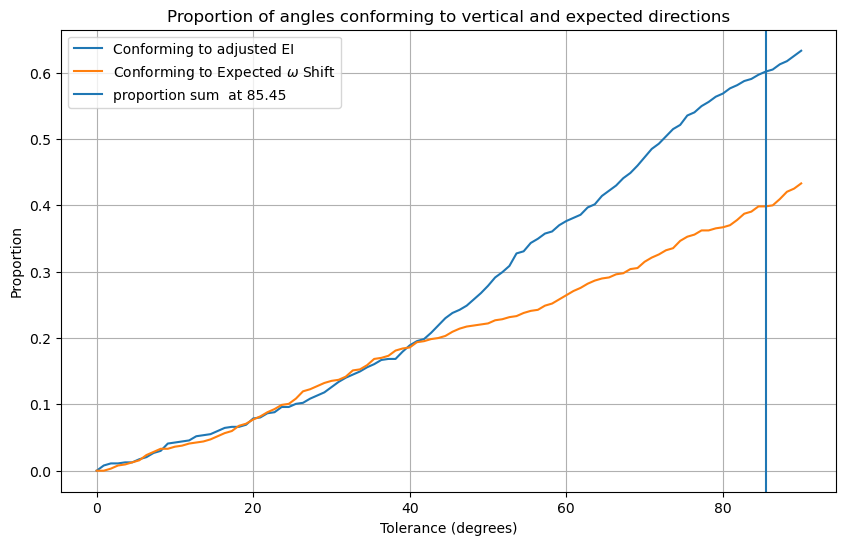

Mean Average Error: 0.07258267716535433


In [485]:
# # Initialize lists to store proportions
vertical_proportions = []
expected_proportions = []
slope_rad = []
tolerance_fin = []

for i, tolerance in tolerances_rad:
    # Initialize counters
    vertical_count = 0
    expected_count = 0

    for group, df in grouped_SR:
        df = df.dropna(subset=['EI_change', 'AI_change'])

        dx = df.AI_change
        dy = df.adj_EI_change_all

        def estimate_y(AI_mean):
            x = np.linspace(AI_mean * 0.97, AI_mean * 1.03, 100)
            y = w_function(x, w)
            slope, intercept, r, p, se = linregress(x, y)
            return slope

        df['slope'] = df['AI_mean'].map(estimate_y)

        slope_radians = np.arctan(df.slope)

        theta = np.arctan2(dy, dx)  # Compute the angle

        # Count how many angles fall within each quadrant bisected by the vertical and expected directions
        vertical_count += np.sum(np.abs(theta - np.pi/2) <= tolerance)  # Bisects all quadrants around the vertical direction
        expected_count += np.sum(np.abs(theta - slope_radians) <= tolerance)  # Bisects all quadrants around the expected direction

    # Calculate proportions and store them
    total_vectors = sum([len(df) for group, df in grouped_SR])
    vertical_proportions.append(vertical_count / total_vectors)
    expected_proportions.append(expected_count / total_vectors)
    combined_proportion = vertical_proportions[-1] + expected_proportions[-1]
    combined_proportions.append(combined_proportion)
    if combined_proportion >= 1:
        tolerance_fin.append(np.degrees(tolerance))
        

# Plot proportions as functions of tolerance
plt.figure(figsize=(10, 6))
plt.plot(tolerances_deg, vertical_proportions, label='Conforming to adjusted EI')
plt.plot(tolerances_deg, expected_proportions, label='Conforming to Expected $\omega$ Shift')
plt.axvline(tolerance_fin[0], label=f'proportion sum  at {tolerance_fin[0]:.2f}')

plt.xlabel('Tolerance (degrees)')
plt.ylabel('Proportion')
plt.legend()
plt.title('Proportion of angles conforming to vertical and expected directions')
plt.grid(True)
plt.show()

# Calculate mean average error
mean_average_error = np.mean(np.abs(np.array(expected_proportions) - np.array(vertical_proportions)))

# Print mean average error
print(f"Mean Average Error: {mean_average_error}")
# This modified code will iterate over each group in grouped_SR and calculate the angles' conformity with the expected slope in radians. The estimate_y function is used to estimate the slope for each AI_mean value, and the resulting slopes are converted to radians. The angles are compared with both the vertical direction (np.pi/2) and the expected slope, and the counts are accumulated. The proportions are then calculated based on the total number of vectors across all groups. Finally, the proportions are plotted against the tolerance values.

C:\Users\creeb\AppData\Local\Temp\ipykernel_36224\1788271769.py:35: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2, i] = plt.subplot(3, 5, i+11, polar=True) # Create a new subplot in polar coordinates
C:\Users\creeb\AppData\Local\Temp\ipykernel_36224\1788271769.py:35: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2, i] = plt.subplot(3, 5, i+11, polar=True) # Create a new subplot in polar coordinates
C:\Users\creeb\AppData\Local\Temp\ipykernel_36224\1788271769.py:35: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2, i] = plt.subplot(3, 5, i+11, polar=True) # Create a new subplot in polar coordinates
C

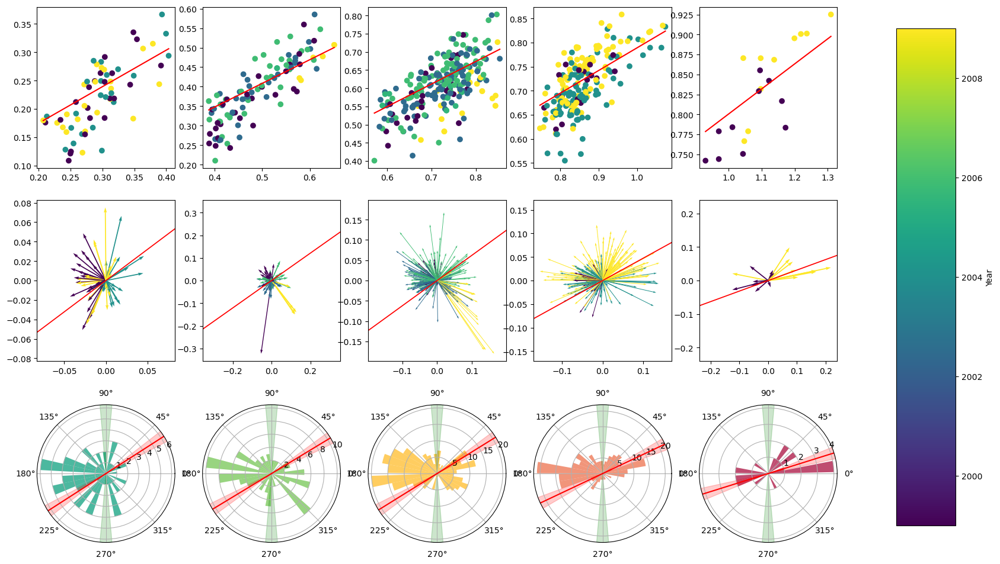

In [366]:
import matplotlib.colors as mcolors

fig, ax = plt.subplots(3, 5, figsize=(20, 12)) # create a 3 row 5 column subplot grid

for i, (group, df) in enumerate(grouped_SR):
    if i < 5:
        # Convert df.dec_end to datetime and extract year
        df['year'] = pd.to_datetime(df['dec_end']).dt.year
        cmap = plt.get_cmap('viridis')
        norm = mcolors.Normalize(vmin=df['year'].min(), vmax=df['year'].max())

        dx = df.AI_change
        dy = df.EI_change
        ref = df.omega_mean.mean()

        x = np.linspace(df.AI_mean.min(), df.AI_mean.max())
        y_cur = w_function(x, ref)

        slope, intercept, r, p, se = linregress(x, y_cur)
        y_lin = slope * x + intercept
        slope_radians = np.arctan(slope)

        ax[0, i].plot(x, y_lin, c='red')
        scatter = ax[0, i].scatter(df.AI_mean, df.EI_mean, c=df['year'], cmap=cmap, norm=norm)

        ax[1, i].quiver(np.zeros(len(df.AI_change)), np.zeros(len(df.AI_change)), dx, dy, angles='xy', scale_units='xy', scale=1, color=cmap(norm(df['year'])))
        ax[1, i].quiver(0, 0, np.cos(slope_radians), np.sin(slope_radians), angles='xy', scale_units='xy', scale=1, color='red')
        ax[1, i].quiver(0, 0, -np.cos(slope_radians), -np.sin(slope_radians), angles='xy', scale_units='xy', scale=1, color='red')

        max_abs = max(np.max(np.abs(dx))*1.1, np.max(np.abs(dy))*1.1)
        ax[1, i].set_xlim(-max_abs, max_abs)
        ax[1, i].set_ylim(-max_abs, max_abs)

        # Create polar histogram for the angle distribution
        ax[2, i] = plt.subplot(3, 5, i+11, polar=True) # Create a new subplot in polar coordinates
        theta = np.arctan2(dy, dx) # Compute the angle
        bins_number = 36 # You can adjust this value according to your data

        half_bin = np.pi/36
        ax[2, i].hist(theta, bins=bins_number, color=colors5[i], alpha=0.7) # Create a histogram

        ax[2, i].axvline(x=slope_radians, color='red')
        ax[2, i].axvline(x=slope_radians + np.pi, color='red')  # Add pi to the angle to get the negative direction

        ax[2, i].axvspan(slope_radians - half_bin, slope_radians + half_bin, color='red', alpha=0.2)
        ax[2, i].axvspan(slope_radians - half_bin + np.pi, slope_radians + half_bin + np.pi, color='red', alpha=0.2)  # Add pi to the angle to get the negative direction
        ax[2, i].axvspan(0+np.pi/2 + half_bin, 0+np.pi/2 - half_bin, color='green', alpha=0.2)
        ax[2, i].axvspan(np.pi+np.pi/2 - half_bin, np.pi+np.pi/2 + half_bin, color='green', alpha=0.2)  # Add pi to the angle to get the negative direction

    else:
        break

# Add a colorbar
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
fig.colorbar(scatter, cax=cbar_ax, label='Year')
# plt.tight_layout()

plt.show()

In [277]:
for i, (group, df) in enumerate(grouped_SR):
    filtered_df = df.filter(regex='_change$|_mean_diff$|_diff_pct$')

    # Drop columns containing 'p10' or 'p90'
    filtered_df = filtered_df.drop(columns=list(filtered_df.filter(regex='p10|p90').columns.values) +['tot_area_change'])

    keys_to_drop = ['fscore1','fscore2','fscore3','fscore4','fscore5','c_accuracy1','c_accuracy2','c_accuracy3','c_accuracy4','c_accuracy5', 'accuracy', 'year_trained']
    df = filtered_df.loc[:, ~filtered_df.columns.str.contains('score')]
    df = df.loc[:, ~df.columns.str.contains('accuracy')]
    df = df.loc[:, ~df.columns.str.contains('kappa')]
    df = df.loc[:, ~df.columns.str.contains('tot')]

    top_corr_w_adj = top_corr(df, dep_vars+[new_var])

    top_corr_w_adj.to_excel(f'../Outputs/results/ranked_corr_with_adj_EI_{group}.xlsx', index=0)

,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
98,Temperature Decadal Mean Change,year trained Change,0.728539,0.530769,4.106255e-12,66
41,Temperature Change,year trained Change,0.728539,0.530769,4.106255e-12,66
82,Seasonality Timing Decadal Mean Change,GNDVI stdDev Change,0.724250,0.524539,2.746089e-08,44
27,Seasonality Timing Change,GNDVI stdDev Change,0.724250,0.524539,2.746089e-08,44
149,Seasonality Timing Decadal Mean Change percent,GNDVI stdDev Change,0.720919,0.519724,3.407590e-08,44
...,...,...,...,...,...,...
117,Budyko curve (Fu) parameter Decadal Mean Change,NDMI Area\n Normalized Change,0.230860,0.053296,1.316268e-01,44
118,Budyko curve (Fu) parameter Decadal Mean Change,NDFI Area\n Normalized Change,0.228922,0.052405,1.349905e-01,44
119,Budyko curve (Fu) parameter Decadal Mean Change,NBR Area\n Normalized Change,0.227698,0.051847,1.371457e-01,44
120,Budyko curve (Fu) parameter Decadal Mean Change,TCG Area\n Normalized Change,0.227132,0.051589,1.381528e-01,44


Top correlations for Aridity Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
0,Aridity Index Change,year trained Change,0.536000,0.287296,0.000004,66
1,Aridity Index Change,EVI stdDev Change,0.490030,0.240129,0.000734,44
2,Aridity Index Change,NDSI stdDev Change,0.478699,0.229152,0.001012,44
3,Aridity Index Change,Upstream TCB Area\n Normalized Change,0.452113,0.204406,0.002063,44
4,Aridity Index Change,Upstream NBR Area\n Normalized Change,0.450552,0.202997,0.002147,44
5,Aridity Index Change,Upstream NDFI Area\n Normalized Change,0.433569,0.187982,0.003281,44




Top correlations for Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
6,Evaporative Index Change,NDFI Area\n Normalized Change,0.307186,0.094363,0.042528,44
7,Evaporative Index Change,NBR Area\n Normalized Change,0.306013,0.093644,0.043365,44
8,Evaporative Index Change,TCB Area\n Normalized Change,0.305015,0.093034,0.044088,44
9,Evaporative Index Change,EVI Area\n Normalized Change,0.304153,0.092509,0.044720,44




Top correlations for Potential Evaporation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
10,Potential Evaporation Change,NDFI Decadal Mean Change,0.622165,0.387089,0.000007,44
11,Potential Evaporation Change,NBR Decadal Mean Change,0.549113,0.301525,0.000113,44
12,Potential Evaporation Change,GNDVI stdDev Change,0.530760,0.281707,0.000210,44
13,Potential Evaporation Change,NDMI Decadal Mean Change,0.526202,0.276889,0.000244,44
14,Potential Evaporation Change,NDVI stdDev Change,0.521465,0.271926,0.000284,44
15,Potential Evaporation Change,NDFI stdDev Change,0.496209,0.246223,0.000614,44
16,Potential Evaporation Change,TCA stdDev Change,0.491383,0.241457,0.000706,44
17,Potential Evaporation Change,NDSI stdDev Change,0.484643,0.234878,0.000857,44
18,Potential Evaporation Change,B3 stdDev Change,0.480683,0.231056,0.000958,44
19,Potential Evaporation Change,B1 stdDev Change,0.474322,0.224981,0.001143,44




Top correlations for Precipitation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
20,Precipitation Change,year trained Change,0.557529,0.310838,0.000001,66
21,Precipitation Change,NDSI stdDev Change,0.487229,0.237392,0.000796,44
22,Precipitation Change,TCB Area\n Normalized Change,0.457321,0.209143,0.001803,44
23,Precipitation Change,NBR Area\n Normalized Change,0.456764,0.208633,0.001829,44
24,Precipitation Change,NDFI Area\n Normalized Change,0.445265,0.198261,0.002456,44
25,Precipitation Change,Upstream TCB Area\n Normalized Change,0.444702,0.197759,0.002491,44




Top correlations for Seasonality Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
26,Seasonality Index Change,year trained Change,0.575332,0.331006,4.348154e-07,66




Top correlations for Seasonality Timing Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
27,Seasonality Timing Change,GNDVI stdDev Change,0.724250,0.524539,2.746089e-08,44
28,Seasonality Timing Change,B1 stdDev Change,0.704209,0.495910,9.619725e-08,44
29,Seasonality Timing Change,NDVI stdDev Change,0.701230,0.491724,1.148893e-07,44
30,Seasonality Timing Change,B2 stdDev Change,0.689846,0.475887,2.221298e-07,44
31,Seasonality Timing Change,TCB stdDev Change,0.678592,0.460487,4.142446e-07,44
32,Seasonality Timing Change,TCA stdDev Change,0.676364,0.457469,4.671296e-07,44
33,Seasonality Timing Change,B3 stdDev Change,0.674683,0.455198,5.111152e-07,44
34,Seasonality Timing Change,NDFI Decadal Mean Change,0.660744,0.436583,1.054807e-06,44
35,Seasonality Timing Change,NDSI stdDev Change,0.626633,0.392669,5.351757e-06,44
36,Seasonality Timing Change,NBR Decadal Mean Change,0.612955,0.375714,9.732528e-06,44




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
37,"Root-zone Storage Capacity $S_{r,20y}$ Change",NBR Area\n Normalized Change,0.320662,0.102824,0.033821,44
38,"Root-zone Storage Capacity $S_{r,20y}$ Change",NDFI Area\n Normalized Change,0.320267,0.102571,0.034054,44
39,"Root-zone Storage Capacity $S_{r,20y}$ Change",TCB Area\n Normalized Change,0.319088,0.101817,0.034756,44
40,"Root-zone Storage Capacity $S_{r,20y}$ Change",EVI Area\n Normalized Change,0.312658,0.097755,0.038795,44




Top correlations for Temperature Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
41,Temperature Change,year trained Change,0.728539,0.530769,4.106255e-12,66
42,Temperature Change,GNDVI stdDev Change,0.701686,0.492363,1.118279e-07,44
43,Temperature Change,NDVI stdDev Change,0.666619,0.444381,7.808492e-07,44
44,Temperature Change,B1 stdDev Change,0.661415,0.437470,1.019530e-06,44
45,Temperature Change,B2 stdDev Change,0.651946,0.425034,1.634975e-06,44
46,Temperature Change,TCB stdDev Change,0.646776,0.418320,2.101490e-06,44
47,Temperature Change,B3 stdDev Change,0.643738,0.414398,2.430274e-06,44
48,Temperature Change,TCA stdDev Change,0.627170,0.393343,5.224362e-06,44
49,Temperature Change,NBR Decadal Mean Change,0.626026,0.391909,5.498945e-06,44
50,Temperature Change,NDFI Decadal Mean Change,0.604643,0.365593,1.381023e-05,44




Top correlations for is dur Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
51,is dur Change,NDMI Area\n Normalized Change,0.591224,0.349546,0.000024,44
52,is dur Change,Upstream NDMI Area\n Normalized Change,0.582326,0.339103,0.000034,44
53,is dur Change,EVI Area\n Normalized Change,0.518122,0.268451,0.000315,44
54,is dur Change,GNDVI Area\n Normalized Change,0.513121,0.263293,0.000368,44
55,is dur Change,TCG Area\n Normalized Change,0.511220,0.261346,0.000391,44
56,is dur Change,TCA Area\n Normalized Change,0.510585,0.260697,0.000398,44




Top correlations for Aridity Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
57,Aridity Index Decadal Mean Change,year trained Change,0.536000,0.287296,0.000004,66
58,Aridity Index Decadal Mean Change,EVI stdDev Change,0.490030,0.240129,0.000734,44
59,Aridity Index Decadal Mean Change,NDSI stdDev Change,0.478699,0.229152,0.001012,44
60,Aridity Index Decadal Mean Change,Upstream TCB Area\n Normalized Change,0.452113,0.204406,0.002063,44
61,Aridity Index Decadal Mean Change,Upstream NBR Area\n Normalized Change,0.450552,0.202997,0.002147,44
62,Aridity Index Decadal Mean Change,Upstream NDFI Area\n Normalized Change,0.433569,0.187982,0.003281,44




Top correlations for Evaporative Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
63,Evaporative Index Decadal Mean Change,TCW Decadal Mean Change,0.299883,0.089930,0.047961,44
64,Evaporative Index Decadal Mean Change,B5 Decadal Mean Change,0.247152,0.061084,0.105786,44




Top correlations for Potential Evaporation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
65,Potential Evaporation Decadal Mean Change,NDFI Decadal Mean Change,0.622165,0.387089,0.000007,44
66,Potential Evaporation Decadal Mean Change,NBR Decadal Mean Change,0.549113,0.301525,0.000113,44
67,Potential Evaporation Decadal Mean Change,GNDVI stdDev Change,0.530760,0.281707,0.000210,44
68,Potential Evaporation Decadal Mean Change,NDMI Decadal Mean Change,0.526202,0.276889,0.000244,44
69,Potential Evaporation Decadal Mean Change,NDVI stdDev Change,0.521465,0.271926,0.000284,44
70,Potential Evaporation Decadal Mean Change,NDFI stdDev Change,0.496209,0.246223,0.000614,44
71,Potential Evaporation Decadal Mean Change,TCA stdDev Change,0.491383,0.241457,0.000706,44
72,Potential Evaporation Decadal Mean Change,NDSI stdDev Change,0.484643,0.234878,0.000857,44
73,Potential Evaporation Decadal Mean Change,B3 stdDev Change,0.480683,0.231056,0.000958,44
74,Potential Evaporation Decadal Mean Change,B1 stdDev Change,0.474322,0.224981,0.001143,44




Top correlations for Precipitation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
75,Precipitation Decadal Mean Change,year trained Change,0.557529,0.310838,0.000001,66
76,Precipitation Decadal Mean Change,NDSI stdDev Change,0.487229,0.237392,0.000796,44
77,Precipitation Decadal Mean Change,TCB Area\n Normalized Change,0.457321,0.209143,0.001803,44
78,Precipitation Decadal Mean Change,NBR Area\n Normalized Change,0.456764,0.208633,0.001829,44
79,Precipitation Decadal Mean Change,NDFI Area\n Normalized Change,0.445265,0.198261,0.002456,44
80,Precipitation Decadal Mean Change,Upstream TCB Area\n Normalized Change,0.444702,0.197759,0.002491,44




Top correlations for Seasonality Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
81,Seasonality Index Decadal Mean Change,year trained Change,0.575332,0.331006,4.348154e-07,66




Top correlations for Seasonality Timing Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
82,Seasonality Timing Decadal Mean Change,GNDVI stdDev Change,0.724250,0.524539,2.746089e-08,44
83,Seasonality Timing Decadal Mean Change,B1 stdDev Change,0.704209,0.495910,9.619725e-08,44
84,Seasonality Timing Decadal Mean Change,NDVI stdDev Change,0.701230,0.491724,1.148893e-07,44
85,Seasonality Timing Decadal Mean Change,B2 stdDev Change,0.689846,0.475887,2.221297e-07,44
86,Seasonality Timing Decadal Mean Change,TCB stdDev Change,0.678592,0.460487,4.142445e-07,44
87,Seasonality Timing Decadal Mean Change,TCA stdDev Change,0.676364,0.457469,4.671296e-07,44
88,Seasonality Timing Decadal Mean Change,B3 stdDev Change,0.674683,0.455198,5.111152e-07,44
89,Seasonality Timing Decadal Mean Change,NDFI Decadal Mean Change,0.660744,0.436583,1.054807e-06,44
90,Seasonality Timing Decadal Mean Change,NDSI stdDev Change,0.626633,0.392669,5.351757e-06,44
91,Seasonality Timing Decadal Mean Change,NBR Decadal Mean Change,0.612955,0.375714,9.732527e-06,44




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
92,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",EVI stdDev Change,0.396115,0.156907,0.007774,44
94,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Classified (Masked (cloud)),0.391148,0.152996,0.008655,44
93,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Upstream Classified (Masked (cloud)) Normalize...,0.391148,0.152996,0.008655,44
95,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Upstream TCB Area\n Normalized Change,0.382343,0.146187,0.010428,44
96,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",TCW Area\n Normalized Change,0.381786,0.145760,0.010550,44
97,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Upstream NBR Area\n Normalized Change,0.380968,0.145137,0.010731,44




Top correlations for Temperature Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
98,Temperature Decadal Mean Change,year trained Change,0.728539,0.530769,4.106255e-12,66
99,Temperature Decadal Mean Change,GNDVI stdDev Change,0.701686,0.492363,1.118279e-07,44
100,Temperature Decadal Mean Change,NDVI stdDev Change,0.666619,0.444381,7.808492e-07,44
101,Temperature Decadal Mean Change,B1 stdDev Change,0.661415,0.437470,1.019530e-06,44
102,Temperature Decadal Mean Change,B2 stdDev Change,0.651946,0.425034,1.634975e-06,44
103,Temperature Decadal Mean Change,TCB stdDev Change,0.646776,0.418320,2.101490e-06,44
104,Temperature Decadal Mean Change,B3 stdDev Change,0.643738,0.414398,2.430274e-06,44
105,Temperature Decadal Mean Change,TCA stdDev Change,0.627170,0.393343,5.224362e-06,44
106,Temperature Decadal Mean Change,NBR Decadal Mean Change,0.626026,0.391909,5.498945e-06,44
107,Temperature Decadal Mean Change,NDFI Decadal Mean Change,0.604643,0.365593,1.381023e-05,44




Top correlations for is dur Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
108,is dur Decadal Mean Change,NDMI Area\n Normalized Change,0.591224,0.349546,0.000024,44
109,is dur Decadal Mean Change,Upstream NDMI Area\n Normalized Change,0.582326,0.339103,0.000034,44
110,is dur Decadal Mean Change,EVI Area\n Normalized Change,0.518122,0.268451,0.000315,44
111,is dur Decadal Mean Change,GNDVI Area\n Normalized Change,0.513121,0.263293,0.000368,44
112,is dur Decadal Mean Change,TCG Area\n Normalized Change,0.511220,0.261346,0.000391,44
113,is dur Decadal Mean Change,TCA Area\n Normalized Change,0.510585,0.260697,0.000398,44




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
114,Budyko curve (Fu) parameter Decadal Mean Change,Classified (Agricultural),0.240091,0.057644,0.158412,36
115,Budyko curve (Fu) parameter Decadal Mean Change,Upstream Classified (Agricultural) Normalized ...,0.240091,0.057644,0.158412,36
116,Budyko curve (Fu) parameter Decadal Mean Change,EVI Area\n Normalized Change,0.231635,0.053655,0.130300,44
117,Budyko curve (Fu) parameter Decadal Mean Change,NDMI Area\n Normalized Change,0.230860,0.053296,0.131627,44
118,Budyko curve (Fu) parameter Decadal Mean Change,NDFI Area\n Normalized Change,0.228922,0.052405,0.134990,44
119,Budyko curve (Fu) parameter Decadal Mean Change,NBR Area\n Normalized Change,0.227698,0.051847,0.137146,44
120,Budyko curve (Fu) parameter Decadal Mean Change,TCG Area\n Normalized Change,0.227132,0.051589,0.138153,44
121,Budyko curve (Fu) parameter Decadal Mean Change,TCB Area\n Normalized Change,0.226264,0.051196,0.139705,44




Top correlations for Aridity Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
122,Aridity Index Decadal Mean Change percent,year trained Change,0.529532,0.280404,0.000005,66
123,Aridity Index Decadal Mean Change percent,NDSI stdDev Change,0.513224,0.263399,0.000367,44
124,Aridity Index Decadal Mean Change percent,EVI stdDev Change,0.477785,0.228279,0.001039,44
125,Aridity Index Decadal Mean Change percent,Upstream TCB Area\n Normalized Change,0.453397,0.205569,0.001996,44
126,Aridity Index Decadal Mean Change percent,Upstream NBR Area\n Normalized Change,0.452309,0.204583,0.002053,44
127,Aridity Index Decadal Mean Change percent,Upstream NDFI Area\n Normalized Change,0.436488,0.190522,0.003055,44




Top correlations for Evaporative Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
128,Evaporative Index Decadal Mean Change percent,TCW Decadal Mean Change,0.304695,0.092839,0.044322,44
129,Evaporative Index Decadal Mean Change percent,B4 Decadal Mean Change,0.254557,0.064799,0.095410,44
130,Evaporative Index Decadal Mean Change percent,B5 Decadal Mean Change,0.248387,0.061696,0.103997,44
131,Evaporative Index Decadal Mean Change percent,Upstream NDSI Area\n Normalized Change,0.237904,0.056598,0.168762,35




Top correlations for Potential Evaporation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
132,Potential Evaporation Decadal Mean Change percent,NDFI Decadal Mean Change,0.638063,0.407125,0.000003,44
133,Potential Evaporation Decadal Mean Change percent,NBR Decadal Mean Change,0.564096,0.318205,0.000067,44
134,Potential Evaporation Decadal Mean Change percent,GNDVI stdDev Change,0.561964,0.315803,0.000072,44
135,Potential Evaporation Decadal Mean Change percent,NDVI stdDev Change,0.547941,0.300240,0.000118,44
136,Potential Evaporation Decadal Mean Change percent,NDMI Decadal Mean Change,0.541162,0.292857,0.000149,44
137,Potential Evaporation Decadal Mean Change percent,B1 stdDev Change,0.532762,0.283835,0.000197,44
138,Potential Evaporation Decadal Mean Change percent,NDFI stdDev Change,0.523534,0.274088,0.000266,44
139,Potential Evaporation Decadal Mean Change percent,TCA stdDev Change,0.519836,0.270230,0.000299,44
140,Potential Evaporation Decadal Mean Change percent,B2 stdDev Change,0.519434,0.269812,0.000303,44
141,Potential Evaporation Decadal Mean Change percent,B3 stdDev Change,0.519115,0.269480,0.000306,44




Top correlations for Precipitation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
142,Precipitation Decadal Mean Change percent,year trained Change,0.593407,0.352132,1.513522e-07,66
143,Precipitation Decadal Mean Change percent,Upstream TCB Area\n Normalized Change,0.485133,0.235354,8.448504e-04,44
144,Precipitation Decadal Mean Change percent,Upstream NBR Area\n Normalized Change,0.484422,0.234664,8.620833e-04,44
145,Precipitation Decadal Mean Change percent,TCB Area\n Normalized Change,0.473611,0.224307,1.165400e-03,44
146,Precipitation Decadal Mean Change percent,NBR Area\n Normalized Change,0.472732,0.223476,1.193810e-03,44
147,Precipitation Decadal Mean Change percent,Upstream NDFI Area\n Normalized Change,0.471080,0.221916,1.248866e-03,44




Top correlations for Seasonality Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
148,Seasonality Index Decadal Mean Change percent,year trained Change,0.579216,0.335491,3.484433e-07,66




Top correlations for Seasonality Timing Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
149,Seasonality Timing Decadal Mean Change percent,GNDVI stdDev Change,0.720919,0.519724,3.407590e-08,44
150,Seasonality Timing Decadal Mean Change percent,NDVI stdDev Change,0.708753,0.502330,7.306311e-08,44
151,Seasonality Timing Decadal Mean Change percent,NDFI Decadal Mean Change,0.700967,0.491355,1.166936e-07,44
152,Seasonality Timing Decadal Mean Change percent,B1 stdDev Change,0.698377,0.487731,1.359141e-07,44
153,Seasonality Timing Decadal Mean Change percent,B2 stdDev Change,0.697217,0.486111,1.454520e-07,44
154,Seasonality Timing Decadal Mean Change percent,B3 stdDev Change,0.684673,0.468777,2.968224e-07,44
155,Seasonality Timing Decadal Mean Change percent,TCA stdDev Change,0.676618,0.457812,4.607931e-07,44
156,Seasonality Timing Decadal Mean Change percent,TCB stdDev Change,0.675726,0.456606,4.833927e-07,44
157,Seasonality Timing Decadal Mean Change percent,NBR Decadal Mean Change,0.668963,0.447511,6.912860e-07,44
158,Seasonality Timing Decadal Mean Change percent,NDMI Decadal Mean Change,0.620591,0.385134,6.994193e-06,44




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
159,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",TCW Area\n Normalized Change,0.493883,0.243921,0.000657,44
160,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Upstream NDSI Area\n Normalized Change,0.472914,0.223647,0.004118,35
161,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Upstream TCW Area\n Normalized Change,0.425129,0.180735,0.005592,41
162,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",TCG Decadal Mean Change,0.422912,0.178855,0.004235,44
163,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",NDSI Area\n Normalized Change,0.409801,0.167937,0.005735,44
164,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Upstream Classified (Forest) Normalized Change,0.368034,0.135449,0.013974,44




Top correlations for Temperature Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
165,Temperature Decadal Mean Change percent,year trained Change,0.698180,0.487455,7.210166e-11,66
166,Temperature Decadal Mean Change percent,B1 stdDev Change,0.691716,0.478471,1.997413e-07,44
167,Temperature Decadal Mean Change percent,GNDVI stdDev Change,0.677617,0.459165,4.366648e-07,44
168,Temperature Decadal Mean Change percent,B2 stdDev Change,0.675252,0.455966,4.958148e-07,44
169,Temperature Decadal Mean Change percent,TCB stdDev Change,0.663390,0.440087,9.219421e-07,44
170,Temperature Decadal Mean Change percent,B3 stdDev Change,0.646886,0.418461,2.090462e-06,44
171,Temperature Decadal Mean Change percent,NBR Decadal Mean Change,0.640366,0.410069,2.850301e-06,44
172,Temperature Decadal Mean Change percent,NDVI stdDev Change,0.638854,0.408134,3.059746e-06,44
173,Temperature Decadal Mean Change percent,NDFI Decadal Mean Change,0.624704,0.390256,5.832631e-06,44
174,Temperature Decadal Mean Change percent,B4 stdDev Change,0.608548,0.370330,1.173123e-05,44




Top correlations for is dur Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
175,is dur Decadal Mean Change percent,NDMI Area\n Normalized Change,0.579811,0.336181,0.000037,44
176,is dur Decadal Mean Change percent,Upstream NDMI Area\n Normalized Change,0.576632,0.332505,0.000042,44
177,is dur Decadal Mean Change percent,EVI Area\n Normalized Change,0.503679,0.253693,0.000491,44
178,is dur Decadal Mean Change percent,GNDVI Area\n Normalized Change,0.500238,0.250238,0.000545,44
179,is dur Decadal Mean Change percent,TCG Area\n Normalized Change,0.497788,0.247793,0.000586,44
180,is dur Decadal Mean Change percent,TCA Area\n Normalized Change,0.497400,0.247406,0.000592,44




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
181,Budyko curve (Fu) parameter Decadal Mean Chang...,NDFI Area\n Normalized Change,0.291956,0.085238,0.054481,44
182,Budyko curve (Fu) parameter Decadal Mean Chang...,EVI Area\n Normalized Change,0.291581,0.085020,0.054806,44
183,Budyko curve (Fu) parameter Decadal Mean Chang...,NBR Area\n Normalized Change,0.291161,0.084775,0.055172,44
184,Budyko curve (Fu) parameter Decadal Mean Chang...,TCB Area\n Normalized Change,0.289383,0.083743,0.056744,44
185,Budyko curve (Fu) parameter Decadal Mean Chang...,TCG Area\n Normalized Change,0.284007,0.080660,0.061716,44
186,Budyko curve (Fu) parameter Decadal Mean Chang...,TCA Area\n Normalized Change,0.281427,0.079201,0.064222,44
187,Budyko curve (Fu) parameter Decadal Mean Chang...,NDVI Area\n Normalized Change,0.281122,0.079029,0.064524,44
188,Budyko curve (Fu) parameter Decadal Mean Chang...,GNDVI Area\n Normalized Change,0.280487,0.078673,0.065155,44




Top correlations for adj Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
189,adj Evaporative Index Change,TCW Decadal Mean Change,0.289379,0.08374,0.056747,44


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
18,Temperature Change,year trained Change,0.589790,0.347852,4.467176e-11,104
41,Temperature Decadal Mean Change,year trained Change,0.589790,0.347852,4.467177e-11,104
61,Temperature Decadal Mean Change percent,year trained Change,0.562329,0.316214,5.234831e-10,104
14,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream Classified (Forest) Normalized Change,0.527531,0.278289,8.891155e-06,63
15,"Root-zone Storage Capacity $S_{r,20y}$ Change",Classified (Forest),0.525975,0.276650,9.553489e-06,63
...,...,...,...,...,...,...
54,Potential Evaporation Decadal Mean Change percent,B1 stdDev Change,0.333641,0.111316,3.442396e-03,75
7,Potential Evaporation Change,HILDA + (Artificial) Change,0.259703,0.067445,1.380063e-01,34
31,Potential Evaporation Decadal Mean Change,HILDA + (Artificial) Change,0.259703,0.067445,1.380063e-01,34
8,Potential Evaporation Change,Upstream\n HILDA + (Artificial) Change,0.235066,0.055256,1.808217e-01,34


Top correlations for Aridity Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
0,Aridity Index Change,NDMI Area\n Normalized Change,0.450272,0.202745,0.000050,75
1,Aridity Index Change,Upstream NDMI Area\n Normalized Change,0.396972,0.157587,0.000422,75
2,Aridity Index Change,NBR Area\n Normalized Change,0.366669,0.134446,0.001214,75
3,Aridity Index Change,TCB Area\n Normalized Change,0.363910,0.132430,0.001330,75
4,Aridity Index Change,NDFI Area\n Normalized Change,0.362811,0.131632,0.001379,75




Top correlations for Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
5,Evaporative Index Change,NDSI stdDev Change,0.485564,0.235772,0.000010,75
6,Evaporative Index Change,Upstream Classified (Artificial) Change,0.337622,0.113988,0.015395,51




Top correlations for Potential Evaporation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
7,Potential Evaporation Change,HILDA + (Artificial) Change,0.259703,0.067445,0.138006,34
8,Potential Evaporation Change,Upstream\n HILDA + (Artificial) Change,0.235066,0.055256,0.180822,34




Top correlations for Precipitation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
9,Precipitation Change,Upstream NDMI Area\n Normalized Change,0.525633,0.276290,0.000001,75
10,Precipitation Change,NDMI Area\n Normalized Change,0.518458,0.268799,0.000002,75
11,Precipitation Change,Upstream Classified (Forest) Normalized Change,0.447821,0.200544,0.000233,63
12,Precipitation Change,Classified (Forest),0.446068,0.198977,0.000248,63
13,Precipitation Change,Upstream Classified (Forest) Change,0.439008,0.192728,0.000319,63




Top correlations for Seasonality Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
14,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream Classified (Forest) Normalized Change,0.527531,0.278289,0.000009,63
15,"Root-zone Storage Capacity $S_{r,20y}$ Change",Classified (Forest),0.525975,0.276650,0.000010,63
16,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream Classified (Forest) Change,0.502052,0.252056,0.000028,63
17,"Root-zone Storage Capacity $S_{r,20y}$ Change",Classified (Forest),0.477231,0.227750,0.000077,63




Top correlations for Temperature Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
18,Temperature Change,year trained Change,0.589790,0.347852,4.467176e-11,104
19,Temperature Change,B2 stdDev Change,0.400718,0.160575,3.672617e-04,75




Top correlations for is dur Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
20,is dur Change,NDMI Decadal Mean Change,0.434397,0.188701,0.000099,75
21,is dur Change,NBR Decadal Mean Change,0.420234,0.176597,0.000174,75
22,is dur Change,TCA Decadal Mean Change,0.337356,0.113809,0.003078,75




Top correlations for Aridity Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
23,Aridity Index Decadal Mean Change,NDMI Area\n Normalized Change,0.450272,0.202745,0.000050,75
24,Aridity Index Decadal Mean Change,Upstream NDMI Area\n Normalized Change,0.396972,0.157587,0.000422,75
25,Aridity Index Decadal Mean Change,NBR Area\n Normalized Change,0.366669,0.134446,0.001214,75
26,Aridity Index Decadal Mean Change,TCB Area\n Normalized Change,0.363910,0.132430,0.001330,75
27,Aridity Index Decadal Mean Change,NDFI Area\n Normalized Change,0.362811,0.131632,0.001379,75




Top correlations for Evaporative Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
28,Evaporative Index Decadal Mean Change,NDMI Area\n Normalized Change,0.442097,0.195450,0.000072,75
29,Evaporative Index Decadal Mean Change,NDFI Area\n Normalized Change,0.406548,0.165281,0.000295,75
30,Evaporative Index Decadal Mean Change,NBR Area\n Normalized Change,0.405961,0.164804,0.000302,75




Top correlations for Potential Evaporation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
31,Potential Evaporation Decadal Mean Change,HILDA + (Artificial) Change,0.259703,0.067445,0.138006,34
32,Potential Evaporation Decadal Mean Change,Upstream\n HILDA + (Artificial) Change,0.235066,0.055256,0.180822,34




Top correlations for Precipitation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
33,Precipitation Decadal Mean Change,Upstream NDMI Area\n Normalized Change,0.525633,0.276290,0.000001,75
34,Precipitation Decadal Mean Change,NDMI Area\n Normalized Change,0.518458,0.268799,0.000002,75
35,Precipitation Decadal Mean Change,Upstream Classified (Forest) Normalized Change,0.447821,0.200544,0.000233,63
36,Precipitation Decadal Mean Change,Classified (Forest),0.446068,0.198977,0.000248,63
37,Precipitation Decadal Mean Change,Upstream Classified (Forest) Change,0.439008,0.192728,0.000319,63




Top correlations for Seasonality Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
38,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",EVI stdDev Change,0.497301,0.247308,0.000006,75
39,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Classified (Forest),0.392859,0.154339,0.001448,63
40,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Upstream Classified (Forest) Normalized Change,0.392807,0.154297,0.001450,63




Top correlations for Temperature Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
41,Temperature Decadal Mean Change,year trained Change,0.589790,0.347852,4.467177e-11,104
42,Temperature Decadal Mean Change,B2 stdDev Change,0.400718,0.160575,3.672617e-04,75




Top correlations for is dur Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
43,is dur Decadal Mean Change,NDMI Decadal Mean Change,0.434397,0.188701,0.000099,75
44,is dur Decadal Mean Change,NBR Decadal Mean Change,0.420234,0.176597,0.000174,75
45,is dur Decadal Mean Change,TCA Decadal Mean Change,0.337356,0.113809,0.003078,75




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
46,Budyko curve (Fu) parameter Decadal Mean Change,Upstream Classified (Forest) Change,0.474664,0.225306,0.000085,63
47,Budyko curve (Fu) parameter Decadal Mean Change,Upstream Classified (Forest) Normalized Change,0.458099,0.209855,0.000160,63
48,Budyko curve (Fu) parameter Decadal Mean Change,Classified (Forest),0.456581,0.208466,0.000169,63
49,Budyko curve (Fu) parameter Decadal Mean Change,Classified (Forest),0.450874,0.203287,0.000209,63




Top correlations for Aridity Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
50,Aridity Index Decadal Mean Change percent,NDMI Area\n Normalized Change,0.431704,0.186369,0.000110,75
51,Aridity Index Decadal Mean Change percent,Upstream NDMI Area\n Normalized Change,0.388211,0.150708,0.000578,75
52,Aridity Index Decadal Mean Change percent,NBR Area\n Normalized Change,0.360552,0.129998,0.001485,75




Top correlations for Evaporative Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
53,Potential Evaporation Decadal Mean Change percent,B4 Decadal Mean Change,0.368422,0.135735,0.001145,75
54,Potential Evaporation Decadal Mean Change percent,B1 stdDev Change,0.333641,0.111316,0.003442,75




Top correlations for Precipitation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
55,Precipitation Decadal Mean Change percent,NDMI Area\n Normalized Change,0.444282,0.197386,0.000065,75
56,Precipitation Decadal Mean Change percent,Upstream NDMI Area\n Normalized Change,0.401613,0.161293,0.000355,75
57,Precipitation Decadal Mean Change percent,NBR Area\n Normalized Change,0.372526,0.138776,0.000997,75




Top correlations for Seasonality Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
58,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",EVI stdDev Change,0.499143,0.249144,0.000005,75
59,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Classified (Forest),0.427491,0.182749,0.000475,63
60,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Upstream Classified (Forest) Normalized Change,0.427408,0.182677,0.000476,63




Top correlations for Temperature Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
61,Temperature Decadal Mean Change percent,year trained Change,0.562329,0.316214,5.234831e-10,104
62,Temperature Decadal Mean Change percent,B1 stdDev Change,0.484198,0.234448,1.075505e-05,75
63,Temperature Decadal Mean Change percent,EVI stdDev Change,0.469662,0.220582,2.128605e-05,75
64,Temperature Decadal Mean Change percent,TCB stdDev Change,0.463061,0.214425,2.873142e-05,75




Top correlations for is dur Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
65,is dur Decadal Mean Change percent,NDMI Decadal Mean Change,0.445076,0.198093,0.000063,75
66,is dur Decadal Mean Change percent,NBR Decadal Mean Change,0.433935,0.188300,0.000100,75
67,is dur Decadal Mean Change percent,TCA Decadal Mean Change,0.350489,0.122843,0.002051,75




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
68,Budyko curve (Fu) parameter Decadal Mean Chang...,Upstream Classified (Forest) Normalized Change,0.510116,0.260219,0.000019,63
69,Budyko curve (Fu) parameter Decadal Mean Chang...,Classified (Forest),0.508626,0.258701,0.000021,63
70,Budyko curve (Fu) parameter Decadal Mean Chang...,Upstream Classified (Forest) Change,0.498997,0.248998,0.000031,63
71,Budyko curve (Fu) parameter Decadal Mean Chang...,Classified (Forest),0.475875,0.226457,0.000081,63




Top correlations for adj Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
72,adj Evaporative Index Change,NDSI stdDev Change,0.46519,0.216402,0.000026,75


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
76,Precipitation Decadal Mean Change percent,Classified (Forest),0.613993,0.376987,1.090859e-09,81
77,Precipitation Decadal Mean Change percent,Upstream Classified (Forest) Normalized Change,0.599570,0.359485,3.332260e-09,81
64,Aridity Index Decadal Mean Change percent,Classified (Forest),0.590277,0.348427,6.648644e-09,81
95,adj Evaporative Index Change,Classified (Forest),0.585890,0.343268,9.142233e-09,81
0,Aridity Index Change,Classified (Forest),0.581841,0.338539,1.221643e-08,81
...,...,...,...,...,...,...
25,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream\n HILDA + (Pasture/Rangeland) Change,0.304095,0.092474,3.679998e-05,178
62,Budyko curve (Fu) parameter Decadal Mean Change,Classified (Forest),0.287639,0.082736,9.219814e-03,81
63,Budyko curve (Fu) parameter Decadal Mean Change,NDSI Decadal Mean Change,0.282184,0.079628,3.001821e-04,160
81,Seasonality Timing Decadal Mean Change percent,Upstream Classified (Forest) Normalized Change,0.267270,0.071433,1.586105e-02,81


Top correlations for Aridity Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
0,Aridity Index Change,Classified (Forest),0.581841,0.338539,1.221643e-08,81
1,Aridity Index Change,Upstream Classified (Forest) Normalized Change,0.568050,0.322681,3.184747e-08,81
2,Aridity Index Change,Classified (Artificial),0.536499,0.287832,1.715024e-07,83
3,Aridity Index Change,Upstream Classified (Artificial) Normalized Ch...,0.529201,0.280054,2.696669e-07,83




Top correlations for Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
4,Evaporative Index Change,Classified (Forest),0.527428,0.278181,4.212581e-07,81
5,Evaporative Index Change,Upstream Classified (Forest) Normalized Change,0.524396,0.274991,5.040782e-07,81




Top correlations for Potential Evaporation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
6,Potential Evaporation Change,Upstream Classified (Forest) Normalized Change,0.398929,0.159144,0.000225,81
7,Potential Evaporation Change,Classified (Forest),0.367493,0.135051,0.000738,81
8,Potential Evaporation Change,Upstream Classified (Agricultural) Change,0.354822,0.125899,0.000746,87
9,Potential Evaporation Change,Classified (Agricultural),0.348573,0.121503,0.000937,87
10,Potential Evaporation Change,Classified (Forest),0.320689,0.102841,0.003513,81
11,Potential Evaporation Change,HILDA + (Cropland) Change,0.310402,0.096349,0.000019,183




Top correlations for Precipitation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
12,Precipitation Change,Classified (Forest),0.544905,0.296921,1.446083e-07,81
13,Precipitation Change,Upstream Classified (Forest) Normalized Change,0.521398,0.271856,6.009225e-07,81
14,Precipitation Change,Classified (Forest),0.466586,0.217703,1.131039e-05,81
15,Precipitation Change,Upstream Classified (Forest) Change,0.438954,0.192680,4.144526e-05,81
16,Precipitation Change,Upstream Classified (Artificial) Change,0.436431,0.190472,3.714068e-05,83




Top correlations for Seasonality Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
17,Seasonality Index Change,NDVI Decadal Mean Change,0.369609,0.136611,0.000002,160




Top correlations for Seasonality Timing Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
18,Seasonality Timing Change,NDSI Decadal Mean Change,0.464620,0.215872,6.053962e-10,160
19,Seasonality Timing Change,Upstream Classified (Masked (cloud)) Normalize...,0.441929,0.195301,1.825638e-05,87




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
20,"Root-zone Storage Capacity $S_{r,20y}$ Change",Classified (Forest),0.431121,0.185866,0.000059,81
21,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream Classified (Forest) Normalized Change,0.427943,0.183135,0.000067,81
22,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream Classified (Artificial) Change,0.371947,0.138344,0.000536,83
23,"Root-zone Storage Capacity $S_{r,20y}$ Change",NDSI Decadal Mean Change,0.361570,0.130733,0.000003,160
24,"Root-zone Storage Capacity $S_{r,20y}$ Change",Classified (Artificial),0.340748,0.116109,0.001621,83
25,"Root-zone Storage Capacity $S_{r,20y}$ Change",Upstream\n HILDA + (Pasture/Rangeland) Change,0.304095,0.092474,0.000037,178




Top correlations for Temperature Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
26,Temperature Change,Classified (Masked (cloud)),0.484545,0.234784,1.978995e-06,87
27,Temperature Change,Upstream Classified (Masked (cloud)) Normalize...,0.480889,0.231255,2.423212e-06,87
28,Temperature Change,TCG Decadal Mean Change,0.478379,0.228846,1.576077e-10,160
29,Temperature Change,NDVI Decadal Mean Change,0.468877,0.219846,4.017535e-10,160
30,Temperature Change,NDFI stdDev Change,0.461387,0.212878,8.235182e-10,160
31,Temperature Change,TCA Decadal Mean Change,0.459806,0.211421,9.560976e-10,160




Top correlations for is dur Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
32,is dur Change,NDSI stdDev Change,0.43334,0.187783,1.042651e-08,160




Top correlations for Aridity Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
33,Aridity Index Decadal Mean Change,Classified (Forest),0.581841,0.338539,1.221643e-08,81
34,Aridity Index Decadal Mean Change,Upstream Classified (Forest) Normalized Change,0.568050,0.322681,3.184747e-08,81
35,Aridity Index Decadal Mean Change,Classified (Artificial),0.536499,0.287832,1.715024e-07,83
36,Aridity Index Decadal Mean Change,Upstream Classified (Artificial) Normalized Ch...,0.529201,0.280054,2.696669e-07,83




Top correlations for Evaporative Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
37,Potential Evaporation Decadal Mean Change,Upstream Classified (Forest) Normalized Change,0.398929,0.159144,0.000225,81
38,Potential Evaporation Decadal Mean Change,Classified (Forest),0.367493,0.135051,0.000738,81
39,Potential Evaporation Decadal Mean Change,Upstream Classified (Agricultural) Change,0.354822,0.125899,0.000746,87
40,Potential Evaporation Decadal Mean Change,Classified (Agricultural),0.348573,0.121503,0.000937,87
41,Potential Evaporation Decadal Mean Change,Classified (Forest),0.320689,0.102841,0.003513,81
42,Potential Evaporation Decadal Mean Change,HILDA + (Cropland) Change,0.310402,0.096349,0.000019,183




Top correlations for Precipitation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
43,Precipitation Decadal Mean Change,Classified (Forest),0.544905,0.296921,1.446083e-07,81
44,Precipitation Decadal Mean Change,Upstream Classified (Forest) Normalized Change,0.521398,0.271856,6.009225e-07,81
45,Precipitation Decadal Mean Change,Classified (Forest),0.466586,0.217703,1.131039e-05,81
46,Precipitation Decadal Mean Change,Upstream Classified (Forest) Change,0.438954,0.192680,4.144526e-05,81
47,Precipitation Decadal Mean Change,Upstream Classified (Artificial) Change,0.436431,0.190472,3.714068e-05,83




Top correlations for Seasonality Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
48,Seasonality Index Decadal Mean Change,NDVI Decadal Mean Change,0.369609,0.136611,0.000002,160




Top correlations for Seasonality Timing Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
49,Seasonality Timing Decadal Mean Change,NDSI Decadal Mean Change,0.464620,0.215872,6.053962e-10,160
50,Seasonality Timing Decadal Mean Change,Upstream Classified (Masked (cloud)) Normalize...,0.441929,0.195301,1.825638e-05,87




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
51,Temperature Decadal Mean Change,Classified (Masked (cloud)),0.484545,0.234784,1.978995e-06,87
52,Temperature Decadal Mean Change,Upstream Classified (Masked (cloud)) Normalize...,0.480889,0.231255,2.423212e-06,87
53,Temperature Decadal Mean Change,TCG Decadal Mean Change,0.478379,0.228846,1.576077e-10,160
54,Temperature Decadal Mean Change,NDVI Decadal Mean Change,0.468877,0.219846,4.017535e-10,160
55,Temperature Decadal Mean Change,NDFI stdDev Change,0.461387,0.212878,8.235182e-10,160
56,Temperature Decadal Mean Change,TCA Decadal Mean Change,0.459806,0.211421,9.560976e-10,160




Top correlations for is dur Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
57,is dur Decadal Mean Change,NDSI stdDev Change,0.43334,0.187783,1.042651e-08,160




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
58,Budyko curve (Fu) parameter Decadal Mean Change,Classified (Forest),0.422457,0.178470,0.000085,81
59,Budyko curve (Fu) parameter Decadal Mean Change,Upstream Classified (Forest) Normalized Change,0.416923,0.173825,0.000108,81
60,Budyko curve (Fu) parameter Decadal Mean Change,Upstream Classified (Artificial) Change,0.381480,0.145527,0.000373,83
61,Budyko curve (Fu) parameter Decadal Mean Change,Classified (Artificial),0.358981,0.128868,0.000860,83
62,Budyko curve (Fu) parameter Decadal Mean Change,Classified (Forest),0.287639,0.082736,0.009220,81
63,Budyko curve (Fu) parameter Decadal Mean Change,NDSI Decadal Mean Change,0.282184,0.079628,0.000300,160




Top correlations for Aridity Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
64,Aridity Index Decadal Mean Change percent,Classified (Forest),0.590277,0.348427,6.648644e-09,81
65,Aridity Index Decadal Mean Change percent,Upstream Classified (Forest) Normalized Change,0.577119,0.333067,1.704464e-08,81




Top correlations for Evaporative Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
66,Potential Evaporation Decadal Mean Change percent,NDMI Decadal Mean Change,0.567373,0.321912,5.177168e-15,160
67,Potential Evaporation Decadal Mean Change percent,NBR Decadal Mean Change,0.563196,0.317190,9.021988e-15,160
68,Potential Evaporation Decadal Mean Change percent,NDFI Decadal Mean Change,0.555618,0.308711,2.423131e-14,160
69,Potential Evaporation Decadal Mean Change percent,TCG Decadal Mean Change,0.544863,0.296876,9.439388e-14,160
70,Potential Evaporation Decadal Mean Change percent,NDFI stdDev Change,0.541317,0.293024,1.462522e-13,160
71,Potential Evaporation Decadal Mean Change percent,Upstream Classified (Masked (cloud)) Normalize...,0.534397,0.285580,9.758713e-08,87
72,Potential Evaporation Decadal Mean Change percent,Classified (Masked (cloud)),0.533447,0.284566,1.038272e-07,87
73,Potential Evaporation Decadal Mean Change percent,TCA Decadal Mean Change,0.526004,0.276680,9.145284e-13,160
74,Potential Evaporation Decadal Mean Change percent,NDVI Decadal Mean Change,0.516395,0.266664,2.758782e-12,160
75,Potential Evaporation Decadal Mean Change percent,Upstream Classified (Agricultural) Normalized ...,0.491143,0.241221,1.365004e-06,87




Top correlations for Precipitation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
76,Precipitation Decadal Mean Change percent,Classified (Forest),0.613993,0.376987,1.090859e-09,81
77,Precipitation Decadal Mean Change percent,Upstream Classified (Forest) Normalized Change,0.599570,0.359485,3.332260e-09,81




Top correlations for Seasonality Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
78,Seasonality Index Decadal Mean Change percent,Classified (Forest),0.393565,0.154893,2.781031e-04,81
79,Seasonality Index Decadal Mean Change percent,NBR Decadal Mean Change,0.385316,0.148468,4.870578e-07,160
80,Seasonality Index Decadal Mean Change percent,NDVI Decadal Mean Change,0.379495,0.144017,7.457684e-07,160




Top correlations for Seasonality Timing Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
81,Seasonality Timing Decadal Mean Change percent,Upstream Classified (Forest) Normalized Change,0.267270,0.071433,0.015861,81
82,Seasonality Timing Decadal Mean Change percent,Classified (Forest),0.262886,0.069109,0.017737,81




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
83,Temperature Decadal Mean Change percent,NDFI stdDev Change,0.536888,0.288249,2.508916e-13,160
84,Temperature Decadal Mean Change percent,TCG Decadal Mean Change,0.526538,0.277242,8.592743e-13,160
85,Temperature Decadal Mean Change percent,NDVI Decadal Mean Change,0.512920,0.263087,4.078259e-12,160
86,Temperature Decadal Mean Change percent,TCA Decadal Mean Change,0.507492,0.257548,7.443568e-12,160
87,Temperature Decadal Mean Change percent,NDVI stdDev Change,0.506033,0.256070,8.734521e-12,160
88,Temperature Decadal Mean Change percent,NBR stdDev Change,0.494407,0.244438,3.041968e-11,160




Top correlations for is dur Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
89,is dur Decadal Mean Change percent,NDSI stdDev Change,0.443503,0.196695,4.266914e-09,160




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
90,Budyko curve (Fu) parameter Decadal Mean Chang...,Classified (Forest),0.422923,0.178864,0.000084,81
91,Budyko curve (Fu) parameter Decadal Mean Chang...,Upstream Classified (Forest) Normalized Change,0.417658,0.174438,0.000105,81
92,Budyko curve (Fu) parameter Decadal Mean Chang...,Upstream Classified (Artificial) Change,0.370483,0.137258,0.000566,83
93,Budyko curve (Fu) parameter Decadal Mean Chang...,Classified (Artificial),0.342164,0.117077,0.001545,83
94,Budyko curve (Fu) parameter Decadal Mean Chang...,NDSI Decadal Mean Change,0.341871,0.116876,0.000010,160




Top correlations for adj Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
95,adj Evaporative Index Change,Classified (Forest),0.585890,0.343268,9.142233e-09,81
96,adj Evaporative Index Change,Upstream Classified (Forest) Normalized Change,0.578346,0.334484,1.564001e-08,81


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
108,Temperature Decadal Mean Change percent,NDVI Decadal Mean Change,0.696685,0.485370,1.238699e-14,92
84,Potential Evaporation Decadal Mean Change percent,NDMI Decadal Mean Change,0.691048,0.477547,2.461578e-14,92
85,Potential Evaporation Decadal Mean Change percent,NBR Decadal Mean Change,0.676765,0.458011,1.310166e-13,92
109,Temperature Decadal Mean Change percent,TCA Decadal Mean Change,0.676171,0.457208,1.401618e-13,92
110,Temperature Decadal Mean Change percent,TCG Decadal Mean Change,0.669006,0.447569,3.126454e-13,92
...,...,...,...,...,...,...
100,Seasonality Timing Decadal Mean Change percent,Upstream Classified (Masked (cloud)) Normalize...,0.291148,0.084767,1.059436e-01,32
24,"Root-zone Storage Capacity $S_{r,20y}$ Change",GNDVI Decadal Mean Change,0.274179,0.075174,8.174722e-03,92
25,"Root-zone Storage Capacity $S_{r,20y}$ Change",B3 stdDev Change,0.258606,0.066877,1.280883e-02,92
103,Seasonality Timing Decadal Mean Change percent,Upstream Classified (Agricultural) Change,0.222213,0.049379,2.215678e-01,32


Top correlations for Aridity Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
0,Aridity Index Change,B4 Decadal Mean Change,0.545964,0.298077,1.815431e-08,92
1,Aridity Index Change,B4 stdDev Change,0.505792,0.255825,2.705254e-07,92
2,Aridity Index Change,TCG stdDev Change,0.459875,0.211485,3.992885e-06,92
3,Aridity Index Change,NDMI Decadal Mean Change,0.449817,0.202335,6.847245e-06,92




Top correlations for Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
4,Evaporative Index Change,Upstream\n HILDA + (Grass/Shrubland) Change,0.403317,0.162664,0.000403,73
5,Evaporative Index Change,HILDA + (Grass/Shrubland) Change,0.403317,0.162664,0.000403,73
6,Evaporative Index Change,NDSI Decadal Mean Change,0.321253,0.103204,0.001794,92
7,Evaporative Index Change,B7 stdDev Change,0.306553,0.093975,0.002958,92




Top correlations for Potential Evaporation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
8,Potential Evaporation Change,Classified (Masked (cloud)),0.428247,0.183396,0.014475,32
9,Potential Evaporation Change,Upstream Classified (Masked (cloud)) Normalize...,0.428247,0.183396,0.014475,32
11,Potential Evaporation Change,Classified (Agricultural),0.383559,0.147117,0.030230,32
10,Potential Evaporation Change,Upstream Classified (Agricultural) Normalized ...,0.383559,0.147117,0.030230,32




Top correlations for Precipitation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
12,Precipitation Change,NDSI Decadal Mean Change,0.466209,0.217351,0.000003,92
13,Precipitation Change,B1 Decadal Mean Change,0.372190,0.138525,0.000259,92
14,Precipitation Change,B3 Decadal Mean Change,0.330047,0.108931,0.001314,92
15,Precipitation Change,B2 Decadal Mean Change,0.318875,0.101681,0.001948,92




Top correlations for Seasonality Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
16,Seasonality Index Change,B4 Decadal Mean Change,0.478549,0.229009,0.000001,92
17,Seasonality Index Change,NDMI Decadal Mean Change,0.461821,0.213279,0.000004,92
18,Seasonality Index Change,NBR Decadal Mean Change,0.447314,0.200089,0.000008,92
19,Seasonality Index Change,TCG Decadal Mean Change,0.430772,0.185565,0.000018,92




Top correlations for Seasonality Timing Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
20,Seasonality Timing Change,NDSI Decadal Mean Change,0.507053,0.257103,2.498149e-07,92
21,Seasonality Timing Change,B1 Decadal Mean Change,0.399751,0.159801,7.888277e-05,92




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
22,"Root-zone Storage Capacity $S_{r,20y}$ Change",NDSI Decadal Mean Change,0.369160,0.136279,0.000293,92
23,"Root-zone Storage Capacity $S_{r,20y}$ Change",B1 Decadal Mean Change,0.303547,0.092141,0.003267,92
24,"Root-zone Storage Capacity $S_{r,20y}$ Change",GNDVI Decadal Mean Change,0.274179,0.075174,0.008175,92
25,"Root-zone Storage Capacity $S_{r,20y}$ Change",B3 stdDev Change,0.258606,0.066877,0.012809,92




Top correlations for Temperature Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
26,Temperature Change,NDVI Decadal Mean Change,0.655442,0.429605,1.345668e-12,92
27,Temperature Change,TCA Decadal Mean Change,0.625540,0.391300,2.620866e-11,92
28,Temperature Change,TCG Decadal Mean Change,0.617016,0.380708,5.770735e-11,92
29,Temperature Change,GNDVI Decadal Mean Change,0.611456,0.373878,9.534681e-11,92
30,Temperature Change,NDFI stdDev Change,0.574223,0.329732,2.170580e-09,92
31,Temperature Change,NBR Decadal Mean Change,0.546401,0.298554,1.759417e-08,92




Top correlations for is dur Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
32,is dur Change,TCG stdDev Change,0.510426,0.260534,2.015921e-07,92
33,is dur Change,B1 stdDev Change,0.444210,0.197323,9.181055e-06,92
34,is dur Change,B4 stdDev Change,0.405307,0.164274,6.127678e-05,92
35,is dur Change,B3 stdDev Change,0.389476,0.151691,1.243818e-04,92




Top correlations for Aridity Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
36,Aridity Index Decadal Mean Change,B4 Decadal Mean Change,0.545964,0.298077,1.815431e-08,92
37,Aridity Index Decadal Mean Change,B4 stdDev Change,0.505792,0.255825,2.705254e-07,92
38,Aridity Index Decadal Mean Change,TCG stdDev Change,0.459875,0.211485,3.992885e-06,92
39,Aridity Index Decadal Mean Change,NDMI Decadal Mean Change,0.449817,0.202335,6.847246e-06,92




Top correlations for Evaporative Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
40,Evaporative Index Decadal Mean Change,B4 stdDev Change,0.388930,0.151267,0.000127,92
41,Evaporative Index Decadal Mean Change,TCG stdDev Change,0.380540,0.144811,0.000183,92
43,Evaporative Index Decadal Mean Change,HILDA + (Grass/Shrubland) Change,0.372007,0.138389,0.001192,73
42,Evaporative Index Decadal Mean Change,Upstream\n HILDA + (Grass/Shrubland) Change,0.372007,0.138389,0.001192,73




Top correlations for Potential Evaporation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
44,Potential Evaporation Decadal Mean Change,Classified (Masked (cloud)),0.428247,0.183396,0.014475,32
45,Potential Evaporation Decadal Mean Change,Upstream Classified (Masked (cloud)) Normalize...,0.428247,0.183396,0.014475,32
46,Potential Evaporation Decadal Mean Change,Upstream Classified (Agricultural) Normalized ...,0.383559,0.147117,0.030230,32
47,Potential Evaporation Decadal Mean Change,Classified (Agricultural),0.383559,0.147117,0.030230,32




Top correlations for Precipitation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
48,Precipitation Decadal Mean Change,NDSI Decadal Mean Change,0.466209,0.217351,0.000003,92
49,Precipitation Decadal Mean Change,B1 Decadal Mean Change,0.372190,0.138525,0.000259,92
50,Precipitation Decadal Mean Change,B3 Decadal Mean Change,0.330047,0.108931,0.001314,92
51,Precipitation Decadal Mean Change,B2 Decadal Mean Change,0.318875,0.101681,0.001948,92




Top correlations for Seasonality Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
52,Seasonality Index Decadal Mean Change,B4 Decadal Mean Change,0.478549,0.229009,0.000001,92
53,Seasonality Index Decadal Mean Change,NDMI Decadal Mean Change,0.461821,0.213279,0.000004,92
54,Seasonality Index Decadal Mean Change,NBR Decadal Mean Change,0.447314,0.200089,0.000008,92
55,Seasonality Index Decadal Mean Change,TCG Decadal Mean Change,0.430772,0.185565,0.000018,92




Top correlations for Seasonality Timing Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
56,Seasonality Timing Decadal Mean Change,NDSI Decadal Mean Change,0.507053,0.257103,2.498149e-07,92
57,Seasonality Timing Decadal Mean Change,B1 Decadal Mean Change,0.399751,0.159801,7.888277e-05,92




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
58,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",B4 stdDev Change,0.549698,0.302168,1.386669e-08,92
59,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",B4 Decadal Mean Change,0.534963,0.286185,3.940579e-08,92
60,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",TCG stdDev Change,0.534614,0.285812,4.036854e-08,92
61,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Upstream TCW Area\n Normalized Change,0.428619,0.183714,3.096376e-05,88




Top correlations for Temperature Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
62,Temperature Decadal Mean Change,NDVI Decadal Mean Change,0.655442,0.429605,1.345668e-12,92
63,Temperature Decadal Mean Change,TCA Decadal Mean Change,0.625540,0.391300,2.620866e-11,92
64,Temperature Decadal Mean Change,TCG Decadal Mean Change,0.617016,0.380708,5.770735e-11,92
65,Temperature Decadal Mean Change,GNDVI Decadal Mean Change,0.611456,0.373878,9.534681e-11,92
66,Temperature Decadal Mean Change,NDFI stdDev Change,0.574223,0.329732,2.170580e-09,92
67,Temperature Decadal Mean Change,NBR Decadal Mean Change,0.546401,0.298554,1.759417e-08,92




Top correlations for is dur Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
68,is dur Decadal Mean Change,TCG stdDev Change,0.510426,0.260534,2.015921e-07,92
69,is dur Decadal Mean Change,B1 stdDev Change,0.444210,0.197323,9.181055e-06,92
70,is dur Decadal Mean Change,B4 stdDev Change,0.405307,0.164274,6.127678e-05,92
71,is dur Decadal Mean Change,B3 stdDev Change,0.389476,0.151691,1.243818e-04,92




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
72,Budyko curve (Fu) parameter Decadal Mean Change,HILDA + (Grass/Shrubland) Change,0.427096,0.182411,0.000164,73
73,Budyko curve (Fu) parameter Decadal Mean Change,Upstream\n HILDA + (Grass/Shrubland) Change,0.427096,0.182411,0.000164,73
74,Budyko curve (Fu) parameter Decadal Mean Change,HILDA + (Grass/Shrubland) Normalized Change,0.345378,0.119286,0.002766,73
75,Budyko curve (Fu) parameter Decadal Mean Change,Upstream\n HILDA + (Grass/Shrubland) Normalize...,0.345378,0.119286,0.002766,73




Top correlations for Aridity Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
76,Aridity Index Decadal Mean Change percent,B4 Decadal Mean Change,0.573506,0.328909,2.296580e-09,92
77,Aridity Index Decadal Mean Change percent,B4 stdDev Change,0.493596,0.243637,5.747871e-07,92
78,Aridity Index Decadal Mean Change percent,NDMI Decadal Mean Change,0.475109,0.225729,1.706397e-06,92
79,Aridity Index Decadal Mean Change percent,TCW Area\n Normalized Change,0.453476,0.205641,5.638442e-06,92




Top correlations for Evaporative Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
80,Evaporative Index Decadal Mean Change percent,B4 stdDev Change,0.380602,0.144858,0.000182,92
82,Evaporative Index Decadal Mean Change percent,HILDA + (Grass/Shrubland) Change,0.380028,0.144422,0.000912,73
81,Evaporative Index Decadal Mean Change percent,Upstream\n HILDA + (Grass/Shrubland) Change,0.380028,0.144422,0.000912,73
83,Evaporative Index Decadal Mean Change percent,TCG stdDev Change,0.376081,0.141437,0.000220,92




Top correlations for Potential Evaporation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
84,Potential Evaporation Decadal Mean Change percent,NDMI Decadal Mean Change,0.691048,0.477547,2.461578e-14,92
85,Potential Evaporation Decadal Mean Change percent,NBR Decadal Mean Change,0.676765,0.458011,1.310166e-13,92
86,Potential Evaporation Decadal Mean Change percent,NDFI Decadal Mean Change,0.662847,0.439366,6.122702e-13,92
87,Potential Evaporation Decadal Mean Change percent,NDVI Decadal Mean Change,0.653261,0.426750,1.689977e-12,92
88,Potential Evaporation Decadal Mean Change percent,NDFI stdDev Change,0.648834,0.420986,2.668145e-12,92
89,Potential Evaporation Decadal Mean Change percent,TCA Decadal Mean Change,0.646238,0.417624,3.475522e-12,92




Top correlations for Precipitation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
90,Precipitation Decadal Mean Change percent,B4 stdDev Change,0.521751,0.272224,9.643342e-08,92
91,Precipitation Decadal Mean Change percent,TCG stdDev Change,0.498049,0.248053,4.379793e-07,92
92,Precipitation Decadal Mean Change percent,B4 Decadal Mean Change,0.459667,0.211294,4.038408e-06,92
93,Precipitation Decadal Mean Change percent,NDSI stdDev Change,0.424833,0.180483,2.433267e-05,92




Top correlations for Seasonality Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
94,Seasonality Index Decadal Mean Change percent,B4 Decadal Mean Change,0.595697,0.354855,3.757985e-10,92
95,Seasonality Index Decadal Mean Change percent,NDMI Decadal Mean Change,0.569836,0.324713,3.058460e-09,92
96,Seasonality Index Decadal Mean Change percent,NBR Decadal Mean Change,0.549988,0.302486,1.357813e-08,92
97,Seasonality Index Decadal Mean Change percent,TCG Decadal Mean Change,0.526131,0.276814,7.197751e-08,92




Top correlations for Seasonality Timing Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
98,Seasonality Timing Decadal Mean Change percent,Classified (Agricultural),0.317679,0.100920,0.076430,32
99,Seasonality Timing Decadal Mean Change percent,Upstream Classified (Agricultural) Normalized ...,0.317679,0.100920,0.076430,32
101,Seasonality Timing Decadal Mean Change percent,Classified (Masked (cloud)),0.291148,0.084767,0.105944,32
100,Seasonality Timing Decadal Mean Change percent,Upstream Classified (Masked (cloud)) Normalize...,0.291148,0.084767,0.105944,32
103,Seasonality Timing Decadal Mean Change percent,Upstream Classified (Agricultural) Change,0.222213,0.049379,0.221568,32
102,Seasonality Timing Decadal Mean Change percent,Classified (Agricultural),0.222213,0.049379,0.221568,32




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
104,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",B4 Decadal Mean Change,0.590108,0.348228,6.005622e-10,92
105,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",B4 stdDev Change,0.539815,0.291400,2.809363e-08,92
106,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",TCG stdDev Change,0.506179,0.256217,2.640069e-07,92
107,"Root-zone Storage Capacity $S_{r,20y}$ Decadal...",Upstream TCW Area\n Normalized Change,0.503256,0.253267,5.810875e-07,88




Top correlations for Temperature Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
108,Temperature Decadal Mean Change percent,NDVI Decadal Mean Change,0.696685,0.485370,1.238699e-14,92
109,Temperature Decadal Mean Change percent,TCA Decadal Mean Change,0.676171,0.457208,1.401618e-13,92
110,Temperature Decadal Mean Change percent,TCG Decadal Mean Change,0.669006,0.447569,3.126454e-13,92
111,Temperature Decadal Mean Change percent,NDFI stdDev Change,0.662642,0.439094,6.259438e-13,92
112,Temperature Decadal Mean Change percent,GNDVI Decadal Mean Change,0.642639,0.412984,4.993545e-12,92
113,Temperature Decadal Mean Change percent,NDMI Decadal Mean Change,0.637759,0.406737,8.099239e-12,92




Top correlations for is dur Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
114,is dur Decadal Mean Change percent,TCG stdDev Change,0.538892,0.290405,2.997257e-08,92
115,is dur Decadal Mean Change percent,B1 stdDev Change,0.450810,0.203230,6.497053e-06,92
116,is dur Decadal Mean Change percent,B4 stdDev Change,0.432371,0.186945,1.677178e-05,92
117,is dur Decadal Mean Change percent,B3 stdDev Change,0.406963,0.165619,5.678487e-05,92




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
118,Budyko curve (Fu) parameter Decadal Mean Chang...,HILDA + (Grass/Shrubland) Change,0.429900,0.184814,0.000147,73
119,Budyko curve (Fu) parameter Decadal Mean Chang...,Upstream\n HILDA + (Grass/Shrubland) Change,0.429900,0.184814,0.000147,73
120,Budyko curve (Fu) parameter Decadal Mean Chang...,Upstream\n HILDA + (Grass/Shrubland) Normalize...,0.334484,0.111879,0.003824,73
121,Budyko curve (Fu) parameter Decadal Mean Chang...,HILDA + (Grass/Shrubland) Normalized Change,0.334484,0.111879,0.003824,73




Top correlations for adj Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n
122,adj Evaporative Index Change,NDVI Decadal Mean Change,0.459597,0.211229,0.000004,92
123,adj Evaporative Index Change,TCG Decadal Mean Change,0.455531,0.207509,0.000005,92
124,adj Evaporative Index Change,TCA Decadal Mean Change,0.442858,0.196123,0.000010,92
125,adj Evaporative Index Change,NDMI Decadal Mean Change,0.432879,0.187384,0.000016,92


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n


Top correlations for Aridity Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for adj Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n


Top correlations for Aridity Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for adj Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n


Top correlations for Aridity Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for adj Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n


Top correlations for Aridity Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for adj Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n


Top correlations for Aridity Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Aridity Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Evaporative Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Potential Evaporation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Precipitation Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Index Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Seasonality Timing Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Root-zone Storage Capacity $S_{r,20y}$ Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Temperature Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for is dur Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for Budyko curve (Fu) parameter Decadal Mean Change percent:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n




Top correlations for adj Evaporative Index Change:


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n


In [297]:
new_df = pd.DataFrame()

for i, (group, df) in enumerate(grouped_SR):
    df = pd.read_excel(f'../Outputs/results/ranked_corr_with_adj_EI_{group}.xlsx', index_col=None)
    mask = df['Dependent Variable'].str.contains('adj Evaporative Index Change')
    filtered_df = df[mask].copy()
    filtered_df['Group'] = group
    filtered_df['label'] = i
    
    new_df = pd.concat([new_df, filtered_df])

new_df
    


,Dependent Variable,Independent Variable,Correlation Coefficient,R-squared,P-value,n,Group,label
173,adj Evaporative Index Change,TCW Decadal Mean Change,0.289379,0.083740,5.674716e-02,44,0.2-0.4,0
21,adj Evaporative Index Change,NDSI stdDev Change,0.465190,0.216402,2.609907e-05,75,0.4-0.6,1
3,adj Evaporative Index Change,Classified (Forest),0.585890,0.343268,9.142233e-09,81,0.6-0.8,2
6,adj Evaporative Index Change,Upstream Classified (Forest) Normalized Change,0.578346,0.334484,1.564001e-08,81,0.6-0.8,2
58,adj Evaporative Index Change,NDVI Decadal Mean Change,0.459597,0.211229,4.053890e-06,92,0.8-1.0,3
59,adj Evaporative Index Change,TCG Decadal Mean Change,0.455531,0.207509,5.050833e-06,92,0.8-1.0,3
68,adj Evaporative Index Change,TCA Decadal Mean Change,0.442858,0.196123,9.846741e-06,92,0.8-1.0,3
69,adj Evaporative Index Change,NDMI Decadal Mean Change,0.432879,0.187384,1.635185e-05,92,0.8-1.0,3


In [293]:
translate_col_name('r_3')

'Classified (Forest)'

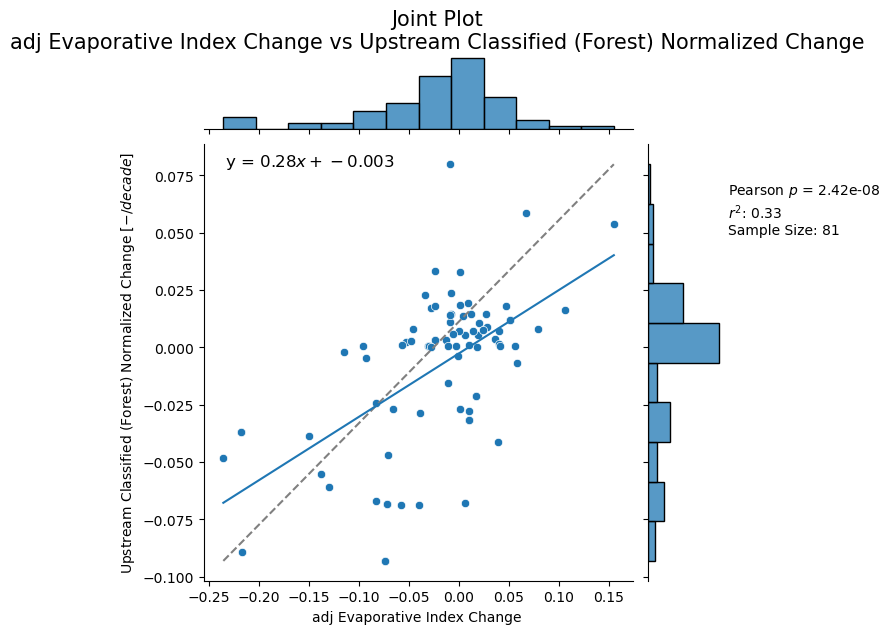

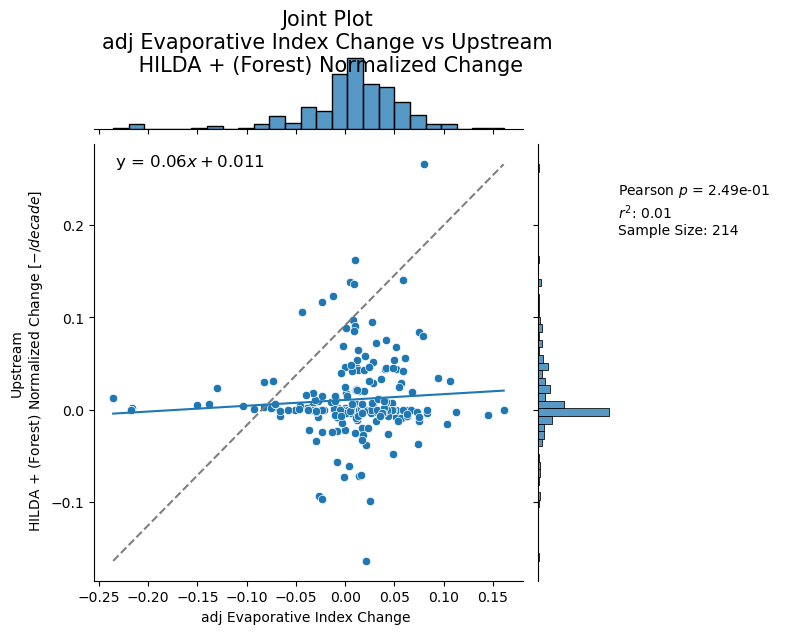

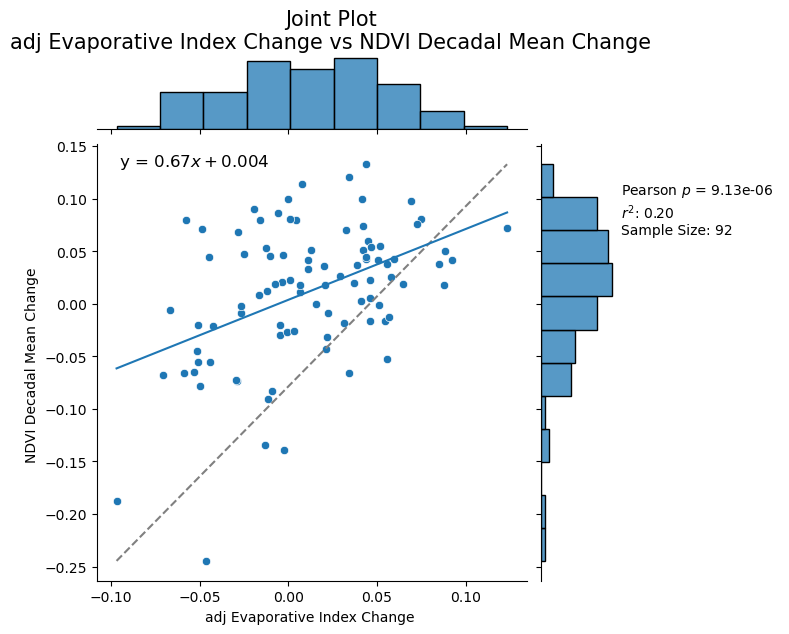

ValueError: 

^
ParseFatalException: Double superscript  (at char 0), (line:1, col:1)

<Figure size 600x600 with 3 Axes>

ValueError: 

^
ParseFatalException: Double superscript  (at char 0), (line:1, col:1)

<Figure size 600x600 with 3 Axes>

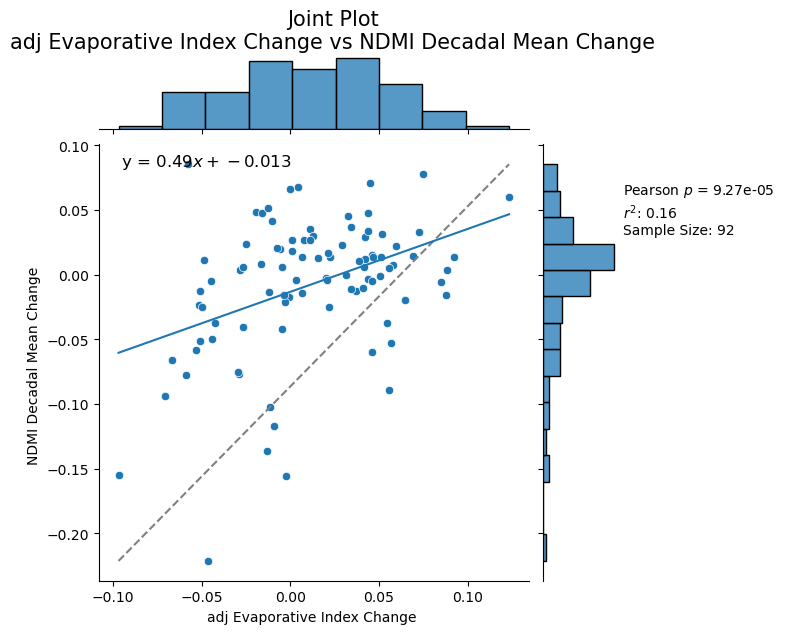

In [299]:
AI_levels = [0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2]

aridity_table_SR = merge_w_EI_adj.set_index('system_index').sort_values('LT_AI')
aridity_table_SR['AI_group_narrow'] = pd.cut(aridity_table_SR['LT_AI'], AI_levels, labels=labels, ordered=True)

scatter_vars2(aridity_table_SR[aridity_table_SR.AI_group_narrow==labels[2]],'adj_EI_change','ups_r_3_normalized_change',)
scatter_vars2(aridity_table_SR[aridity_table_SR.AI_group_narrow==labels[2]],'adj_EI_change','ups_h_4_normalized_change',)
scatter_vars2(aridity_table_SR[aridity_table_SR.AI_group_narrow==labels[3]],'adj_EI_change','NDVI_mean_change', True)
scatter_vars2(aridity_table_SR[aridity_table_SR.AI_group_narrow==labels[3]],'adj_EI_change','TCG_mean_change', True)
scatter_vars2(aridity_table_SR[aridity_table_SR.AI_group_narrow==labels[3]],'adj_EI_change','TCA_mean_change', True)
scatter_vars2(aridity_table_SR[aridity_table_SR.AI_group_narrow==labels[3]],'adj_EI_change','NDMI_mean_change', True)

In [285]:
merge_w_EI_adj

,index,tot_area_x,h_1,h_2,h_3,h_4,h_5,year_trained,catchment_area,h_6,...,LT_ST,LT_EI,LT_Pa,LT_AI,LT_Sr,LT_T,LT_is_dur,LT_Ep,LT_SI,adj_EI_change
6,5102,272.369829,NaN,NaN,196.276429,53.393481,22.620551,1988.9,272.369829,0.079369,...,NaN,0.317355,NaN,0.405524,96.561642,NaN,NaN,NaN,NaN,0.028093
7,5112,272.369829,NaN,NaN,177.608467,57.374088,37.327984,2000.0,272.369829,0.059289,...,NaN,0.317355,NaN,0.405524,96.561642,NaN,NaN,NaN,NaN,-0.041376
8,5122,272.369829,NaN,NaN,170.327407,60.119788,41.863344,2003.6,272.369829,0.059289,...,NaN,0.317355,NaN,0.405524,96.561642,NaN,NaN,NaN,NaN,0.015304
15,1146,194.933722,7.084879,7.582641,172.921809,2.072868,5.363984,1988.9,194.933722,-0.092459,...,NaN,0.348859,NaN,0.452201,118.551469,NaN,NaN,NaN,NaN,0.072319
16,1156,194.933722,14.066204,5.499649,166.789138,2.623881,6.047308,2000.0,194.933722,-0.092459,...,NaN,0.348859,NaN,0.452201,118.551469,NaN,NaN,NaN,NaN,0.000498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2380,460,2681.514071,605.676328,906.526977,632.291490,467.894572,66.455070,2013.8,2681.514071,0.775273,...,0.031961,0.657058,807.306877,0.734874,225.637014,9.965816,4.039568,593.269151,0.178799,-0.082465
2387,82,189.952638,7.566952,0.150594,117.517850,63.696575,0.678348,2013.8,189.952638,0.342320,...,0.041235,0.436862,1171.631250,0.512991,179.215833,9.445414,3.747368,601.036329,0.223754,-0.189066
2394,124,550.486854,23.812705,19.166111,155.025828,340.385155,12.261055,2013.8,550.486854,-0.164000,...,0.039243,0.551366,937.030181,0.636550,189.883469,9.172218,3.722222,596.466324,0.217324,-0.065994
2401,334,123.921347,17.058695,63.001764,12.151182,28.238467,3.686951,2013.8,123.921347,0.152982,...,0.016009,0.600129,792.368353,0.746131,183.782580,10.026851,3.891379,591.210802,0.187355,-0.070730
